In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import pandas as pd
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader, TensorDataset
import torch
import matplotlib.pyplot as plt
import numpy as np
import random

In [4]:
# Function to load images and labels

def load_data(root_dir, csv_file, transform=None):
    annotations = pd.read_csv(csv_file)
    images = []
    labels = []

    for index, row in annotations.iterrows():
        img_name = os.path.join(root_dir, row['filename'])
        image = Image.open(img_name).convert("RGB")

        # Applying our transformations
        if transform:
            image = transform(image)

        # creating multilabel tensor with two values
        # [1, 0] if image has dog but no person
        label = torch.tensor([row['dog'], row['person']], dtype=torch.float32)

        images.append(image)
        labels.append(label)

    # Stack into tensors
    images = torch.stack(images)
    labels = torch.stack(labels)

    return TensorDataset(images, labels)

In [5]:
#augmentations

transform = transforms.Compose([
    transforms.Pad((0, 0, 0, 0), fill=0), # Adding padding
    transforms.Resize((224, 224)),        # Resize to 224x224 after padding
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])



# directories to the dataset

#kaggle dataset
train_dir = "/kaggle/input/thermal-dogs-and-humans/Thermal Dogs and People-4/train"
val_dir = "/kaggle/input/thermal-dogs-and-humans/Thermal Dogs and People-4/valid"
test_dir = "/kaggle/input/thermal-dogs-and-humans/Thermal Dogs and People-4/test"

# path to the labels
train_csv = "/kaggle/input/thermal-dogs-and-humans/Thermal Dogs and People-4/train/_classes.csv"
val_csv = "/kaggle/input/thermal-dogs-and-humans/Thermal Dogs and People-4/valid/_classes.csv"
test_csv = "/kaggle/input/thermal-dogs-and-humans/Thermal Dogs and People-4/test/_classes.csv"

In [ ]:
#local dataset
# train_dir = "Thermal Dogs and People-4/train"
# val_dir = "Thermal Dogs and People-4/valid"
# test_dir = "Thermal Dogs and People-4/test"

# train_csv = "Thermal Dogs and People-4/train/_classes.csv"
# val_csv = "Thermal Dogs and People-4/valid/_classes.csv"
# test_csv = "Thermal Dogs and People-4/test/_classes.csv"

In [16]:
os. getcwd()

'/kaggle/working'

In [6]:
# Loadingg datasets

train_dataset = load_data(train_dir, train_csv, transform=transform)
val_dataset = load_data(val_dir, val_csv, transform=transform)
test_dataset = load_data(test_dir, test_csv, transform=transform)

In [ ]:
print(test_dataset)

In [8]:
# Creating data loaders

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
print(test_loader)

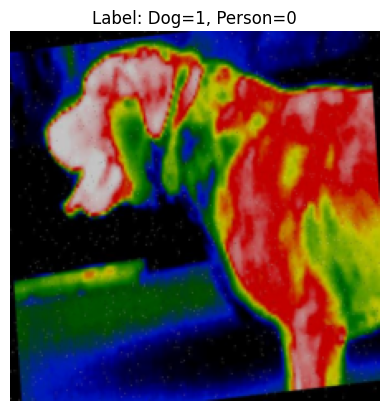

In [ ]:
# Get images and labels from the training loader

images, labels = next(iter(train_loader))
image = images[0]
label = labels[0]
image = image * 0.5 + 0.5  # Unnormalize
image = image.permute(1, 2, 0)  # Rearrange dimensions for matplotlib (H, W, C)

# Display
plt.imshow(image)
plt.title(f"Label: Dog={int(label[0].item())}, Person={int(label[1].item())}")
plt.axis('off')
plt.show()

In [9]:
def define_model(model):

    model = model

    # Modify the final layer for 2 outputs (for dog and person labels)
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, 2)

    #for GPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    
    return model,device


In [10]:
def train(model,device,criterion,optimizer):

    # Lists to store the training and validation losses
    train_losses = []
    val_losses = []

    # Numer of loops
    num_epochs = 50

    for epoch in range(num_epochs):
        # Setting the model to training mode
        model.train()
        running_loss = 0.0

        # Training
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

        # average loss calculation
        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)  # Store train loss

        # Validation
        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)

                # Forward pass
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)  # Store validation loss


        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")



    return train_losses, val_losses

In [11]:
def visualize_losses(train_losses, val_losses,num_epochs=50):
    
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss over Epochs')
    plt.legend()
    plt.show()

In [12]:
def create_dataloaders(transform,batch_size=32):

    train_dataset = load_data(train_dir, train_csv, transform=transform)
    val_dataset = load_data(val_dir, val_csv, transform=transform)
    test_dataset = load_data(test_dir, test_csv, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    return train_loader, val_loader, test_loader

# ResNet-18 from scratch

In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

In [ ]:
resnet18, device = define_model(models.resnet18(weights=None))# weights=None to train from scratch


learning_rate = 0.001
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet18.parameters(), lr=0.001)

In [ ]:
train_losses, val_losses = train(resnet18,device,criterion,optimizer)

Epoch [1/50], Train Loss: 0.7361, Val Loss: 7.8502
Epoch [2/50], Train Loss: 0.5828, Val Loss: 0.7111
Epoch [3/50], Train Loss: 0.4884, Val Loss: 0.6894
Epoch [4/50], Train Loss: 0.4463, Val Loss: 0.3948
Epoch [5/50], Train Loss: 0.3809, Val Loss: 0.3879
Epoch [6/50], Train Loss: 0.3327, Val Loss: 0.3751
Epoch [7/50], Train Loss: 0.2984, Val Loss: 0.4298
Epoch [8/50], Train Loss: 0.3256, Val Loss: 0.4398
Epoch [9/50], Train Loss: 0.2631, Val Loss: 0.3668
Epoch [10/50], Train Loss: 0.2268, Val Loss: 0.2966
Epoch [11/50], Train Loss: 0.2012, Val Loss: 0.2653
Epoch [12/50], Train Loss: 0.1648, Val Loss: 0.3145
Epoch [13/50], Train Loss: 0.1281, Val Loss: 0.4548
Epoch [14/50], Train Loss: 0.1092, Val Loss: 0.3918
Epoch [15/50], Train Loss: 0.1275, Val Loss: 0.5365
Epoch [16/50], Train Loss: 0.1314, Val Loss: 0.4956
Epoch [17/50], Train Loss: 0.1499, Val Loss: 1.3050
Epoch [18/50], Train Loss: 0.1117, Val Loss: 0.4674
Epoch [19/50], Train Loss: 0.0837, Val Loss: 0.3317
Epoch [20/50], Train 

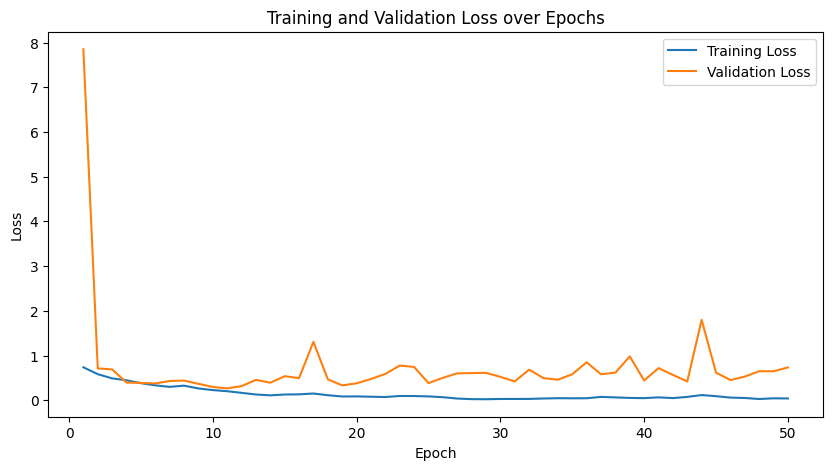

In [ ]:
visualize_losses(train_losses, val_losses)

### Trying Data augmentation, weight decay and reduced learning rate

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),  # Randomly flip images horizontally
    transforms.RandomRotation(15),  # Randomly rotate images by up to 15 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Adjust brightness and contrast
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])

])



# transform = transforms.Compose([
#     transforms.Pad((0, 0, 0, 0), fill=0), # Add padding to make it square, adjust as necessary
#     transforms.Resize((224, 224)),        # Resize to 224x224 after padding
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
# ])

train_loader, val_loader, test_loader = create_dataloaders(transform)

In [ ]:
resnet18, device = define_model(models.resnet18(weights=None))# weights=None to train from scratch

learning_rate = 1e-5
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet18.parameters(), lr=learning_rate, weight_decay=1e-5)

In [ ]:
train_losses, val_losses = train(resnet18,device,criterion,optimizer)

Epoch [1/50], Train Loss: 0.6885, Val Loss: 0.7002
Epoch [2/50], Train Loss: 0.6444, Val Loss: 0.7034
Epoch [3/50], Train Loss: 0.6156, Val Loss: 0.6547
Epoch [4/50], Train Loss: 0.5863, Val Loss: 0.6023
Epoch [5/50], Train Loss: 0.5649, Val Loss: 0.5677
Epoch [6/50], Train Loss: 0.5339, Val Loss: 0.5478
Epoch [7/50], Train Loss: 0.4951, Val Loss: 0.5256
Epoch [8/50], Train Loss: 0.4702, Val Loss: 0.4890
Epoch [9/50], Train Loss: 0.4282, Val Loss: 0.4671
Epoch [10/50], Train Loss: 0.3961, Val Loss: 0.4493
Epoch [11/50], Train Loss: 0.3763, Val Loss: 0.4286
Epoch [12/50], Train Loss: 0.3232, Val Loss: 0.4096
Epoch [13/50], Train Loss: 0.2965, Val Loss: 0.3853
Epoch [14/50], Train Loss: 0.2516, Val Loss: 0.3710
Epoch [15/50], Train Loss: 0.2289, Val Loss: 0.3685
Epoch [16/50], Train Loss: 0.1916, Val Loss: 0.3474
Epoch [17/50], Train Loss: 0.1669, Val Loss: 0.3225
Epoch [18/50], Train Loss: 0.1631, Val Loss: 0.3915
Epoch [19/50], Train Loss: 0.1283, Val Loss: 0.3110
Epoch [20/50], Train 

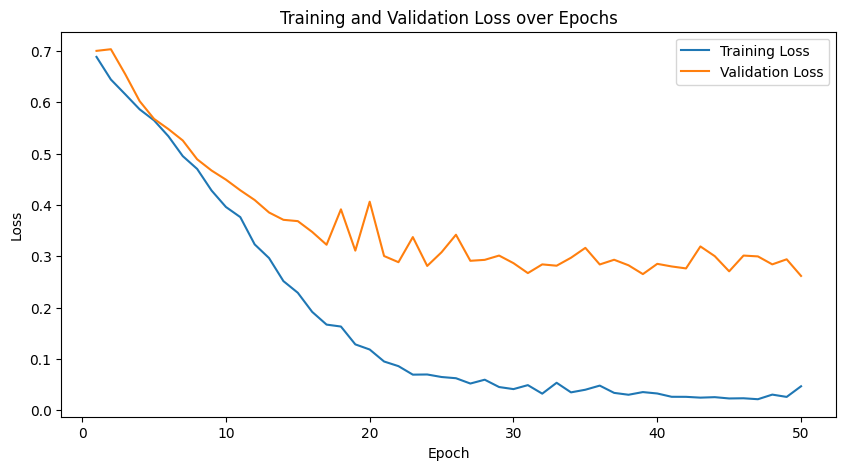

In [ ]:
visualize_losses(train_losses, val_losses)

# Early stopping added

In [22]:
def train(model, device, criterion, optimizer, num_epochs=50, patience=5):

    # Lists to store
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    # Early stopping variables
    best_val_loss = float('inf')
    patience_counter = 0

    # Training and validation loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        # Training
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

            # Calculating training accuracy
            preds = torch.sigmoid(outputs) > 0.5  # threshold of 0.5. if pred>0.5 correct outpuy
            correct_train += (preds == labels.bool()).sum().item()
            total_train += labels.numel()


        # Calculatimg average loss and accuracy
        avg_train_loss = running_loss / len(train_loader)
        train_accuracy = correct_train / total_train
        train_losses.append(avg_train_loss)
        train_accuracies.append(train_accuracy)

        # Validation 
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)

                # Forward pass
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                # Calculating validation accuracy
                preds = torch.sigmoid(outputs) > 0.5
                correct_val += (preds == labels.bool()).sum().item()
                total_val += labels.numel()

        avg_val_loss = val_loss / len(val_loader)
        val_accuracy = correct_val / total_val
        val_losses.append(avg_val_loss)
        val_accuracies.append(val_accuracy)

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, "
              f"Train Acc: {train_accuracy:.4f}, Val Acc: {val_accuracy:.4f}")


        # Early stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0  # Reset patience counter if validation loss improves
        else:
            patience_counter += 1  # Increment the counter if no improvement
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break



    # Plot changed to here for easy runnnig
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
    plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss over Epochs')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label='Training Accuracy')
    plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy over Epochs')
    plt.legend()
    plt.show()

    return train_losses, val_losses, train_accuracies, val_accuracies

Epoch [1/50], Train Loss: 0.6762, Val Loss: 0.6988, Train Acc: 0.5610, Val Acc: 0.5366
Epoch [2/50], Train Loss: 0.6322, Val Loss: 0.6906, Train Acc: 0.6279, Val Acc: 0.5976
Epoch [3/50], Train Loss: 0.5982, Val Loss: 0.6317, Train Acc: 0.7136, Val Acc: 0.5854
Epoch [4/50], Train Loss: 0.5763, Val Loss: 0.5997, Train Acc: 0.7477, Val Acc: 0.7317
Epoch [5/50], Train Loss: 0.5401, Val Loss: 0.5881, Train Acc: 0.7829, Val Acc: 0.6829
Epoch [6/50], Train Loss: 0.4953, Val Loss: 0.5564, Train Acc: 0.8134, Val Acc: 0.7317
Epoch [7/50], Train Loss: 0.4587, Val Loss: 0.5107, Train Acc: 0.8415, Val Acc: 0.7561
Epoch [8/50], Train Loss: 0.4157, Val Loss: 0.4913, Train Acc: 0.8662, Val Acc: 0.7317
Epoch [9/50], Train Loss: 0.3904, Val Loss: 0.4785, Train Acc: 0.8744, Val Acc: 0.7317
Epoch [10/50], Train Loss: 0.3461, Val Loss: 0.4238, Train Acc: 0.8991, Val Acc: 0.8049
Epoch [11/50], Train Loss: 0.3206, Val Loss: 0.4019, Train Acc: 0.9085, Val Acc: 0.8049
Epoch [12/50], Train Loss: 0.2630, Val Lo

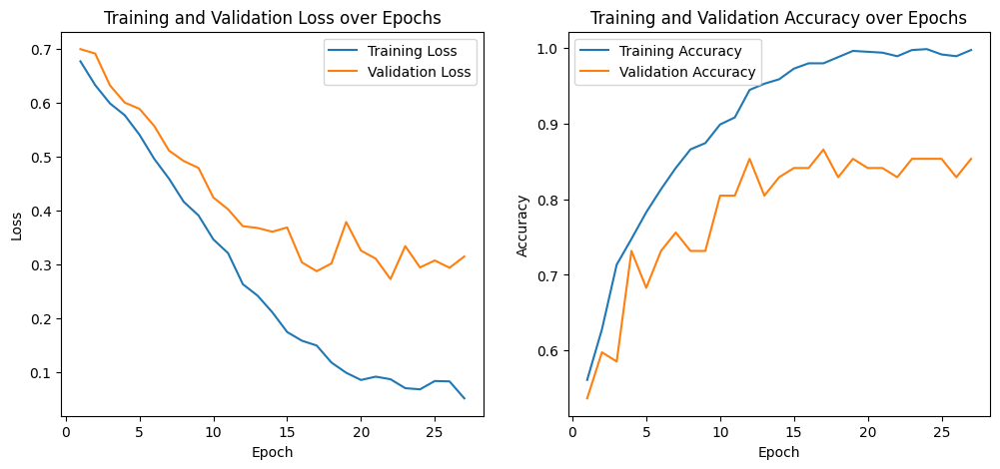

In [ ]:
resnet18, device = define_model(models.resnet18(weights=None))# weights=None to train from scratch



#loss function and optimizer
learning_rate = 1e-5
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet18.parameters(), lr=learning_rate, weight_decay=1e-5)

train_losses, val_losses, train_accuracies, val_accuracies = train(resnet18,device,criterion,optimizer)

In [30]:
def test_model(model, test_loader, device,criterion=nn.BCEWithLogitsLoss()):

    model.eval()
    test_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            # Apply sigmoid to outputs for multilabel thresholding
            preds = torch.sigmoid(outputs) > 0.5  # Threshold at 0.5
            correct_predictions += (preds == labels.bool()).sum().item()
            total_predictions += labels.numel()  # Total number of labels

    # Calculate average test loss and accuracy
    avg_test_loss = test_loss / len(test_loader)
    accuracy = (correct_predictions / total_predictions)* 100  # accuracy
    print(f"Test Loss: {avg_test_loss:.4f}, Accuracy: {accuracy:.2f}")
    
    return accuracy

In [ ]:
accuracy = test_model(resnet18, test_loader, device)

print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.3664, Accuracy: 82.50
Test Accuracy: 82.50%


In [ ]:
# for name, param in resnet18.named_parameters():

#     if param.requires_grad:  # Only display learnable parameters

#         print(f"Layer: {name}")

#         print(f"Weights: {param.data}")

#         print(f"Shape: {param.shape}")

#         print()



torch.save(resnet18.state_dict(), 'resnet18_scratch_weights.pth')


# Pre-trained ResNet-18

Epoch [1/50], Train Loss: 0.6667, Val Loss: 0.5953, Train Acc: 0.5634, Val Acc: 0.6098
Epoch [2/50], Train Loss: 0.5459, Val Loss: 0.5172, Train Acc: 0.7629, Val Acc: 0.7317
Epoch [3/50], Train Loss: 0.4564, Val Loss: 0.4519, Train Acc: 0.8568, Val Acc: 0.8293
Epoch [4/50], Train Loss: 0.3894, Val Loss: 0.3936, Train Acc: 0.9061, Val Acc: 0.8415
Epoch [5/50], Train Loss: 0.3328, Val Loss: 0.3468, Train Acc: 0.9272, Val Acc: 0.8537
Epoch [6/50], Train Loss: 0.2995, Val Loss: 0.3175, Train Acc: 0.9519, Val Acc: 0.8537
Epoch [7/50], Train Loss: 0.2461, Val Loss: 0.2890, Train Acc: 0.9707, Val Acc: 0.8659
Epoch [8/50], Train Loss: 0.2270, Val Loss: 0.2616, Train Acc: 0.9671, Val Acc: 0.8780
Epoch [9/50], Train Loss: 0.1942, Val Loss: 0.2399, Train Acc: 0.9789, Val Acc: 0.8902
Epoch [10/50], Train Loss: 0.1655, Val Loss: 0.2263, Train Acc: 0.9836, Val Acc: 0.8902
Epoch [11/50], Train Loss: 0.1378, Val Loss: 0.2107, Train Acc: 0.9941, Val Acc: 0.9268
Epoch [12/50], Train Loss: 0.1270, Val Lo

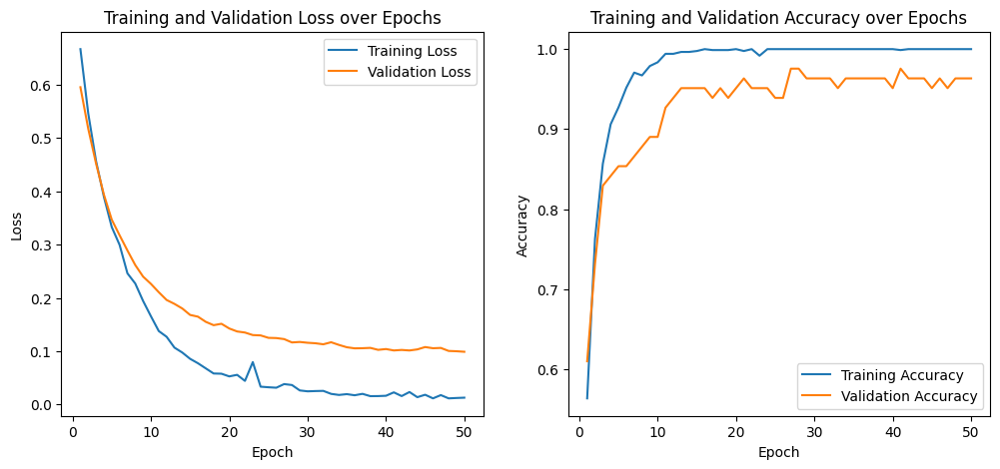

In [ ]:
#resnet18_pretrained = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

resnet18_pretrained, device = define_model(models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1))

#loss function and optimizer
learning_rate = 1e-5
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet18_pretrained.parameters(), lr=learning_rate, weight_decay=1e-4)

train_losses, val_losses, train_accuracies, val_accuracies = train(resnet18_pretrained,device,criterion,optimizer)

In [ ]:
accuracy = test_model(resnet18_pretrained, test_loader, device)

print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.0761, Accuracy: 97.50
Test Accuracy: 97.50%


# MobileNet

Epoch [1/100], Train Loss: 0.7046, Val Loss: 0.6595, Train Acc: 0.5270, Val Acc: 0.5610
Epoch [2/100], Train Loss: 0.6817, Val Loss: 0.6375, Train Acc: 0.5657, Val Acc: 0.5732
Epoch [3/100], Train Loss: 0.6600, Val Loss: 0.6256, Train Acc: 0.6045, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.6472, Val Loss: 0.6091, Train Acc: 0.6244, Val Acc: 0.5854
Epoch [5/100], Train Loss: 0.6352, Val Loss: 0.5945, Train Acc: 0.6549, Val Acc: 0.6341
Epoch [6/100], Train Loss: 0.6155, Val Loss: 0.5771, Train Acc: 0.6890, Val Acc: 0.6585
Epoch [7/100], Train Loss: 0.6037, Val Loss: 0.5661, Train Acc: 0.6878, Val Acc: 0.6707
Epoch [8/100], Train Loss: 0.5861, Val Loss: 0.5532, Train Acc: 0.7042, Val Acc: 0.7195
Epoch [9/100], Train Loss: 0.5755, Val Loss: 0.5417, Train Acc: 0.7171, Val Acc: 0.7195
Epoch [10/100], Train Loss: 0.5718, Val Loss: 0.5335, Train Acc: 0.7441, Val Acc: 0.7927
Epoch [11/100], Train Loss: 0.5642, Val Loss: 0.5234, Train Acc: 0.7535, Val Acc: 0.8171
Epoch [12/100], Train Loss: 0.

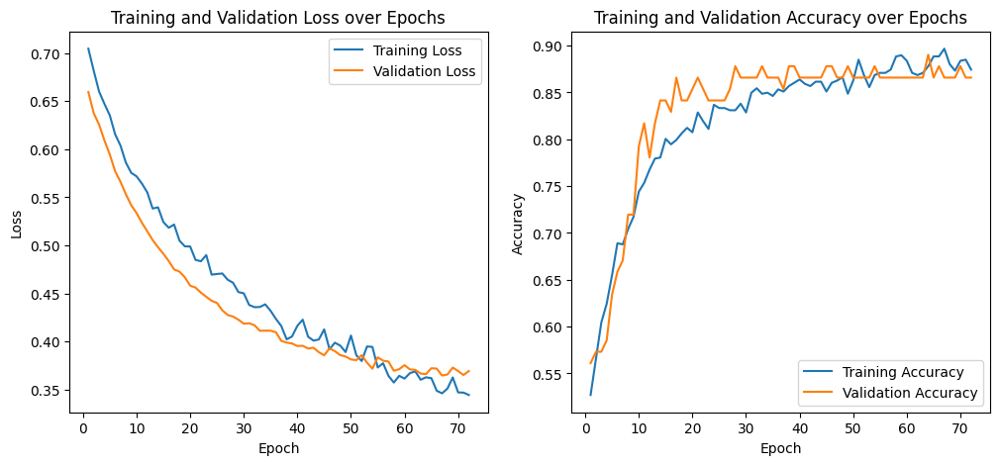

In [ ]:
mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)

# final fully connected layer to output 2 nodes (for dog and person)
num_features = mobilenet.classifier[1].in_features
mobilenet.classifier[1] = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

mobilenet = mobilenet.to(device)

#loss function and optimizer
learning_rate = 1e-4
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(mobilenet.classifier[1].parameters(), lr=learning_rate, weight_decay=1e-4)

train_losses, val_losses, train_accuracies, val_accuracies = train(mobilenet,device,criterion,optimizer,num_epochs=100)

In [ ]:
accuracy = test_model(mobilenet, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.3259, Accuracy: 90.00
Test Accuracy: 90.00%


### Mobilenet - learing rate 0.0001

Epoch [1/100], Train Loss: 0.7105, Val Loss: 0.6645, Train Acc: 0.4812, Val Acc: 0.5976
Epoch [2/100], Train Loss: 0.6841, Val Loss: 0.6577, Train Acc: 0.5552, Val Acc: 0.5854
Epoch [3/100], Train Loss: 0.6783, Val Loss: 0.6458, Train Acc: 0.5763, Val Acc: 0.5854
Epoch [4/100], Train Loss: 0.6562, Val Loss: 0.6301, Train Acc: 0.6068, Val Acc: 0.6463
Epoch [5/100], Train Loss: 0.6505, Val Loss: 0.6138, Train Acc: 0.6350, Val Acc: 0.6829
Epoch [6/100], Train Loss: 0.6291, Val Loss: 0.5973, Train Acc: 0.6585, Val Acc: 0.6829
Epoch [7/100], Train Loss: 0.6164, Val Loss: 0.5868, Train Acc: 0.6749, Val Acc: 0.6829
Epoch [8/100], Train Loss: 0.6218, Val Loss: 0.5718, Train Acc: 0.6749, Val Acc: 0.7195
Epoch [9/100], Train Loss: 0.6051, Val Loss: 0.5614, Train Acc: 0.6972, Val Acc: 0.7683
Epoch [10/100], Train Loss: 0.5856, Val Loss: 0.5509, Train Acc: 0.7347, Val Acc: 0.7561
Epoch [11/100], Train Loss: 0.5741, Val Loss: 0.5377, Train Acc: 0.7324, Val Acc: 0.7805
Epoch [12/100], Train Loss: 0.

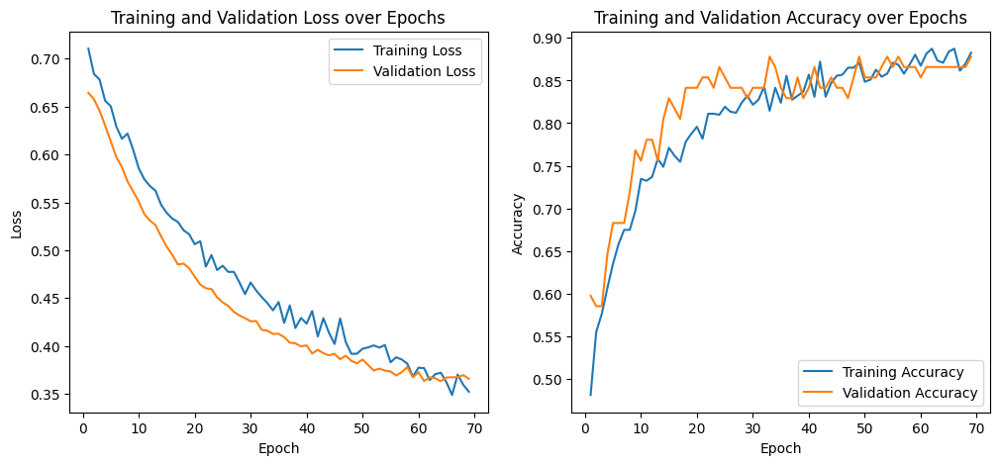

In [ ]:
mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)

# Modify the final fully connected layer to output 2 nodes (for dog and person)
num_features = mobilenet.classifier[1].in_features
mobilenet.classifier[1] = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobilenet = mobilenet.to(device)

#loss function and optimizer
learning_rate = 0.0001
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(mobilenet.classifier[1].parameters(), lr=learning_rate, weight_decay=1e-3)

train_losses, val_losses, train_accuracies, val_accuracies = train(mobilenet,device,criterion,optimizer,num_epochs=100)

In [ ]:
accuracy = test_model(mobilenet, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.3243, Accuracy: 85.00
Test Accuracy: 85.00%


### Mobilenet - SGD

Epoch [1/100], Train Loss: 0.7207, Val Loss: 0.7157, Train Acc: 0.5106, Val Acc: 0.5244
Epoch [2/100], Train Loss: 0.7140, Val Loss: 0.7184, Train Acc: 0.5246, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.7112, Val Loss: 0.7159, Train Acc: 0.5117, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.7119, Val Loss: 0.7103, Train Acc: 0.5035, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.7046, Val Loss: 0.7078, Train Acc: 0.5082, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.7055, Val Loss: 0.6993, Train Acc: 0.5117, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6982, Val Loss: 0.6970, Train Acc: 0.5293, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6958, Val Loss: 0.6918, Train Acc: 0.5423, Val Acc: 0.5488
Epoch [9/100], Train Loss: 0.6922, Val Loss: 0.6915, Train Acc: 0.5293, Val Acc: 0.5610
Epoch [10/100], Train Loss: 0.6864, Val Loss: 0.6884, Train Acc: 0.5458, Val Acc: 0.5732
Epoch [11/100], Train Loss: 0.6951, Val Loss: 0.6851, Train Acc: 0.5270, Val Acc: 0.5610
Epoch [12/100], Train Loss: 0.

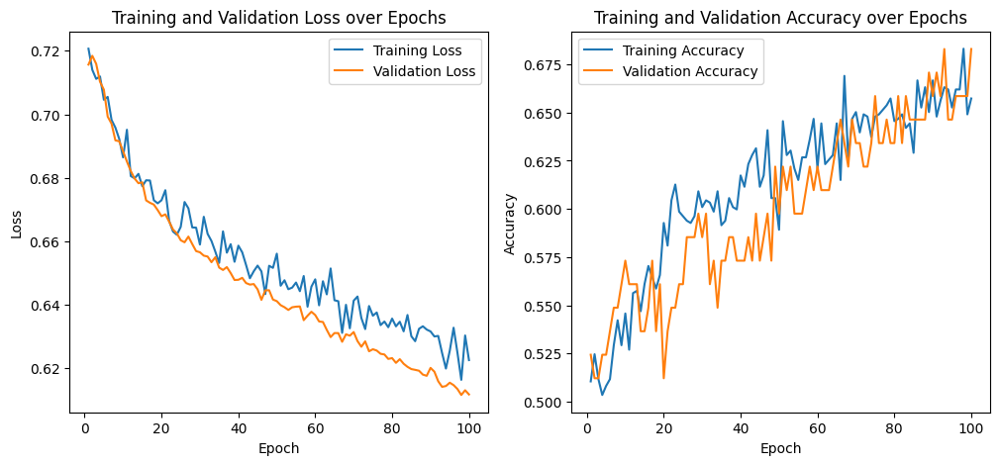

In [ ]:
mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)

# Modify the final fully connected layer to output 2 nodes (for dog and person)
num_features = mobilenet.classifier[1].in_features
mobilenet.classifier[1] = nn.Linear(num_features, 2)

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobilenet = mobilenet.to(device)

#loss function and optimizer
learning_rate = 1e-4
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.SGD(mobilenet.classifier[1].parameters(), lr=learning_rate, weight_decay=1e-5)

train_losses, val_losses, train_accuracies, val_accuracies = train(mobilenet,device,criterion,optimizer,num_epochs=100)

In [ ]:
accuracy = test_model(mobilenet, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.6300, Accuracy: 67.50
Test Accuracy: 67.50%


### Mobilenet - Reducing batch size to 16

Epoch [1/100], Train Loss: 0.6717, Val Loss: 0.6572, Train Acc: 0.5751, Val Acc: 0.5488
Epoch [2/100], Train Loss: 0.6569, Val Loss: 0.6284, Train Acc: 0.6080, Val Acc: 0.5976
Epoch [3/100], Train Loss: 0.6367, Val Loss: 0.6064, Train Acc: 0.6279, Val Acc: 0.6220
Epoch [4/100], Train Loss: 0.6108, Val Loss: 0.5903, Train Acc: 0.7124, Val Acc: 0.6585
Epoch [5/100], Train Loss: 0.5997, Val Loss: 0.5703, Train Acc: 0.6843, Val Acc: 0.6707
Epoch [6/100], Train Loss: 0.5855, Val Loss: 0.5580, Train Acc: 0.7148, Val Acc: 0.6951
Epoch [7/100], Train Loss: 0.5802, Val Loss: 0.5430, Train Acc: 0.7254, Val Acc: 0.7195
Epoch [8/100], Train Loss: 0.5558, Val Loss: 0.5293, Train Acc: 0.7735, Val Acc: 0.7439
Epoch [9/100], Train Loss: 0.5435, Val Loss: 0.5182, Train Acc: 0.7535, Val Acc: 0.7683
Epoch [10/100], Train Loss: 0.5402, Val Loss: 0.5061, Train Acc: 0.7887, Val Acc: 0.7927
Epoch [11/100], Train Loss: 0.5271, Val Loss: 0.4985, Train Acc: 0.7829, Val Acc: 0.8049
Epoch [12/100], Train Loss: 0.

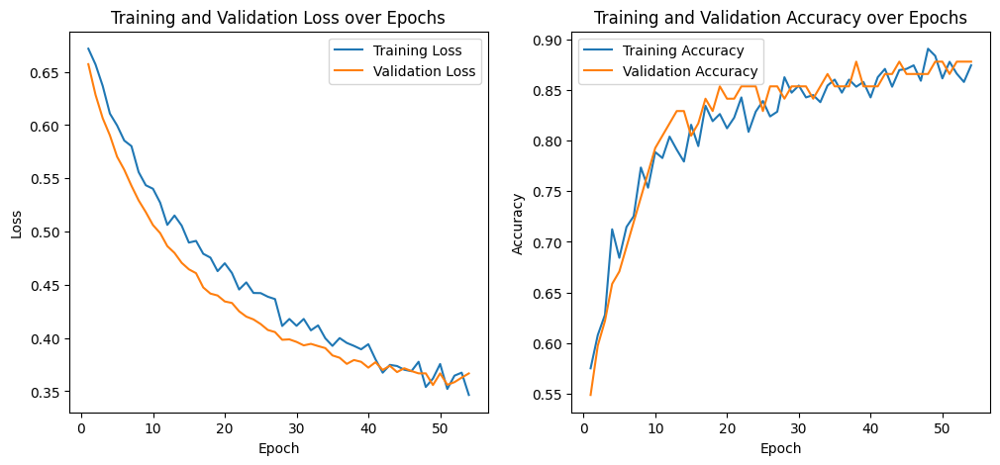

In [ ]:
train_loader, val_loader, test_loader = create_dataloaders(transform,16)

mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)

# Modify the final fully connected layer to output 2 nodes (for dog and person)
num_features = mobilenet.classifier[1].in_features
mobilenet.classifier[1] = nn.Linear(num_features, 2)

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobilenet = mobilenet.to(device)

#loss function and optimizer
learning_rate = 1e-4
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(mobilenet.classifier[1].parameters(), lr=learning_rate, weight_decay=1e-4)

train_losses, val_losses, train_accuracies, val_accuracies = train(mobilenet,device,criterion,optimizer,num_epochs=100)

In [ ]:
accuracy = test_model(mobilenet, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.3026, Accuracy: 90.00
Test Accuracy: 90.00%


### Mobilenet - increasing batch size to 64

Epoch [1/100], Train Loss: 0.6926, Val Loss: 0.6686, Train Acc: 0.5458, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6783, Val Loss: 0.6659, Train Acc: 0.5587, Val Acc: 0.5488
Epoch [3/100], Train Loss: 0.6687, Val Loss: 0.6632, Train Acc: 0.5763, Val Acc: 0.5610
Epoch [4/100], Train Loss: 0.6549, Val Loss: 0.6537, Train Acc: 0.6021, Val Acc: 0.6098
Epoch [5/100], Train Loss: 0.6459, Val Loss: 0.6399, Train Acc: 0.6150, Val Acc: 0.6098
Epoch [6/100], Train Loss: 0.6435, Val Loss: 0.6304, Train Acc: 0.6197, Val Acc: 0.6341
Epoch [7/100], Train Loss: 0.6299, Val Loss: 0.6213, Train Acc: 0.6538, Val Acc: 0.6341
Epoch [8/100], Train Loss: 0.6168, Val Loss: 0.6109, Train Acc: 0.6678, Val Acc: 0.6707
Epoch [9/100], Train Loss: 0.6118, Val Loss: 0.6013, Train Acc: 0.6819, Val Acc: 0.6707
Epoch [10/100], Train Loss: 0.6015, Val Loss: 0.5924, Train Acc: 0.6913, Val Acc: 0.6829
Epoch [11/100], Train Loss: 0.5993, Val Loss: 0.5862, Train Acc: 0.7113, Val Acc: 0.6707
Epoch [12/100], Train Loss: 0.

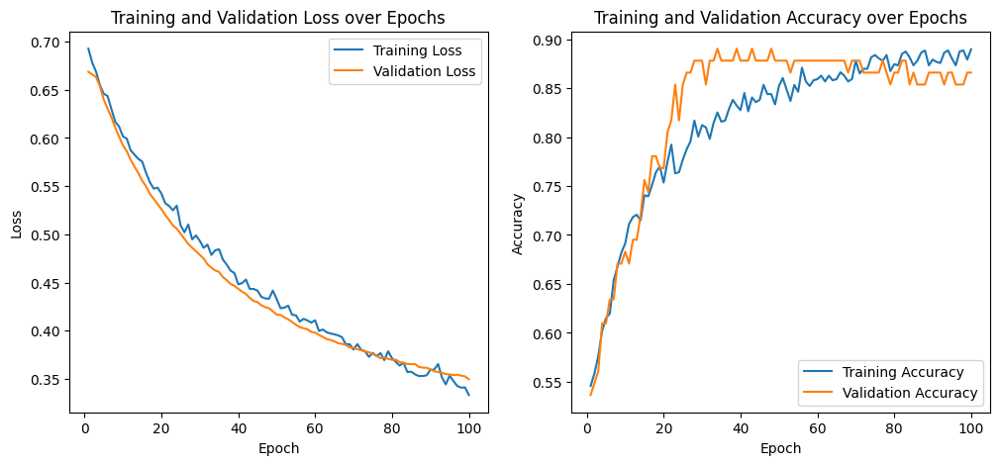

In [ ]:
train_loader, val_loader, test_loader = create_dataloaders(transform,64)

mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)

# Modify the final fully connected layer to output 2 nodes (for dog and person)
num_features = mobilenet.classifier[1].in_features
mobilenet.classifier[1] = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobilenet = mobilenet.to(device)

#loss function and optimizer
learning_rate = 1e-4
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(mobilenet.classifier[1].parameters(), lr=learning_rate, weight_decay=1e-4)

train_losses, val_losses, train_accuracies, val_accuracies = train(mobilenet,device,criterion,optimizer,num_epochs=100)

In [ ]:
accuracy = test_model(mobilenet, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.3089, Accuracy: 87.50
Test Accuracy: 87.50%


# AlexNet

In [14]:
from torchvision import models
import torch.nn as nn

In [29]:
train_loader, val_loader, test_loader = create_dataloaders(transform,32)

alexnet = models.alexnet(weights=models.AlexNet_Weights.IMAGENET1K_V1)

# last layer - allexnet has 6 layers
num_features = alexnet.classifier[6].in_features
alexnet.classifier[6] = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

for param in alexnet.features.parameters():
    param.requires_grad = False


In [30]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(alexnet.classifier[6].parameters(), lr=1e-4, weight_decay=1e-4)

Epoch [1/100], Train Loss: 0.6764, Val Loss: 0.6690, Train Acc: 0.5634, Val Acc: 0.5610
Epoch [2/100], Train Loss: 0.6073, Val Loss: 0.6075, Train Acc: 0.6737, Val Acc: 0.6463
Epoch [3/100], Train Loss: 0.5632, Val Loss: 0.5617, Train Acc: 0.7300, Val Acc: 0.7561
Epoch [4/100], Train Loss: 0.5335, Val Loss: 0.5224, Train Acc: 0.7582, Val Acc: 0.7805
Epoch [5/100], Train Loss: 0.5111, Val Loss: 0.4928, Train Acc: 0.7653, Val Acc: 0.7805
Epoch [6/100], Train Loss: 0.4972, Val Loss: 0.4773, Train Acc: 0.8087, Val Acc: 0.8537
Epoch [7/100], Train Loss: 0.4847, Val Loss: 0.4577, Train Acc: 0.8087, Val Acc: 0.8659
Epoch [8/100], Train Loss: 0.4571, Val Loss: 0.4399, Train Acc: 0.8040, Val Acc: 0.8780
Epoch [9/100], Train Loss: 0.4424, Val Loss: 0.4273, Train Acc: 0.8110, Val Acc: 0.8780
Epoch [10/100], Train Loss: 0.4257, Val Loss: 0.4105, Train Acc: 0.8345, Val Acc: 0.8780
Epoch [11/100], Train Loss: 0.4165, Val Loss: 0.3938, Train Acc: 0.8169, Val Acc: 0.8780
Epoch [12/100], Train Loss: 0.

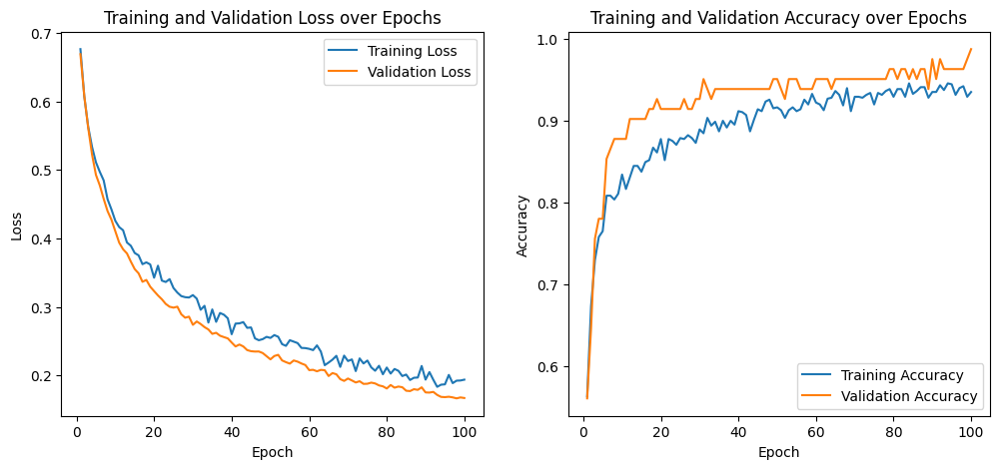

In [31]:
train_losses, val_losses, train_accuracies, val_accuracies = train(alexnet,device,criterion,optimizer,num_epochs=100)

In [32]:
accuracy = test_model(alexnet, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.2279, Accuracy: 92.50
Test Accuracy: 92.50%


### Alexnet - Learnig rate 0.0001

Epoch [1/100], Train Loss: 0.7052, Val Loss: 0.6346, Train Acc: 0.5481, Val Acc: 0.6098
Epoch [2/100], Train Loss: 0.6359, Val Loss: 0.5715, Train Acc: 0.6467, Val Acc: 0.7317
Epoch [3/100], Train Loss: 0.5765, Val Loss: 0.5308, Train Acc: 0.7500, Val Acc: 0.7683
Epoch [4/100], Train Loss: 0.5433, Val Loss: 0.4958, Train Acc: 0.7617, Val Acc: 0.8171
Epoch [5/100], Train Loss: 0.5173, Val Loss: 0.4646, Train Acc: 0.7676, Val Acc: 0.8293
Epoch [6/100], Train Loss: 0.4886, Val Loss: 0.4422, Train Acc: 0.7911, Val Acc: 0.8659
Epoch [7/100], Train Loss: 0.4675, Val Loss: 0.4219, Train Acc: 0.7981, Val Acc: 0.8659
Epoch [8/100], Train Loss: 0.4487, Val Loss: 0.4077, Train Acc: 0.8310, Val Acc: 0.8780
Epoch [9/100], Train Loss: 0.4365, Val Loss: 0.3958, Train Acc: 0.8310, Val Acc: 0.8659
Epoch [10/100], Train Loss: 0.4391, Val Loss: 0.3766, Train Acc: 0.8333, Val Acc: 0.8659
Epoch [11/100], Train Loss: 0.4097, Val Loss: 0.3730, Train Acc: 0.8462, Val Acc: 0.8659
Epoch [12/100], Train Loss: 0.

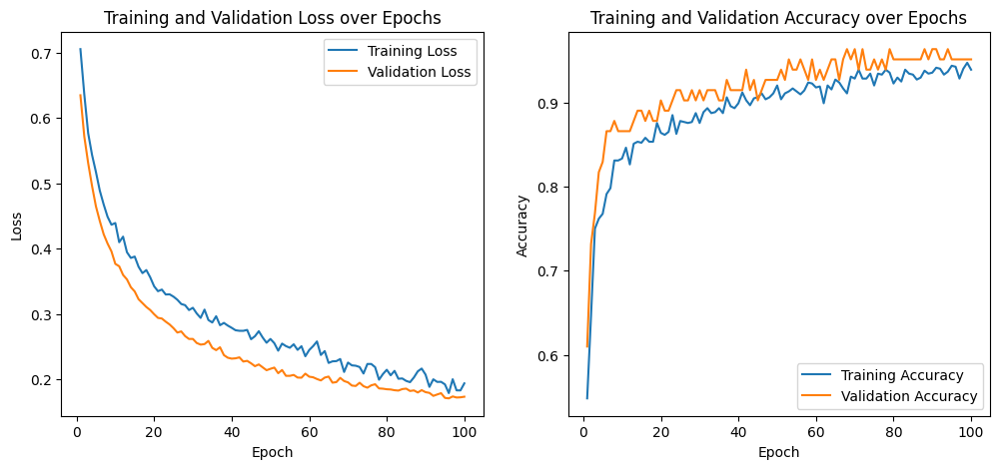

In [39]:
alexnet = models.alexnet(weights=models.AlexNet_Weights.IMAGENET1K_V1)

num_features = alexnet.classifier[6].in_features
alexnet.classifier[6] = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

# for param in alexnet.features.parameters():
#     param.requires_grad = False

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(alexnet.classifier[6].parameters(), lr=0.0001)

train_losses, val_losses, train_accuracies, val_accuracies = train(alexnet,device,criterion,optimizer,num_epochs=100)

In [40]:
accuracy = test_model(alexnet, test_loader, device)

print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.2259, Accuracy: 90.00
Test Accuracy: 90.00%


### Alexnet - SGD

Epoch [1/100], Train Loss: 0.7582, Val Loss: 0.7058, Train Acc: 0.4671, Val Acc: 0.4878
Epoch [2/100], Train Loss: 0.7263, Val Loss: 0.6854, Train Acc: 0.4894, Val Acc: 0.5854
Epoch [3/100], Train Loss: 0.7110, Val Loss: 0.6693, Train Acc: 0.5106, Val Acc: 0.5976
Epoch [4/100], Train Loss: 0.6935, Val Loss: 0.6568, Train Acc: 0.5423, Val Acc: 0.5976
Epoch [5/100], Train Loss: 0.6842, Val Loss: 0.6464, Train Acc: 0.5704, Val Acc: 0.6220
Epoch [6/100], Train Loss: 0.6717, Val Loss: 0.6371, Train Acc: 0.5880, Val Acc: 0.6220
Epoch [7/100], Train Loss: 0.6627, Val Loss: 0.6282, Train Acc: 0.6138, Val Acc: 0.6220
Epoch [8/100], Train Loss: 0.6638, Val Loss: 0.6206, Train Acc: 0.6162, Val Acc: 0.6463
Epoch [9/100], Train Loss: 0.6656, Val Loss: 0.6139, Train Acc: 0.6009, Val Acc: 0.6707
Epoch [10/100], Train Loss: 0.6498, Val Loss: 0.6069, Train Acc: 0.6209, Val Acc: 0.6707
Epoch [11/100], Train Loss: 0.6440, Val Loss: 0.6003, Train Acc: 0.6596, Val Acc: 0.6951
Epoch [12/100], Train Loss: 0.

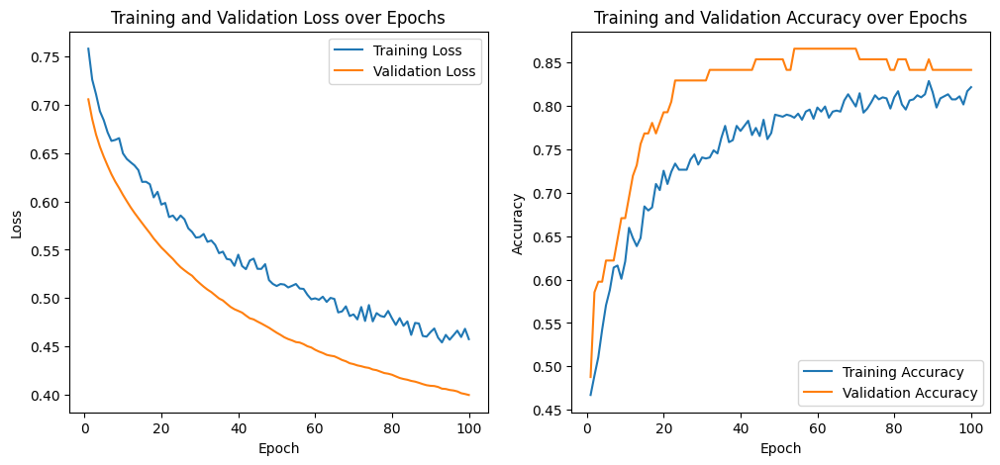

In [42]:
alexnet = models.alexnet(weights=models.AlexNet_Weights.IMAGENET1K_V1)

num_features = alexnet.classifier[6].in_features
alexnet.classifier[6] = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

# for param in alexnet.features.parameters():
#     param.requires_grad = False

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.SGD(alexnet.classifier[6].parameters(), lr=1e-4)
train_losses, val_losses, train_accuracies, val_accuracies = train(alexnet,device,criterion,optimizer,num_epochs=100)

In [43]:
accuracy = test_model(alexnet, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.3628, Accuracy: 97.50
Test Accuracy: 97.50%


Epoch [1/100], Train Loss: 0.6817, Val Loss: 0.6390, Train Acc: 0.5575, Val Acc: 0.5732
Epoch [2/100], Train Loss: 0.6289, Val Loss: 0.5806, Train Acc: 0.6256, Val Acc: 0.6829
Epoch [3/100], Train Loss: 0.5917, Val Loss: 0.5356, Train Acc: 0.6784, Val Acc: 0.7073
Epoch [4/100], Train Loss: 0.5651, Val Loss: 0.5003, Train Acc: 0.7324, Val Acc: 0.7805
Epoch [5/100], Train Loss: 0.5261, Val Loss: 0.4866, Train Acc: 0.7606, Val Acc: 0.8049
Epoch [6/100], Train Loss: 0.5135, Val Loss: 0.4551, Train Acc: 0.7664, Val Acc: 0.8171
Epoch [7/100], Train Loss: 0.5009, Val Loss: 0.4410, Train Acc: 0.7805, Val Acc: 0.8293
Epoch [8/100], Train Loss: 0.4877, Val Loss: 0.4275, Train Acc: 0.7876, Val Acc: 0.8293
Epoch [9/100], Train Loss: 0.4783, Val Loss: 0.4138, Train Acc: 0.7746, Val Acc: 0.8171
Epoch [10/100], Train Loss: 0.4690, Val Loss: 0.4061, Train Acc: 0.7958, Val Acc: 0.8415
Epoch [11/100], Train Loss: 0.4570, Val Loss: 0.3966, Train Acc: 0.8110, Val Acc: 0.8537
Epoch [12/100], Train Loss: 0.

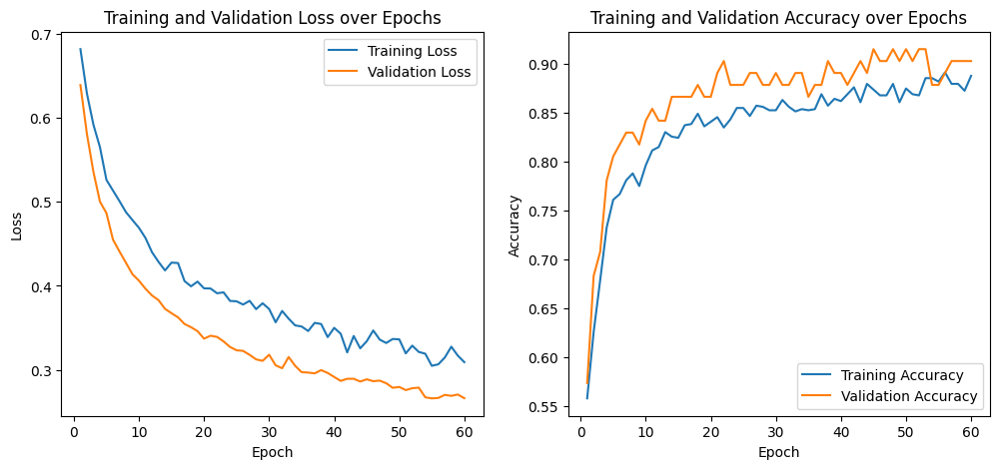

In [49]:
alexnet = models.alexnet(weights=models.AlexNet_Weights.IMAGENET1K_V1)

num_features = alexnet.classifier[6].in_features
alexnet.classifier[6] = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.SGD(alexnet.classifier[6].parameters(), lr=1e-4, momentum=0.9, weight_decay=1e-3)

train_losses, val_losses, train_accuracies, val_accuracies = train(alexnet,device,criterion,optimizer,num_epochs=100)

In [50]:
accuracy = test_model(alexnet, test_loader, device)

print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.2486, Accuracy: 95.00
Test Accuracy: 95.00%


# Base Model from scratch

In [14]:
import matplotlib.pyplot as plt
import torch

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()

        # First convolutional layer (3 input channels, 6 output channels, kernel 5)
        self.conv1 = nn.Conv2d(3, 6, kernel_size=5)

        # Second convolutional layer (6 input channels, 16 output channels, kernel size 5)
        self.conv2 = nn.Conv2d(6, 16, kernel_size=5)

        # Fully connected layers
        self.fc1 = nn.Linear(16 * 53 * 53, 120)  # Update to match flattened size
        self.fc2 = nn.Linear(120, 84)            # 120 nodes to 84 nodes
        self.fc3 = nn.Linear(84, 2)              # 84 nodes to 2 output classes (dog and person)

    def forward(self, x):
        x = F.relu(self.conv1(x))             # Apply ReLU after first conv layer
        x = F.max_pool2d(x, 2, 2)             # Apply max pooling
        x = F.relu(self.conv2(x))             # Apply ReLU after second conv layer
        x = F.max_pool2d(x, 2, 2)             # Apply max pooling
        x = x.view(-1, 16 * 53 * 53)          # Flatten with updated size
        x = F.relu(self.fc1(x))               # Apply ReLU after first fully connected layer
        x = F.relu(self.fc2(x))               # Apply ReLU after second fully connected layer
        x = self.fc3(x)                       # Output layer

        return x


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
simple_cnn = SimpleCNN().to(device)
print(simple_cnn)

SimpleCNN(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=44944, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=2, bias=True)
)


In [2]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(simple_cnn.parameters(), lr=1e-3)
train_losses, val_losses, train_accuracies, val_accuracies = train(simple_cnn,device,criterion,optimizer,num_epochs=100)

NameError: name 'nn' is not defined

In [52]:
accuracy = test_model(simple_cnn, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 1.1754, Accuracy: 85.00
Test Accuracy: 85.00%


### Modified CNN

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        # First Convolution
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        
        # Second Convolution
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        
        # Third Convolution
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        
        # Max Pooling
        self.pool = nn.MaxPool2d(2, 2)
        
        # Fully Connected Layers
        self.fc1 = nn.Linear(128 * 28 * 28, 256)  # Adjust input size based on image dimensions
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 2)  # Output layer for binary classification (dog, person)
        
        # Dropout
        self.dropout = nn.Dropout(0.5)
    
    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        
        x = x.view(-1, 128 * 28 * 28)
        
        # Fully Connected Layers
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomCNN().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

print(model)


CustomCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=100352, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=2, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


Epoch [1/100], Train Loss: 0.1314, Val Loss: 0.4187, Train Acc: 0.9519, Val Acc: 0.8415
Epoch [2/100], Train Loss: 0.0803, Val Loss: 0.4023, Train Acc: 0.9742, Val Acc: 0.8171
Epoch [3/100], Train Loss: 0.0583, Val Loss: 0.4226, Train Acc: 0.9883, Val Acc: 0.8780
Epoch [4/100], Train Loss: 0.0480, Val Loss: 0.4530, Train Acc: 0.9941, Val Acc: 0.8293
Epoch [5/100], Train Loss: 0.0342, Val Loss: 0.3932, Train Acc: 0.9918, Val Acc: 0.8537
Epoch [6/100], Train Loss: 0.0416, Val Loss: 0.4151, Train Acc: 0.9894, Val Acc: 0.8415
Epoch [7/100], Train Loss: 0.0296, Val Loss: 0.3961, Train Acc: 0.9941, Val Acc: 0.8293
Epoch [8/100], Train Loss: 0.0235, Val Loss: 0.4683, Train Acc: 0.9965, Val Acc: 0.8780
Epoch [9/100], Train Loss: 0.0231, Val Loss: 0.5059, Train Acc: 0.9941, Val Acc: 0.8293
Epoch [10/100], Train Loss: 0.0215, Val Loss: 0.4102, Train Acc: 0.9965, Val Acc: 0.8537
Early stopping triggered.


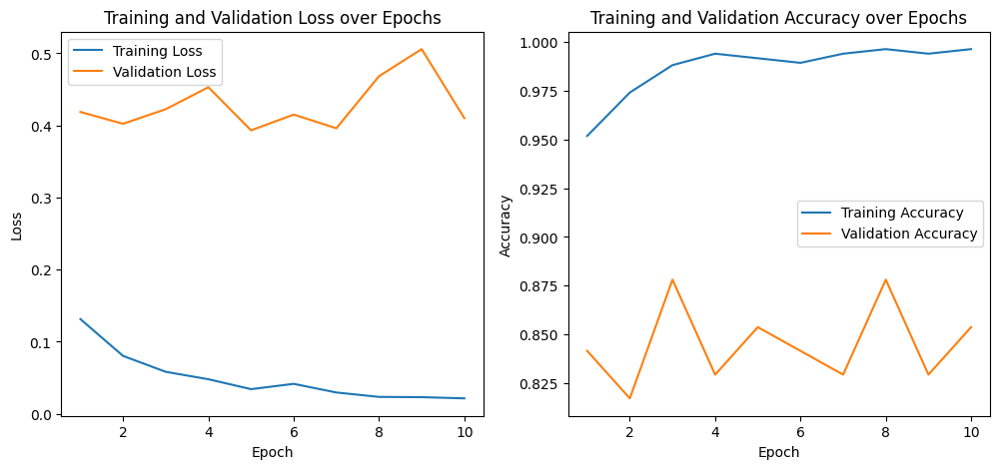

In [50]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
train_losses, val_losses, train_accuracies, val_accuracies = train(model,device,criterion,optimizer,num_epochs=100)

### More complex model

In [116]:
class complexCNN(nn.Module):
    def __init__(self):
        super(complexCNN, self).__init__()
        # First Convolutional Block
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=11, stride=4, padding=2)
        self.bn1 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=3, stride=2)

        # Second Convolutional Block
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5, padding=2)
        self.bn2 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(kernel_size=3, stride=2)
        
        # Fourth Convolutional Block
        self.conv4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        
        # Fifth Convolutional Block
        self.conv5 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.pool5 = nn.MaxPool2d(kernel_size=3, stride=2)

        # Fully Connected Layers
        self.fc1 = nn.Linear(512 * 6 * 6, 128)  # Adjust based on input size
        self.fc2 = nn.Linear(128, 128)
        self.dropout2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(128, 2)  # Output layer for binary classification

    def forward(self, x):
        # Convolutional layers with ReLU and max pooling
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = F.relu(self.bn4(self.conv4(x)))
        x = self.pool5(F.relu(self.bn5(self.conv5(x))))

        # Flatten the output for the fully connected layers
        x = x.view(-1, 512 * 6 * 6)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = complexCNN().to(device)

# loss and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

print(model)


complexCNN(
  (conv1): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn5): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=18432, out_features=128, bias

Epoch [1/100], Train Loss: 0.6642, Val Loss: 0.6800, Train Acc: 0.5845, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.5409, Val Loss: 0.5465, Train Acc: 0.7371, Val Acc: 0.6707
Epoch [3/100], Train Loss: 0.4916, Val Loss: 0.3424, Train Acc: 0.7735, Val Acc: 0.8537
Epoch [4/100], Train Loss: 0.3897, Val Loss: 0.2440, Train Acc: 0.8345, Val Acc: 0.9024
Epoch [5/100], Train Loss: 0.3067, Val Loss: 0.2094, Train Acc: 0.8756, Val Acc: 0.9146
Epoch [6/100], Train Loss: 0.2845, Val Loss: 0.2092, Train Acc: 0.8791, Val Acc: 0.9146
Epoch [7/100], Train Loss: 0.2165, Val Loss: 0.3383, Train Acc: 0.9190, Val Acc: 0.8902
Epoch [8/100], Train Loss: 0.1992, Val Loss: 0.3687, Train Acc: 0.9284, Val Acc: 0.8659
Epoch [9/100], Train Loss: 0.1652, Val Loss: 0.3141, Train Acc: 0.9401, Val Acc: 0.8902
Epoch [10/100], Train Loss: 0.1463, Val Loss: 0.3892, Train Acc: 0.9425, Val Acc: 0.8537
Epoch [11/100], Train Loss: 0.1348, Val Loss: 0.3033, Train Acc: 0.9589, Val Acc: 0.8780
Early stopping triggered.


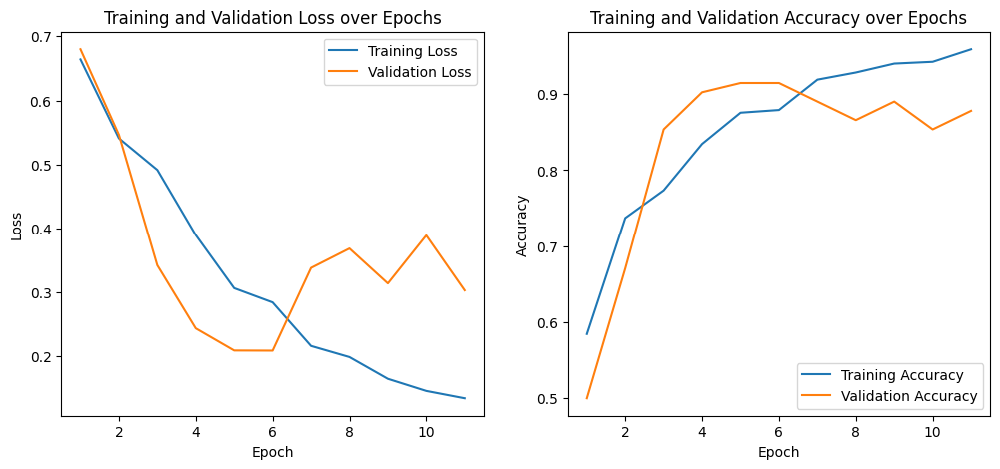

In [117]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
train_losses, val_losses, train_accuracies, val_accuracies = train(model,device,criterion,optimizer,num_epochs=100)

### Deeper Model

In [80]:
class DeeperCNN(nn.Module):
    def __init__(self):
        super(DeeperCNN, self).__init__()
        # First Convolutional Block
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(2, 2)
        
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(2, 2)
        
        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(256)
        self.conv6 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.bn6 = nn.BatchNorm2d(256)
        self.pool3 = nn.MaxPool2d(2, 2)

        self.conv7 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn7 = nn.BatchNorm2d(512)
        self.conv8 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.bn8 = nn.BatchNorm2d(512)
        self.pool4 = nn.MaxPool2d(2, 2)

        self.conv9 = nn.Conv2d(512, 1024, kernel_size=3, padding=1)
        self.bn9 = nn.BatchNorm2d(1024)
        self.conv10 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1)
        self.bn10 = nn.BatchNorm2d(1024)
        self.pool5 = nn.MaxPool2d(2, 2)

        # Fully Connected Layers
        self.fc1 = nn.Linear(1024 * 7 * 7, 512)
        self.dropout1 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, 256)
        self.dropout2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(256, 2)  # Output binary classification

    def forward(self, x):
        x = self.pool1(F.relu(self.bn2(self.conv2(F.relu(self.bn1(self.conv1(x)))))))
        x = self.pool2(F.relu(self.bn4(self.conv4(F.relu(self.bn3(self.conv3(x)))))))
        x = self.pool3(F.relu(self.bn6(self.conv6(F.relu(self.bn5(self.conv5(x)))))))
        x = self.pool4(F.relu(self.bn8(self.conv8(F.relu(self.bn7(self.conv7(x)))))))
        x = self.pool5(F.relu(self.bn10(self.conv10(F.relu(self.bn9(self.conv9(x)))))))

        # Flattening for fully connected layers
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout1(x)
        x = F.relu(self.fc2(x))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DeeperCNN().to(device)

print(model)

DeeperCNN(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_

Epoch [1/100], Train Loss: 0.6926, Val Loss: 0.6946, Train Acc: 0.5059, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6704, Val Loss: 0.6907, Train Acc: 0.5751, Val Acc: 0.5976
Epoch [3/100], Train Loss: 0.6620, Val Loss: 0.6693, Train Acc: 0.5845, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.6517, Val Loss: 0.6446, Train Acc: 0.6232, Val Acc: 0.5732
Epoch [5/100], Train Loss: 0.6366, Val Loss: 0.6266, Train Acc: 0.6866, Val Acc: 0.5732
Epoch [6/100], Train Loss: 0.6277, Val Loss: 0.6117, Train Acc: 0.6913, Val Acc: 0.5854
Epoch [7/100], Train Loss: 0.6083, Val Loss: 0.6000, Train Acc: 0.7594, Val Acc: 0.6829
Epoch [8/100], Train Loss: 0.5982, Val Loss: 0.5842, Train Acc: 0.7606, Val Acc: 0.6098
Epoch [9/100], Train Loss: 0.5744, Val Loss: 0.5663, Train Acc: 0.7770, Val Acc: 0.6951
Epoch [10/100], Train Loss: 0.5611, Val Loss: 0.5497, Train Acc: 0.8169, Val Acc: 0.7317
Epoch [11/100], Train Loss: 0.5450, Val Loss: 0.5350, Train Acc: 0.8263, Val Acc: 0.7317
Epoch [12/100], Train Loss: 0.

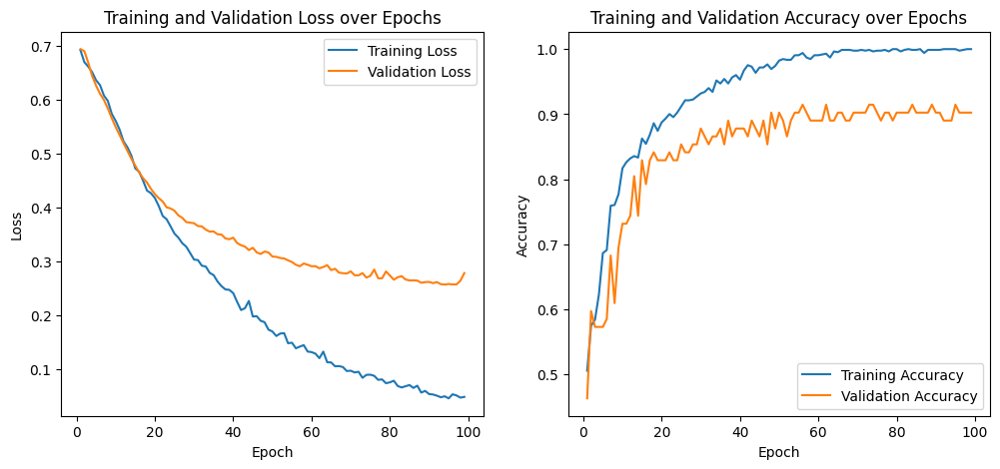

In [59]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-6, weight_decay=1e-3)
train_losses, val_losses, train_accuracies, val_accuracies = train(model,device,criterion,optimizer,num_epochs=100)

#dropout was 0.2

Epoch [1/100], Train Loss: 0.6914, Val Loss: 0.6904, Train Acc: 0.5282, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6819, Val Loss: 0.6896, Train Acc: 0.5516, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6756, Val Loss: 0.6682, Train Acc: 0.5716, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6689, Val Loss: 0.6504, Train Acc: 0.5962, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6624, Val Loss: 0.6404, Train Acc: 0.5915, Val Acc: 0.5488
Epoch [6/100], Train Loss: 0.6655, Val Loss: 0.6347, Train Acc: 0.5786, Val Acc: 0.5488
Epoch [7/100], Train Loss: 0.6594, Val Loss: 0.6288, Train Acc: 0.6009, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6489, Val Loss: 0.6228, Train Acc: 0.6045, Val Acc: 0.5610
Epoch [9/100], Train Loss: 0.6454, Val Loss: 0.6170, Train Acc: 0.6221, Val Acc: 0.5488
Epoch [10/100], Train Loss: 0.6350, Val Loss: 0.6107, Train Acc: 0.6491, Val Acc: 0.5610
Epoch [11/100], Train Loss: 0.6378, Val Loss: 0.6038, Train Acc: 0.6491, Val Acc: 0.5610
Epoch [12/100], Train Loss: 0.

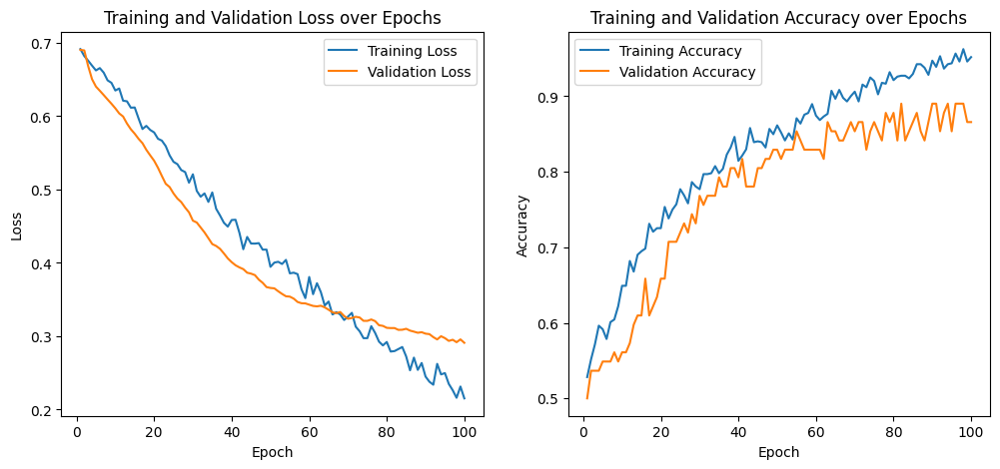

In [81]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-6, weight_decay=1e-3)
train_losses, val_losses, train_accuracies, val_accuracies = train(model,device,criterion,optimizer,num_epochs=100)

### Simplified Model

In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimplifiedCNN(nn.Module):
    def __init__(self, dropout_rate=0.5):
        super(SimplifiedCNN, self).__init__()
        
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.dropout1 = nn.Dropout(dropout_rate)
        
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.conv4 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2, 2)
        self.dropout2 = nn.Dropout(dropout_rate)
        
        self.conv5 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(128)
        self.conv6 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn6 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2, 2)
        self.dropout3 = nn.Dropout(dropout_rate)
        
        self.fc1 = nn.Linear(128 * 28 * 28, 256)
        self.dropout_fc1 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(256, 128)
        self.dropout_fc2 = nn.Dropout(dropout_rate)
        self.fc3 = nn.Linear(128, 2)  # Output layer for binary classification

    def forward(self, x):
        x = self.pool1(F.relu(self.bn2(self.conv2(F.relu(self.bn1(self.conv1(x)))))))
        x = self.dropout1(x)
        x = self.pool2(F.relu(self.bn4(self.conv4(F.relu(self.bn3(self.conv3(x)))))))
        x = self.dropout2(x)
        x = self.pool3(F.relu(self.bn6(self.conv6(F.relu(self.bn5(self.conv5(x)))))))
        x = self.dropout3(x)
        
        # Flattening for fully connected layers
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout_fc1(x)
        x = F.relu(self.fc2(x))
        x = self.dropout_fc2(x)
        x = self.fc3(x)
        return x


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SimplifiedCNN().to(device)

print(model)

SimplifiedCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.5, inplace=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.5, inplace=False)
  (conv5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), 

Epoch [1/100], Train Loss: 0.6848, Val Loss: 0.6838, Train Acc: 0.5669, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6472, Val Loss: 0.6725, Train Acc: 0.6197, Val Acc: 0.5488
Epoch [3/100], Train Loss: 0.6265, Val Loss: 0.6353, Train Acc: 0.7113, Val Acc: 0.6829
Epoch [4/100], Train Loss: 0.6050, Val Loss: 0.5974, Train Acc: 0.6913, Val Acc: 0.6951
Epoch [5/100], Train Loss: 0.5780, Val Loss: 0.5702, Train Acc: 0.7535, Val Acc: 0.7683
Epoch [6/100], Train Loss: 0.5596, Val Loss: 0.5453, Train Acc: 0.7782, Val Acc: 0.7439
Epoch [7/100], Train Loss: 0.5372, Val Loss: 0.5224, Train Acc: 0.7981, Val Acc: 0.7805
Epoch [8/100], Train Loss: 0.5155, Val Loss: 0.5020, Train Acc: 0.8228, Val Acc: 0.7927
Epoch [9/100], Train Loss: 0.4980, Val Loss: 0.4846, Train Acc: 0.8404, Val Acc: 0.8171
Epoch [10/100], Train Loss: 0.4855, Val Loss: 0.4739, Train Acc: 0.8310, Val Acc: 0.8171
Epoch [11/100], Train Loss: 0.4700, Val Loss: 0.4593, Train Acc: 0.8545, Val Acc: 0.7927
Epoch [12/100], Train Loss: 0.

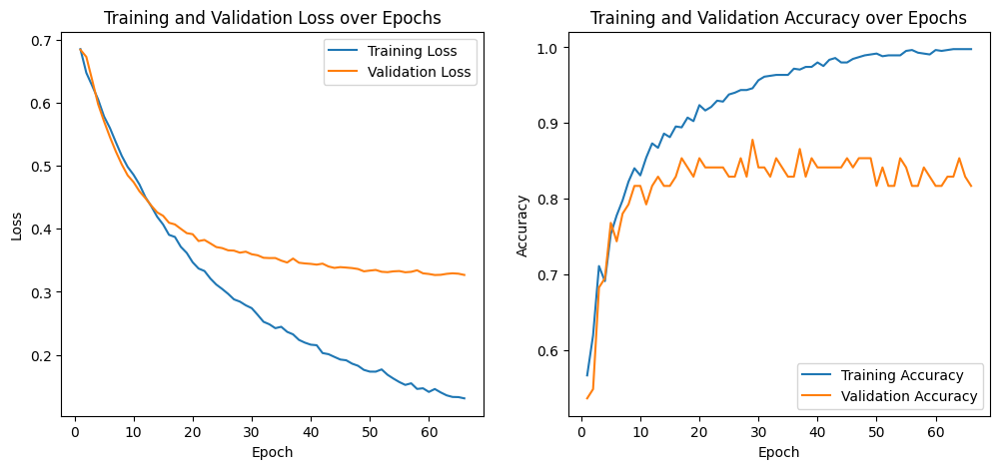

In [46]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-6, weight_decay=1e-1)
train_losses, val_losses, train_accuracies, val_accuracies = train(model,device,criterion,optimizer,num_epochs=100)

### Grid search

Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7010, Val Loss: 0.7467, Train Acc: 0.5200, Val Acc: 0.5488
Epoch [2/100], Train Loss: 0.6749, Val Loss: 0.7414, Train Acc: 0.5646, Val Acc: 0.6098
Epoch [3/100], Train Loss: 0.6688, Val Loss: 0.7193, Train Acc: 0.5458, Val Acc: 0.7317
Epoch [4/100], Train Loss: 0.6603, Val Loss: 0.6996, Train Acc: 0.5892, Val Acc: 0.8171
Epoch [5/100], Train Loss: 0.6545, Val Loss: 0.6794, Train Acc: 0.5810, Val Acc: 0.7561
Epoch [6/100], Train Loss: 0.6554, Val Loss: 0.6736, Train Acc: 0.6056, Val Acc: 0.8049
Epoch [7/100], Train Loss: 0.6254, Val Loss: 0.6618, Train Acc: 0.6162, Val Acc: 0.7927
Epoch [8/100], Train Loss: 0.6070, Val Loss: 0.6394, Train Acc: 0.6268, Val Acc: 0.7683
Epoch [9/100], Train Loss: 0.6028, Val Loss: 0.6370, Train Acc: 0.6491, Val Acc: 0.8171
Epoch [10/100], Train Loss: 0.5946, Val Loss

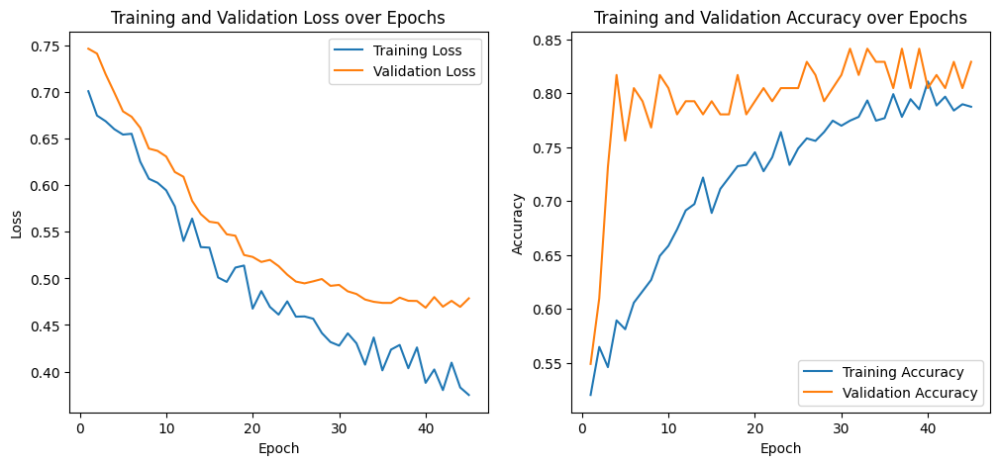

Test Loss: 0.4786, Accuracy: 82.93
Validation Accuracy: 82.93%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6991, Val Loss: 0.7403, Train Acc: 0.5293, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6876, Val Loss: 0.7410, Train Acc: 0.5340, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6761, Val Loss: 0.7211, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6750, Val Loss: 0.7132, Train Acc: 0.5681, Val Acc: 0.5976
Epoch [5/100], Train Loss: 0.6689, Val Loss: 0.7086, Train Acc: 0.5692, Val Acc: 0.6220
Epoch [6/100], Train Loss: 0.6461, Val Loss: 0.7020, Train Acc: 0.5857, Val Acc: 0.6463
Epoch [7/100], Train Loss: 0.6319, Val Loss: 0.6985, Train Acc: 0.6068, Val Acc: 0.6220
Epoch [8/100], Train Loss: 0.6307, Val Loss: 0.6845, Train Acc: 0.6068, Val Acc: 0.6463
Epoch [9/100], Train Loss: 0.5971, Val Loss: 0.6725, Train Acc: 

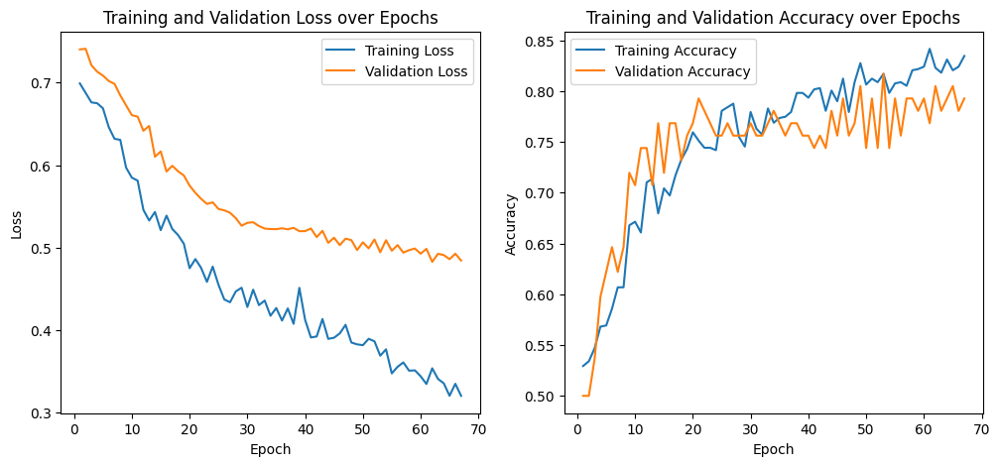

Test Loss: 0.4844, Accuracy: 79.27
Validation Accuracy: 79.27%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6835, Val Loss: 0.7517, Train Acc: 0.5141, Val Acc: 0.4878
Epoch [2/100], Train Loss: 0.6943, Val Loss: 0.7493, Train Acc: 0.5364, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6978, Val Loss: 0.7460, Train Acc: 0.5399, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.6788, Val Loss: 0.7425, Train Acc: 0.5376, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.6919, Val Loss: 0.7399, Train Acc: 0.5399, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.6796, Val Loss: 0.7384, Train Acc: 0.5505, Val Acc: 0.5122
Epoch [7/100], Train Loss: 0.6868, Val Loss: 0.7373, Train Acc: 0.5505, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.6812, Val Loss: 0.7372, Train Acc: 0.5528, Val Acc: 0.5122
Epoch [9/100], Train Loss: 0.6821, Val Loss: 0.7361, Train Acc: 0.5434

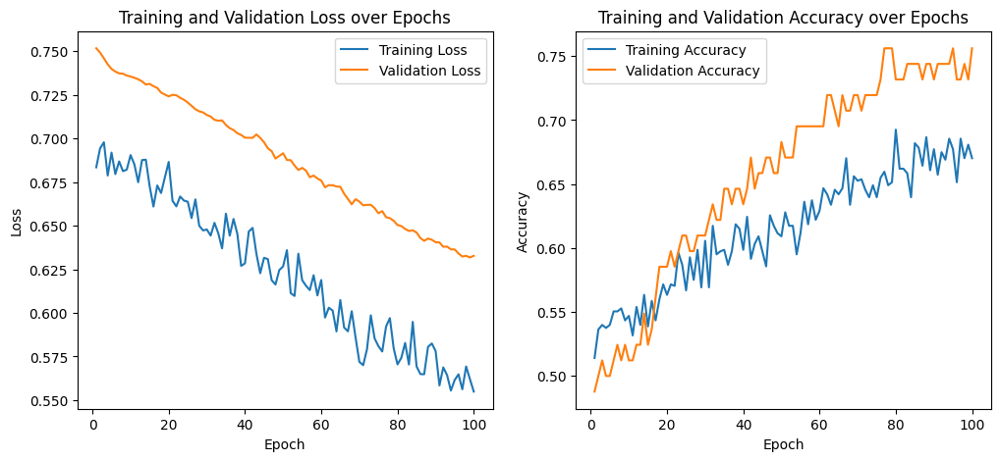

Test Loss: 0.6327, Accuracy: 75.61
Validation Accuracy: 75.61%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7135, Val Loss: 0.7479, Train Acc: 0.4930, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6975, Val Loss: 0.7440, Train Acc: 0.4847, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.6845, Val Loss: 0.7410, Train Acc: 0.5258, Val Acc: 0.5610
Epoch [4/100], Train Loss: 0.6924, Val Loss: 0.7387, Train Acc: 0.5599, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.6811, Val Loss: 0.7376, Train Acc: 0.5352, Val Acc: 0.5732
Epoch [6/100], Train Loss: 0.6973, Val Loss: 0.7365, Train Acc: 0.5282, Val Acc: 0.5732
Epoch [7/100], Train Loss: 0.6899, Val Loss: 0.7356, Train Acc: 0.5469, Val Acc: 0.5732
Epoch [8/100], Train Loss: 0.6704, Val Loss: 0.7351, Train Acc: 0.5646, Val Acc: 0.5854
Epoch [9/100], Train Loss: 0.6831, Val Loss: 0.7343, Train Acc: 0

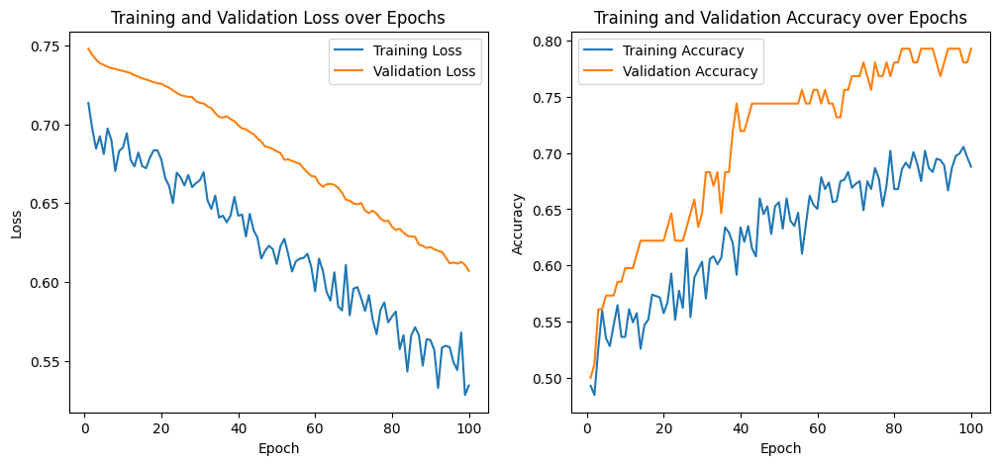

Test Loss: 0.6071, Accuracy: 79.27
Validation Accuracy: 79.27%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6965, Val Loss: 0.7409, Train Acc: 0.5082, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6784, Val Loss: 0.7358, Train Acc: 0.5411, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6861, Val Loss: 0.7312, Train Acc: 0.5704, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6837, Val Loss: 0.7278, Train Acc: 0.5728, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6923, Val Loss: 0.7263, Train Acc: 0.5493, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6883, Val Loss: 0.7261, Train Acc: 0.5622, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6698, Val Loss: 0.7255, Train Acc: 0.5880, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6862, Val Loss: 0.7249, Train Acc: 0.5235, Val Acc: 0.5488
Epoch [9/100], Train Loss: 0.6626, Val Loss: 0.7231, Train Acc: 0.5845

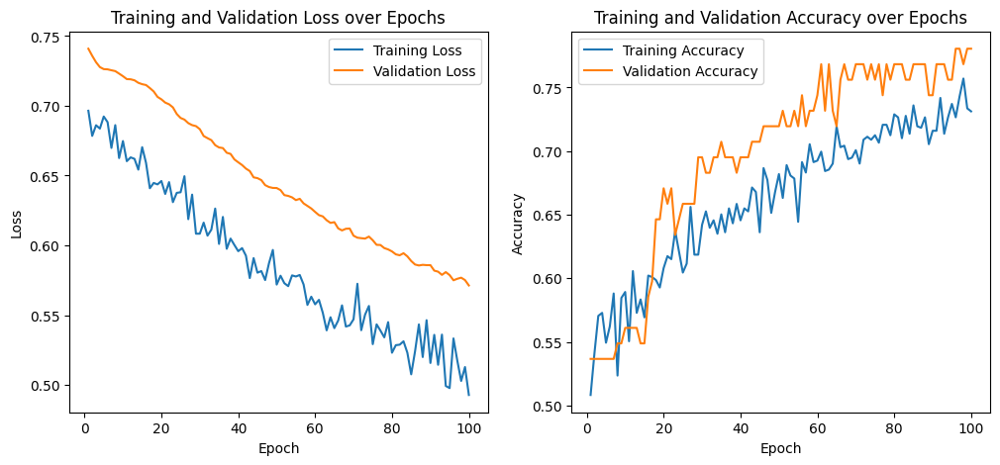

Test Loss: 0.5713, Accuracy: 78.05
Validation Accuracy: 78.05%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7059, Val Loss: 0.7466, Train Acc: 0.5305, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6872, Val Loss: 0.7371, Train Acc: 0.5329, Val Acc: 0.5610
Epoch [3/100], Train Loss: 0.6898, Val Loss: 0.7276, Train Acc: 0.5540, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6920, Val Loss: 0.7240, Train Acc: 0.5258, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6828, Val Loss: 0.7219, Train Acc: 0.5587, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6831, Val Loss: 0.7212, Train Acc: 0.5775, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6723, Val Loss: 0.7203, Train Acc: 0.5599, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6777, Val Loss: 0.7196, Train Acc: 0.5587, Val Acc: 0.5610
Epoch [9/100], Train Loss: 0.6768, Val Loss: 0.7192, Train Acc: 0

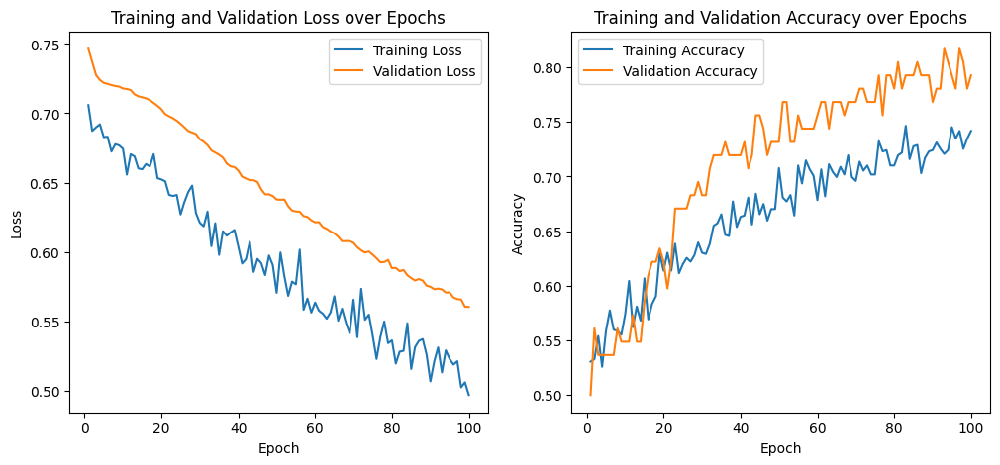

Test Loss: 0.5603, Accuracy: 79.27
Validation Accuracy: 79.27%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7149, Val Loss: 0.7569, Train Acc: 0.4988, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7110, Val Loss: 0.7575, Train Acc: 0.4765, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7205, Val Loss: 0.7566, Train Acc: 0.4519, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7054, Val Loss: 0.7546, Train Acc: 0.4836, Val Acc: 0.4390
Epoch [5/100], Train Loss: 0.7153, Val Loss: 0.7534, Train Acc: 0.5012, Val Acc: 0.4390
Epoch [6/100], Train Loss: 0.7024, Val Loss: 0.7522, Train Acc: 0.4988, Val Acc: 0.4268
Epoch [7/100], Train Loss: 0.7018, Val Loss: 0.7508, Train Acc: 0.4988, Val Acc: 0.4390
Epoch [8/100], Train Loss: 0.6989, Val Loss: 0.7499, Train Acc: 0.4965, Val Acc: 0.4390
Epoch [9/100], Train Loss: 0.6990, Val Loss: 0.7486, Train Acc: 0.4789,

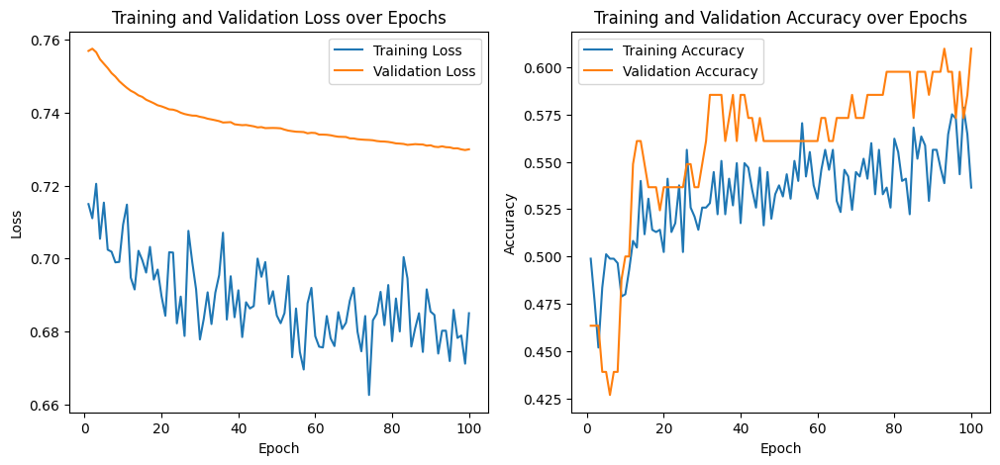

Test Loss: 0.7299, Accuracy: 60.98
Validation Accuracy: 60.98%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6893, Val Loss: 0.7399, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7124, Val Loss: 0.7390, Train Acc: 0.4765, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7008, Val Loss: 0.7403, Train Acc: 0.5141, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6989, Val Loss: 0.7397, Train Acc: 0.5000, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6989, Val Loss: 0.7389, Train Acc: 0.5094, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7004, Val Loss: 0.7384, Train Acc: 0.5246, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6929, Val Loss: 0.7376, Train Acc: 0.5035, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6903, Val Loss: 0.7374, Train Acc: 0.5387, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6867, Val Loss: 0.7372, Train Acc: 0.

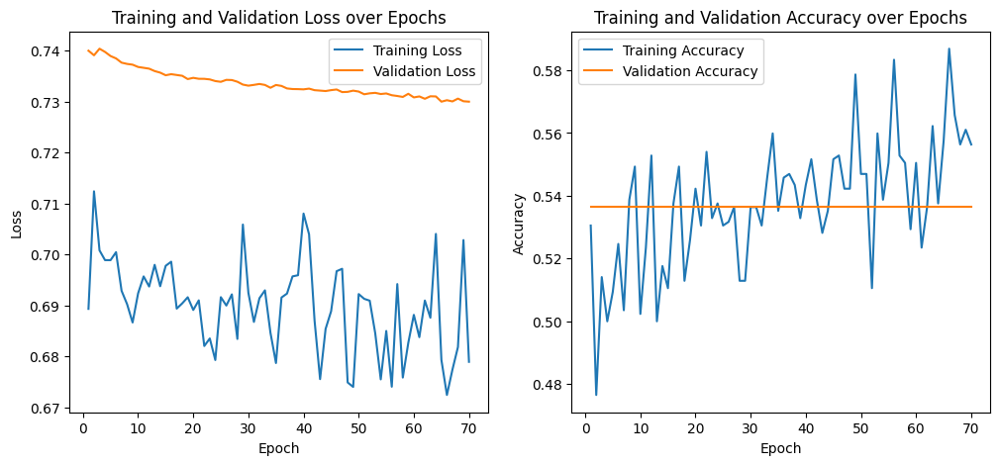

Test Loss: 0.7300, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6940, Val Loss: 0.7472, Train Acc: 0.4883, Val Acc: 0.4878
Epoch [2/100], Train Loss: 0.7015, Val Loss: 0.7473, Train Acc: 0.4941, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7037, Val Loss: 0.7479, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6802, Val Loss: 0.7486, Train Acc: 0.5235, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6971, Val Loss: 0.7481, Train Acc: 0.5070, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6895, Val Loss: 0.7473, Train Acc: 0.5106, Val Acc: 0.5244
Early stopping triggered.


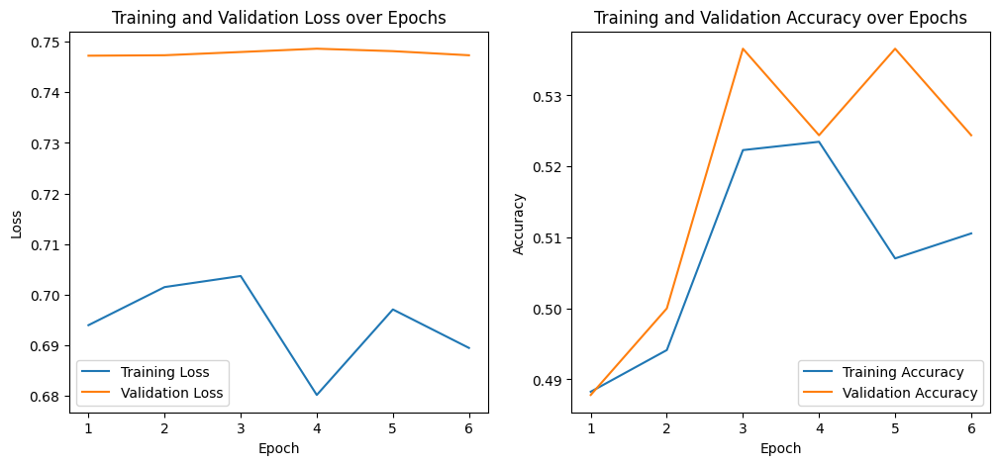

Test Loss: 0.7473, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6956, Val Loss: 0.7428, Train Acc: 0.4953, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6924, Val Loss: 0.7432, Train Acc: 0.5293, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.7035, Val Loss: 0.7452, Train Acc: 0.5188, Val Acc: 0.5488
Epoch [4/100], Train Loss: 0.6787, Val Loss: 0.7453, Train Acc: 0.5141, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7061, Val Loss: 0.7448, Train Acc: 0.5176, Val Acc: 0.5488
Epoch [6/100], Train Loss: 0.6868, Val Loss: 0.7443, Train Acc: 0.5246, Val Acc: 0.5366
Early stopping triggered.


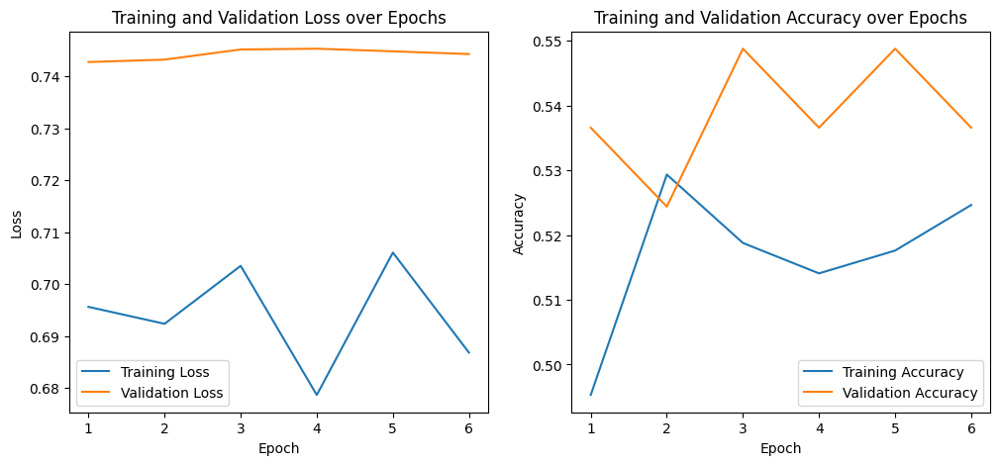

Test Loss: 0.7443, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7055, Val Loss: 0.7578, Train Acc: 0.4800, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7001, Val Loss: 0.7580, Train Acc: 0.5047, Val Acc: 0.4268
Epoch [3/100], Train Loss: 0.6905, Val Loss: 0.7591, Train Acc: 0.4800, Val Acc: 0.4390
Epoch [4/100], Train Loss: 0.6960, Val Loss: 0.7609, Train Acc: 0.5070, Val Acc: 0.4390
Epoch [5/100], Train Loss: 0.6979, Val Loss: 0.7611, Train Acc: 0.4977, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7060, Val Loss: 0.7615, Train Acc: 0.4789, Val Acc: 0.4512
Early stopping triggered.


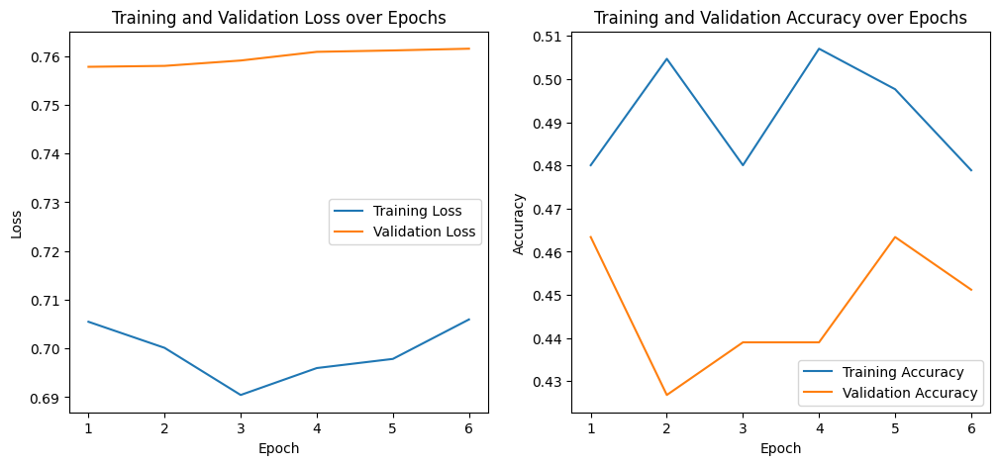

Test Loss: 0.7615, Accuracy: 45.12
Validation Accuracy: 45.12%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7050, Val Loss: 0.7523, Train Acc: 0.4777, Val Acc: 0.5122
Epoch [2/100], Train Loss: 0.7209, Val Loss: 0.7490, Train Acc: 0.4789, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7082, Val Loss: 0.7460, Train Acc: 0.5023, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.7109, Val Loss: 0.7427, Train Acc: 0.4930, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.7136, Val Loss: 0.7423, Train Acc: 0.4648, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7039, Val Loss: 0.7423, Train Acc: 0.5012, Val Acc: 0.5488
Epoch [7/100], Train Loss: 0.7048, Val Loss: 0.7417, Train Acc: 0.5000, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.7078, Val Loss: 0.7421, Train Acc: 0.4777, Val Acc: 0.5244
Epoch [9/100], Train Loss: 0.7013, Val Loss: 0.7420, Train Acc: 0.

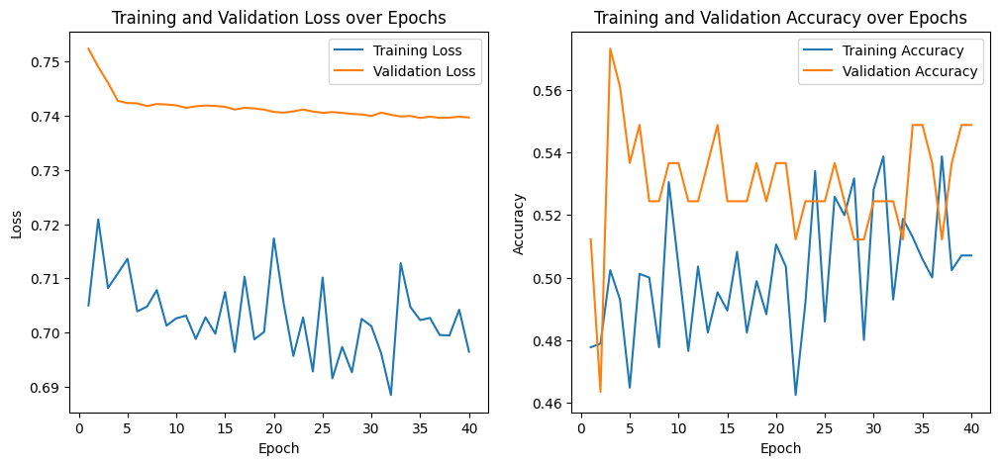

Test Loss: 0.7396, Accuracy: 54.88
Validation Accuracy: 54.88%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7632, Val Loss: 0.7425, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7246, Val Loss: 0.7402, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7067, Val Loss: 0.7393, Train Acc: 0.5246, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7173, Val Loss: 0.7418, Train Acc: 0.5481, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.6864, Val Loss: 0.7427, Train Acc: 0.5317, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7263, Val Loss: 0.7418, Train Acc: 0.5188, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.6850, Val Loss: 0.7413, Train Acc: 0.5188, Val Acc: 0.5854
Epoch [8/100], Train Loss: 0.6992, Val Loss: 0.7399, Train Acc: 0.5129, Val Acc: 0.5732
Early stopping triggered.


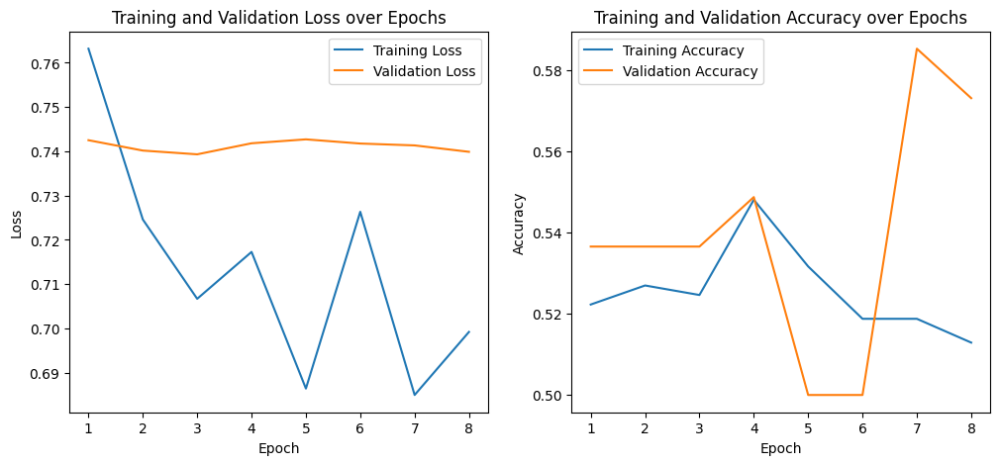

Test Loss: 0.7399, Accuracy: 57.32
Validation Accuracy: 57.32%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7677, Val Loss: 0.7470, Train Acc: 0.4977, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7357, Val Loss: 0.7503, Train Acc: 0.5129, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7266, Val Loss: 0.7467, Train Acc: 0.4883, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7070, Val Loss: 0.7426, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7066, Val Loss: 0.7439, Train Acc: 0.5340, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.6936, Val Loss: 0.7466, Train Acc: 0.5329, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7013, Val Loss: 0.7494, Train Acc: 0.5117, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7086, Val Loss: 0.7511, Train Acc: 0.5129, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.6872, Val Loss: 0.7508, Train Acc: 

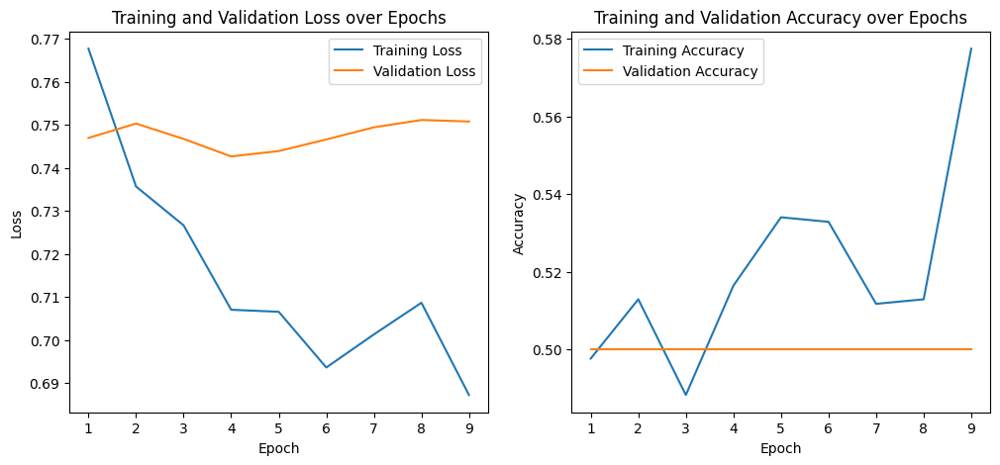

Test Loss: 0.7508, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7048, Val Loss: 0.7431, Train Acc: 0.5329, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6818, Val Loss: 0.7429, Train Acc: 0.5399, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7165, Val Loss: 0.7432, Train Acc: 0.5082, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7002, Val Loss: 0.7431, Train Acc: 0.5094, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7003, Val Loss: 0.7432, Train Acc: 0.5047, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7108, Val Loss: 0.7437, Train Acc: 0.5200, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7143, Val Loss: 0.7436, Train Acc: 0.5246, Val Acc: 0.5000
Early stopping triggered.


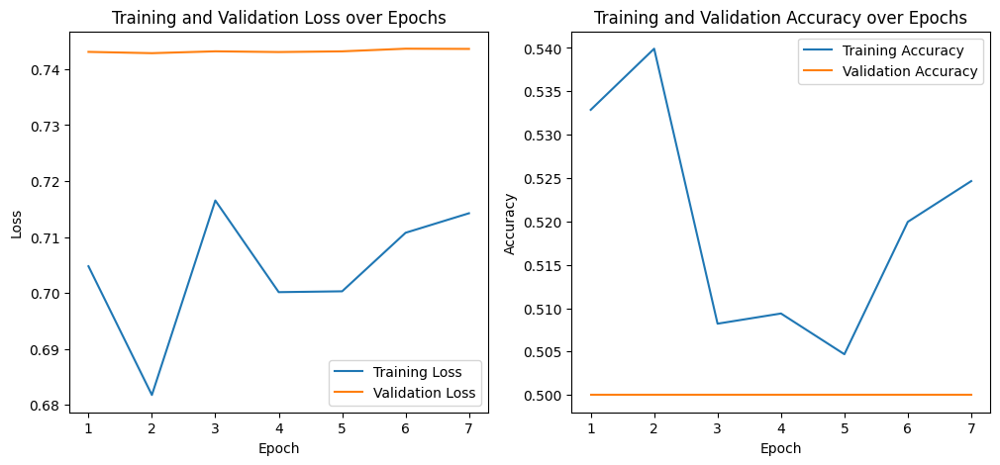

Test Loss: 0.7436, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7057, Val Loss: 0.7422, Train Acc: 0.4965, Val Acc: 0.5488
Epoch [2/100], Train Loss: 0.7073, Val Loss: 0.7418, Train Acc: 0.5094, Val Acc: 0.5610
Epoch [3/100], Train Loss: 0.7279, Val Loss: 0.7409, Train Acc: 0.5176, Val Acc: 0.5488
Epoch [4/100], Train Loss: 0.7181, Val Loss: 0.7407, Train Acc: 0.4812, Val Acc: 0.5732
Epoch [5/100], Train Loss: 0.7246, Val Loss: 0.7407, Train Acc: 0.4953, Val Acc: 0.5488
Epoch [6/100], Train Loss: 0.7087, Val Loss: 0.7409, Train Acc: 0.5153, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.7173, Val Loss: 0.7414, Train Acc: 0.5211, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7158, Val Loss: 0.7417, Train Acc: 0.5012, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7229, Val Loss: 0.7418, Train Acc: 0

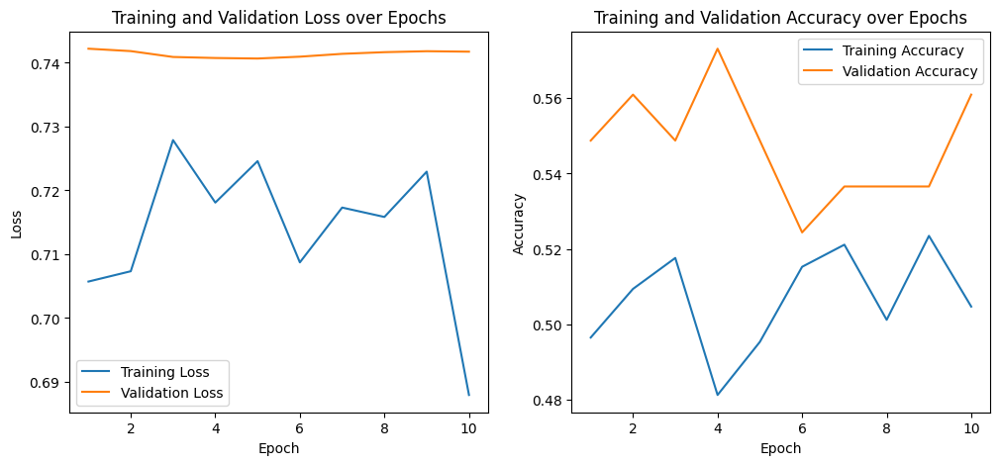

Test Loss: 0.7417, Accuracy: 56.10
Validation Accuracy: 56.10%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7527, Val Loss: 0.7510, Train Acc: 0.4847, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7540, Val Loss: 0.7470, Train Acc: 0.5012, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7426, Val Loss: 0.7430, Train Acc: 0.5293, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7550, Val Loss: 0.7412, Train Acc: 0.5035, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7291, Val Loss: 0.7410, Train Acc: 0.5047, Val Acc: 0.5610
Epoch [6/100], Train Loss: 0.7352, Val Loss: 0.7412, Train Acc: 0.5082, Val Acc: 0.5610
Epoch [7/100], Train Loss: 0.7242, Val Loss: 0.7412, Train Acc: 0.5141, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.7088, Val Loss: 0.7414, Train Acc: 0.5246, Val Acc: 0.5610
Epoch [9/100], Train Loss: 0.7096, Val Loss: 0.7412, Train Acc: 0.5387

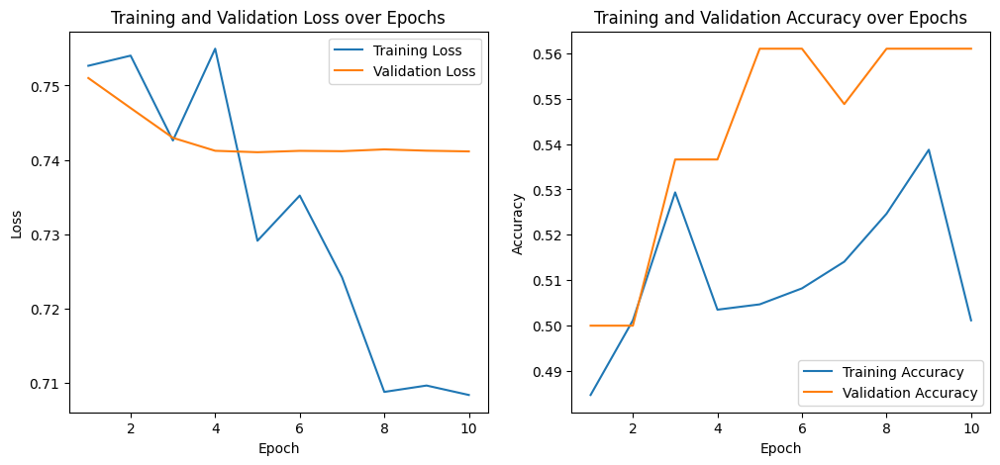

Test Loss: 0.7411, Accuracy: 56.10
Validation Accuracy: 56.10%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.8006, Val Loss: 0.7562, Train Acc: 0.4577, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7318, Val Loss: 0.7538, Train Acc: 0.5059, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7394, Val Loss: 0.7514, Train Acc: 0.4906, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7224, Val Loss: 0.7501, Train Acc: 0.5035, Val Acc: 0.4512
Epoch [5/100], Train Loss: 0.7257, Val Loss: 0.7492, Train Acc: 0.5293, Val Acc: 0.4268
Epoch [6/100], Train Loss: 0.7140, Val Loss: 0.7489, Train Acc: 0.5305, Val Acc: 0.4512
Epoch [7/100], Train Loss: 0.7425, Val Loss: 0.7486, Train Acc: 0.4800, Val Acc: 0.4634
Epoch [8/100], Train Loss: 0.7189, Val Loss: 0.7486, Train Acc: 0.5129, Val Acc: 0.4756
Epoch [9/100], Train Loss: 0.7287, Val Loss: 0.7486, Train Acc: 0

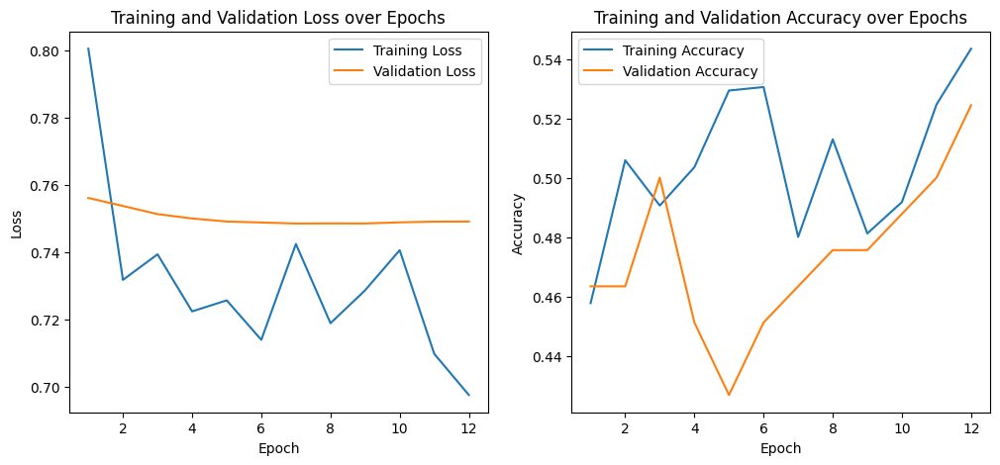

Test Loss: 0.7492, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7397, Val Loss: 0.7410, Train Acc: 0.5000, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7174, Val Loss: 0.7419, Train Acc: 0.5200, Val Acc: 0.4512
Epoch [3/100], Train Loss: 0.7324, Val Loss: 0.7431, Train Acc: 0.5211, Val Acc: 0.4756
Epoch [4/100], Train Loss: 0.7103, Val Loss: 0.7439, Train Acc: 0.5246, Val Acc: 0.4756
Epoch [5/100], Train Loss: 0.7042, Val Loss: 0.7440, Train Acc: 0.5540, Val Acc: 0.4756
Epoch [6/100], Train Loss: 0.7311, Val Loss: 0.7440, Train Acc: 0.5188, Val Acc: 0.4756
Early stopping triggered.


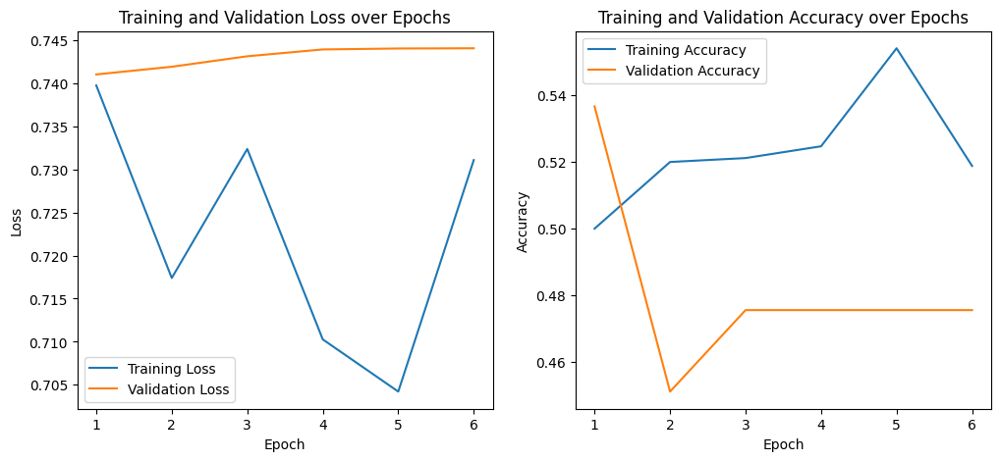

Test Loss: 0.7440, Accuracy: 47.56
Validation Accuracy: 47.56%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7444, Val Loss: 0.7571, Train Acc: 0.5200, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7008, Val Loss: 0.7532, Train Acc: 0.5458, Val Acc: 0.5732
Epoch [3/100], Train Loss: 0.7354, Val Loss: 0.7525, Train Acc: 0.4906, Val Acc: 0.5488
Epoch [4/100], Train Loss: 0.7358, Val Loss: 0.7523, Train Acc: 0.5012, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7440, Val Loss: 0.7521, Train Acc: 0.5047, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7442, Val Loss: 0.7520, Train Acc: 0.4965, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7258, Val Loss: 0.7519, Train Acc: 0.4883, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7381, Val Loss: 0.7517, Train Acc: 0.5012, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7218, Val Loss: 0.7517, Train Acc: 0.

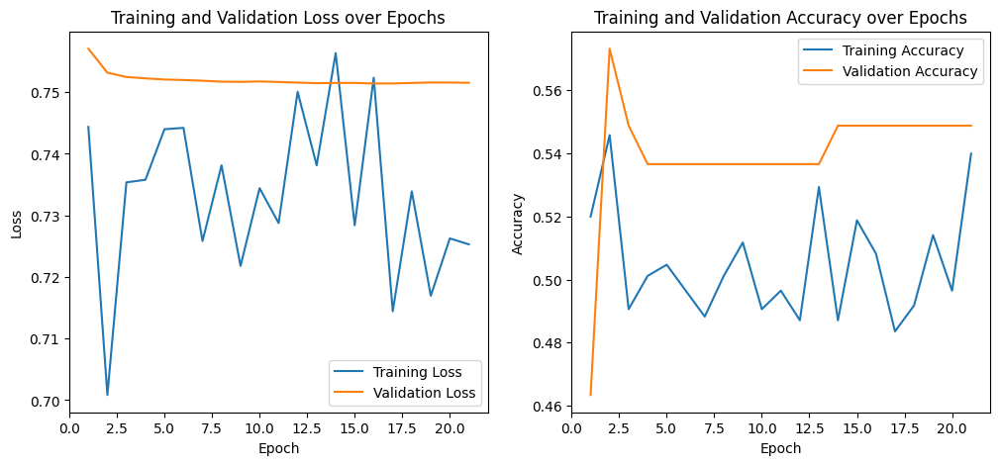

Test Loss: 0.7515, Accuracy: 54.88
Validation Accuracy: 54.88%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7310, Val Loss: 0.7429, Train Acc: 0.5399, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7369, Val Loss: 0.7419, Train Acc: 0.5352, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7526, Val Loss: 0.7430, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7228, Val Loss: 0.7431, Train Acc: 0.5047, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.7247, Val Loss: 0.7431, Train Acc: 0.5293, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7236, Val Loss: 0.7428, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7276, Val Loss: 0.7430, Train Acc: 0.5340, Val Acc: 0.5366
Early stopping triggered.


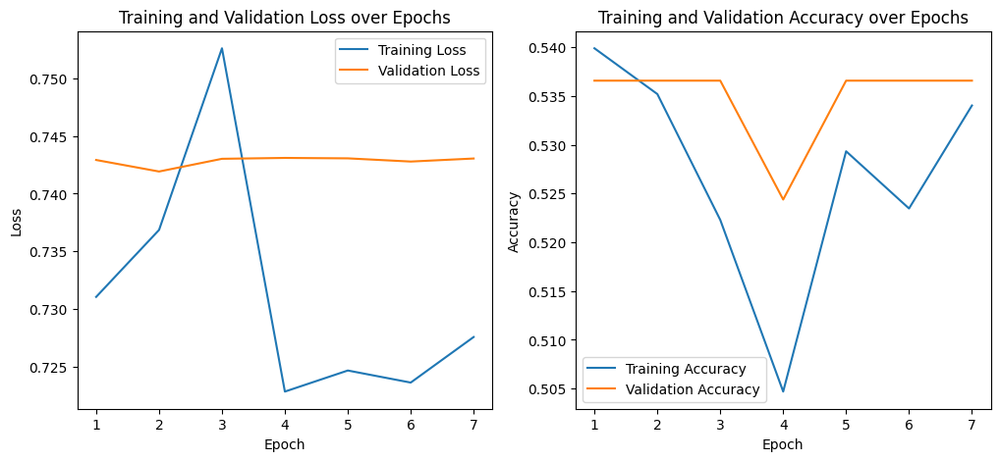

Test Loss: 0.7430, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7826, Val Loss: 0.7610, Train Acc: 0.4847, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7576, Val Loss: 0.7600, Train Acc: 0.5000, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7440, Val Loss: 0.7596, Train Acc: 0.4871, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7654, Val Loss: 0.7588, Train Acc: 0.4918, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7825, Val Loss: 0.7582, Train Acc: 0.4965, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7646, Val Loss: 0.7575, Train Acc: 0.4918, Val Acc: 0.4634
Epoch [7/100], Train Loss: 0.7747, Val Loss: 0.7573, Train Acc: 0.4847, Val Acc: 0.4634
Epoch [8/100], Train Loss: 0.7571, Val Loss: 0.7569, Train Acc: 0.4930, Val Acc: 0.4634
Epoch [9/100], Train Loss: 0.7589, Val Loss: 0.7564, Train Acc: 0

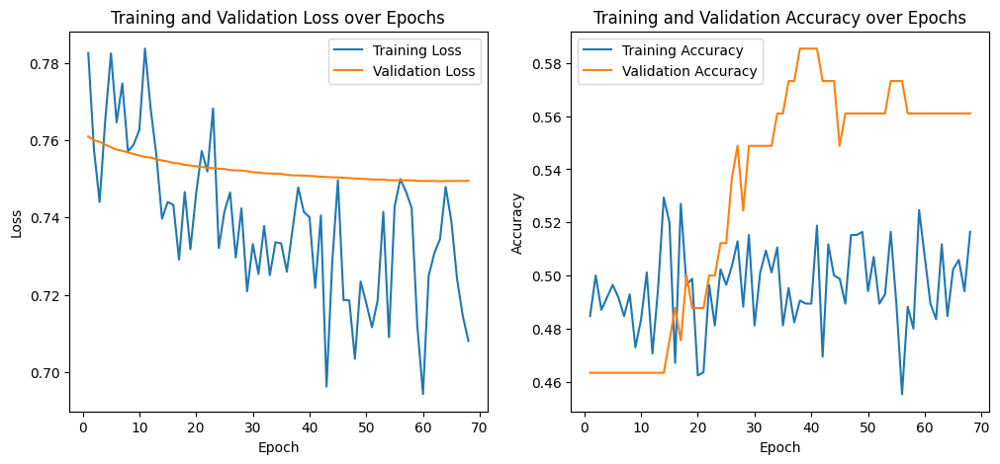

Test Loss: 0.7495, Accuracy: 56.10
Validation Accuracy: 56.10%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7532, Val Loss: 0.7439, Train Acc: 0.4824, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7560, Val Loss: 0.7458, Train Acc: 0.4718, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7512, Val Loss: 0.7465, Train Acc: 0.4859, Val Acc: 0.5488
Epoch [4/100], Train Loss: 0.7772, Val Loss: 0.7470, Train Acc: 0.4941, Val Acc: 0.5122
Epoch [5/100], Train Loss: 0.7494, Val Loss: 0.7471, Train Acc: 0.5012, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7621, Val Loss: 0.7471, Train Acc: 0.4883, Val Acc: 0.5000
Early stopping triggered.


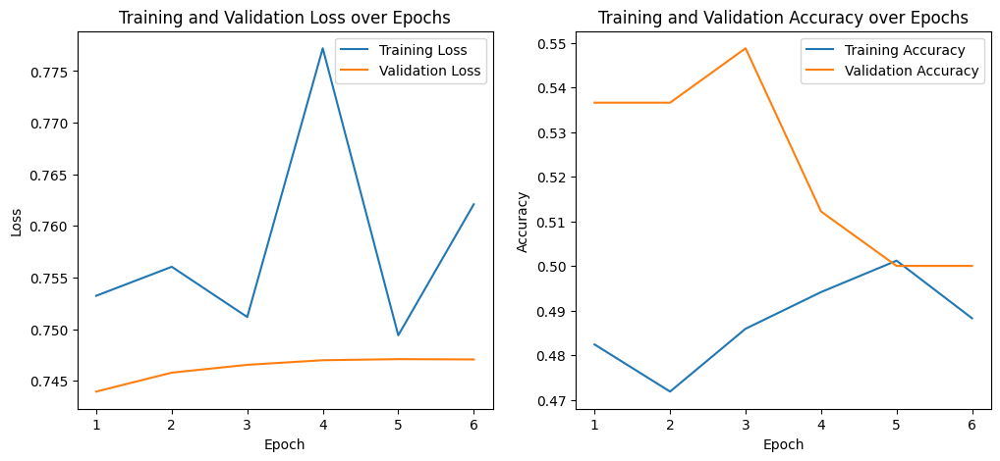

Test Loss: 0.7471, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 32, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7228, Val Loss: 0.7485, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6965, Val Loss: 0.7471, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7107, Val Loss: 0.7445, Train Acc: 0.5282, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7262, Val Loss: 0.7439, Train Acc: 0.4859, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7571, Val Loss: 0.7433, Train Acc: 0.4906, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7249, Val Loss: 0.7432, Train Acc: 0.5082, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7352, Val Loss: 0.7433, Train Acc: 0.4941, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7128, Val Loss: 0.7434, Train Acc: 0.5000, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7373, Val Loss: 0.7432, Train Acc: 0.

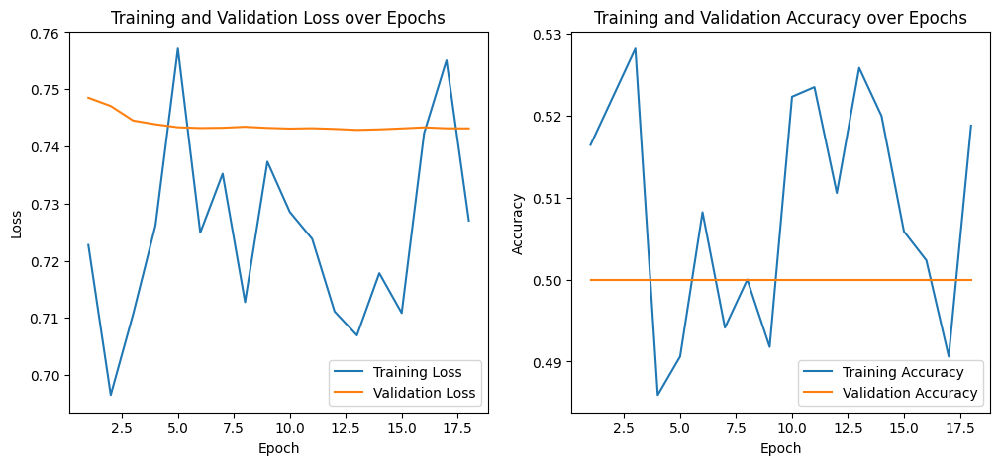

Test Loss: 0.7432, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6878, Val Loss: 0.6932, Train Acc: 0.5528, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6815, Val Loss: 0.6910, Train Acc: 0.5657, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6644, Val Loss: 0.6766, Train Acc: 0.6092, Val Acc: 0.6585
Epoch [4/100], Train Loss: 0.6508, Val Loss: 0.6703, Train Acc: 0.6408, Val Acc: 0.5976
Epoch [5/100], Train Loss: 0.6389, Val Loss: 0.6568, Train Acc: 0.6561, Val Acc: 0.6829
Epoch [6/100], Train Loss: 0.6254, Val Loss: 0.6495, Train Acc: 0.6808, Val Acc: 0.6707
Epoch [7/100], Train Loss: 0.6058, Val Loss: 0.6401, Train Acc: 0.6808, Val Acc: 0.6829
Epoch [8/100], Train Loss: 0.5824, Val Loss: 0.6350, Train Acc: 0.7089, Val Acc: 0.6585
Epoch [9/100], Train Loss: 0.5745, Val Loss: 0.6256, Train Acc: 0.71

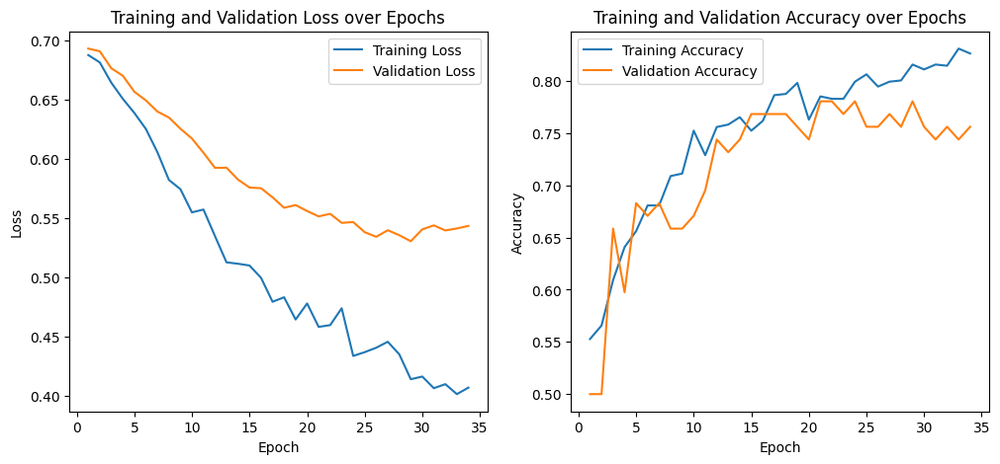

Test Loss: 0.5436, Accuracy: 75.61
Validation Accuracy: 75.61%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6901, Val Loss: 0.6923, Train Acc: 0.5387, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6876, Val Loss: 0.6882, Train Acc: 0.5493, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6726, Val Loss: 0.6794, Train Acc: 0.5669, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6836, Val Loss: 0.6696, Train Acc: 0.5634, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6623, Val Loss: 0.6662, Train Acc: 0.5951, Val Acc: 0.6220
Epoch [6/100], Train Loss: 0.6640, Val Loss: 0.6637, Train Acc: 0.6033, Val Acc: 0.6585
Epoch [7/100], Train Loss: 0.6436, Val Loss: 0.6529, Train Acc: 0.6268, Val Acc: 0.6463
Epoch [8/100], Train Loss: 0.6479, Val Loss: 0.6495, Train Acc: 0.6455, Val Acc: 0.6707
Epoch [9/100], Train Loss: 0.6330, Val Loss: 0.6388, Train Acc:

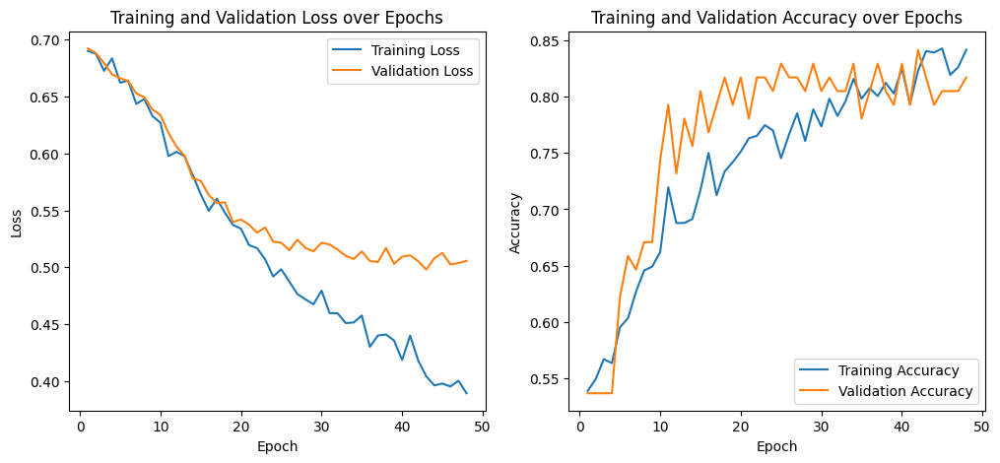

Test Loss: 0.5056, Accuracy: 81.71
Validation Accuracy: 81.71%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6905, Val Loss: 0.6937, Train Acc: 0.5423, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6932, Val Loss: 0.6928, Train Acc: 0.5023, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.6940, Val Loss: 0.6908, Train Acc: 0.5035, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.6946, Val Loss: 0.6876, Train Acc: 0.5188, Val Acc: 0.5976
Epoch [5/100], Train Loss: 0.6921, Val Loss: 0.6862, Train Acc: 0.5317, Val Acc: 0.6098
Epoch [6/100], Train Loss: 0.6930, Val Loss: 0.6852, Train Acc: 0.5223, Val Acc: 0.5976
Epoch [7/100], Train Loss: 0.6843, Val Loss: 0.6845, Train Acc: 0.5411, Val Acc: 0.5854
Epoch [8/100], Train Loss: 0.6907, Val Loss: 0.6838, Train Acc: 0.5528, Val Acc: 0.5732
Epoch [9/100], Train Loss: 0.6883, Val Loss: 0.6830, Train Acc: 0.541

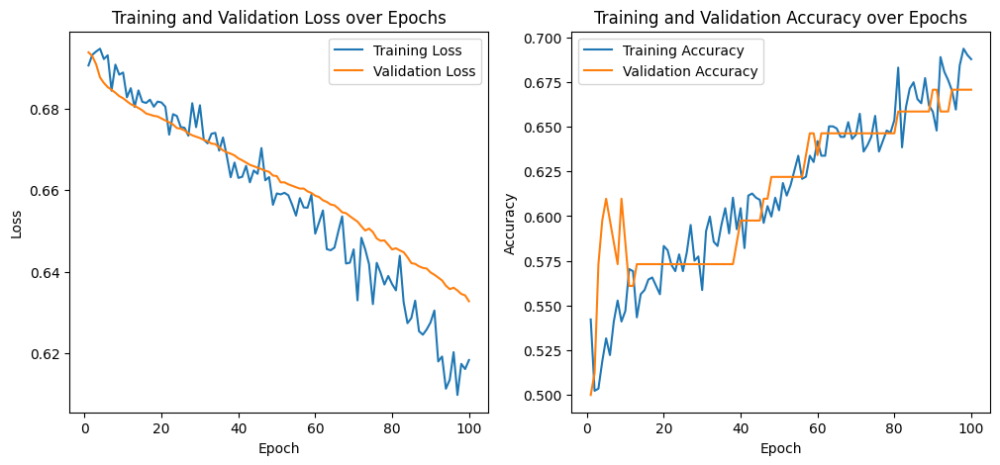

Test Loss: 0.6328, Accuracy: 67.07
Validation Accuracy: 67.07%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6961, Val Loss: 0.6993, Train Acc: 0.5200, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6977, Val Loss: 0.6984, Train Acc: 0.4906, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.6907, Val Loss: 0.6959, Train Acc: 0.5035, Val Acc: 0.4878
Epoch [4/100], Train Loss: 0.6947, Val Loss: 0.6946, Train Acc: 0.4953, Val Acc: 0.4756
Epoch [5/100], Train Loss: 0.6940, Val Loss: 0.6928, Train Acc: 0.5117, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.6837, Val Loss: 0.6908, Train Acc: 0.5657, Val Acc: 0.4878
Epoch [7/100], Train Loss: 0.6845, Val Loss: 0.6896, Train Acc: 0.5376, Val Acc: 0.4634
Epoch [8/100], Train Loss: 0.6817, Val Loss: 0.6883, Train Acc: 0.5704, Val Acc: 0.4634
Epoch [9/100], Train Loss: 0.6800, Val Loss: 0.6876, Train Acc: 

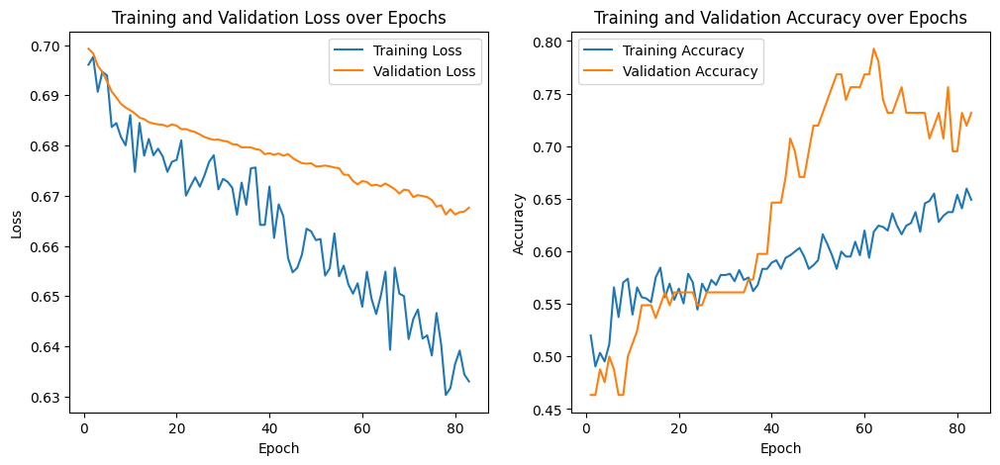

Test Loss: 0.6676, Accuracy: 73.17
Validation Accuracy: 73.17%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6955, Val Loss: 0.6949, Train Acc: 0.4953, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6930, Val Loss: 0.6897, Train Acc: 0.5235, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6854, Val Loss: 0.6846, Train Acc: 0.5563, Val Acc: 0.5854
Epoch [4/100], Train Loss: 0.6789, Val Loss: 0.6805, Train Acc: 0.5739, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.6864, Val Loss: 0.6781, Train Acc: 0.5528, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6818, Val Loss: 0.6773, Train Acc: 0.5751, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6832, Val Loss: 0.6764, Train Acc: 0.5599, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6758, Val Loss: 0.6755, Train Acc: 0.5798, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6741, Val Loss: 0.6746, Train Acc: 0.581

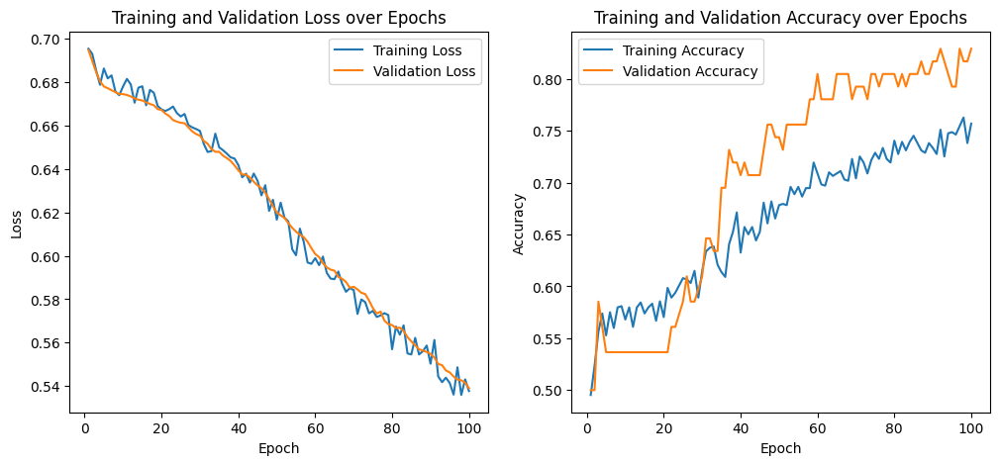

Test Loss: 0.5390, Accuracy: 82.93
Validation Accuracy: 82.93%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6940, Val Loss: 0.6924, Train Acc: 0.5246, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6918, Val Loss: 0.6901, Train Acc: 0.5516, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6947, Val Loss: 0.6859, Train Acc: 0.5329, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6882, Val Loss: 0.6816, Train Acc: 0.5399, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6907, Val Loss: 0.6792, Train Acc: 0.5552, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6881, Val Loss: 0.6780, Train Acc: 0.5434, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6813, Val Loss: 0.6770, Train Acc: 0.5622, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6785, Val Loss: 0.6763, Train Acc: 0.5610, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6844, Val Loss: 0.6749, Train Acc: 

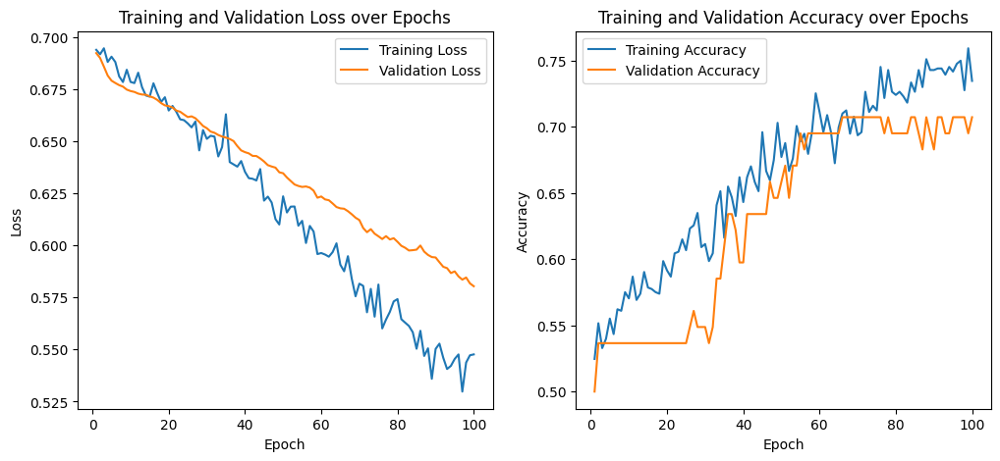

Test Loss: 0.5804, Accuracy: 70.73
Validation Accuracy: 70.73%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7001, Val Loss: 0.6872, Train Acc: 0.4918, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6989, Val Loss: 0.6876, Train Acc: 0.5082, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6982, Val Loss: 0.6885, Train Acc: 0.5141, Val Acc: 0.5610
Epoch [4/100], Train Loss: 0.6964, Val Loss: 0.6899, Train Acc: 0.5047, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.6926, Val Loss: 0.6907, Train Acc: 0.5364, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7013, Val Loss: 0.6907, Train Acc: 0.4965, Val Acc: 0.5488
Early stopping triggered.


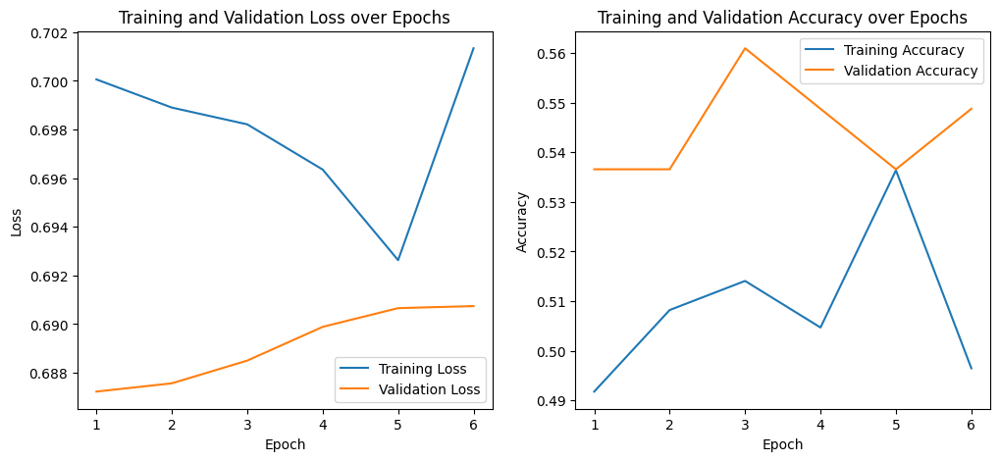

Test Loss: 0.6907, Accuracy: 54.88
Validation Accuracy: 54.88%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6991, Val Loss: 0.6948, Train Acc: 0.4812, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6951, Val Loss: 0.6954, Train Acc: 0.5000, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6879, Val Loss: 0.6944, Train Acc: 0.5258, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.6958, Val Loss: 0.6937, Train Acc: 0.4847, Val Acc: 0.5122
Epoch [5/100], Train Loss: 0.6993, Val Loss: 0.6933, Train Acc: 0.4859, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.6922, Val Loss: 0.6929, Train Acc: 0.5106, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.6947, Val Loss: 0.6929, Train Acc: 0.4894, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6964, Val Loss: 0.6928, Train Acc: 0.4965, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6944, Val Loss: 0.6927, Train Acc: 0

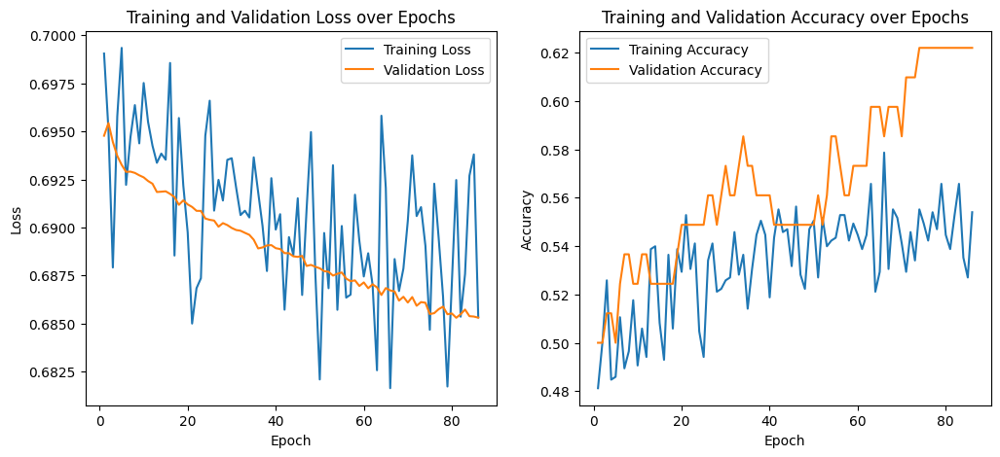

Test Loss: 0.6853, Accuracy: 62.20
Validation Accuracy: 62.20%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6897, Val Loss: 0.6966, Train Acc: 0.5387, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6905, Val Loss: 0.6951, Train Acc: 0.5176, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6899, Val Loss: 0.6929, Train Acc: 0.5282, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.6910, Val Loss: 0.6911, Train Acc: 0.5305, Val Acc: 0.5732
Epoch [5/100], Train Loss: 0.6923, Val Loss: 0.6904, Train Acc: 0.5246, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6920, Val Loss: 0.6903, Train Acc: 0.5153, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6873, Val Loss: 0.6901, Train Acc: 0.5634, Val Acc: 0.5610
Epoch [8/100], Train Loss: 0.6941, Val Loss: 0.6899, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6936, Val Loss: 0.6896, Train Acc: 0.508

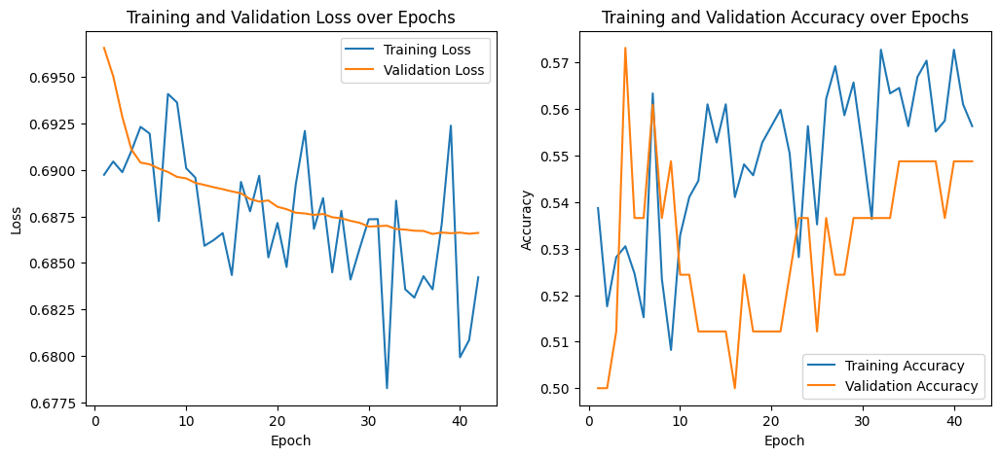

Test Loss: 0.6866, Accuracy: 54.88
Validation Accuracy: 54.88%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7035, Val Loss: 0.6940, Train Acc: 0.4707, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7010, Val Loss: 0.6944, Train Acc: 0.4777, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6994, Val Loss: 0.6963, Train Acc: 0.5000, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7003, Val Loss: 0.6967, Train Acc: 0.4941, Val Acc: 0.5122
Epoch [5/100], Train Loss: 0.7032, Val Loss: 0.6966, Train Acc: 0.4800, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7006, Val Loss: 0.6963, Train Acc: 0.4953, Val Acc: 0.4756
Early stopping triggered.


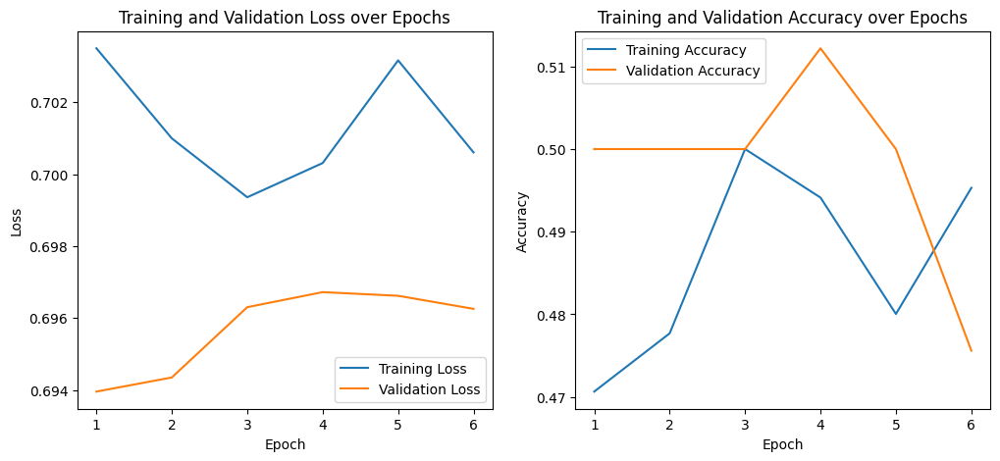

Test Loss: 0.6963, Accuracy: 47.56
Validation Accuracy: 47.56%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6953, Val Loss: 0.6901, Train Acc: 0.5082, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6948, Val Loss: 0.6886, Train Acc: 0.5094, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7009, Val Loss: 0.6889, Train Acc: 0.5059, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6968, Val Loss: 0.6896, Train Acc: 0.5070, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6913, Val Loss: 0.6900, Train Acc: 0.5141, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6911, Val Loss: 0.6901, Train Acc: 0.5082, Val Acc: 0.5122
Epoch [7/100], Train Loss: 0.6953, Val Loss: 0.6901, Train Acc: 0.5176, Val Acc: 0.5122
Early stopping triggered.


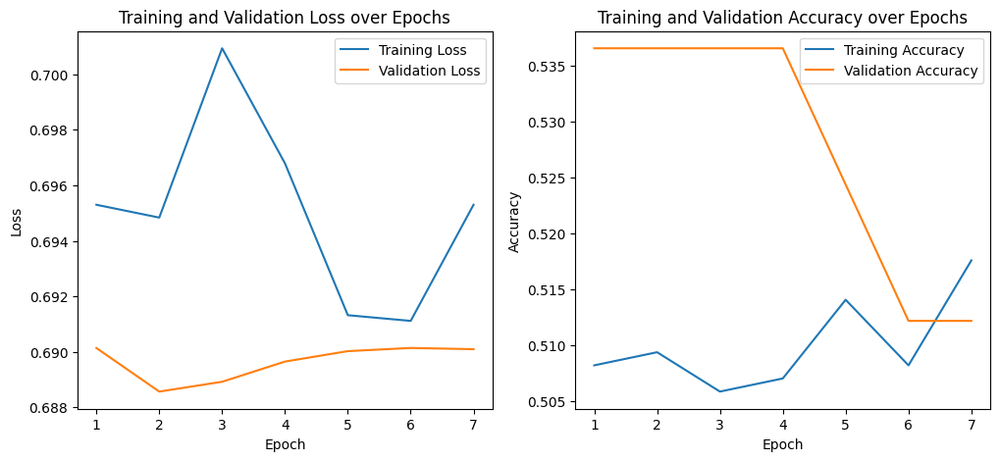

Test Loss: 0.6901, Accuracy: 51.22
Validation Accuracy: 51.22%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6981, Val Loss: 0.6972, Train Acc: 0.5023, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6944, Val Loss: 0.6968, Train Acc: 0.5164, Val Acc: 0.4512
Epoch [3/100], Train Loss: 0.6989, Val Loss: 0.6962, Train Acc: 0.4941, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.6959, Val Loss: 0.6951, Train Acc: 0.4812, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6964, Val Loss: 0.6949, Train Acc: 0.5164, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6946, Val Loss: 0.6948, Train Acc: 0.4988, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6948, Val Loss: 0.6948, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6937, Val Loss: 0.6949, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6900, Val Loss: 0.6951, Train Acc: 0

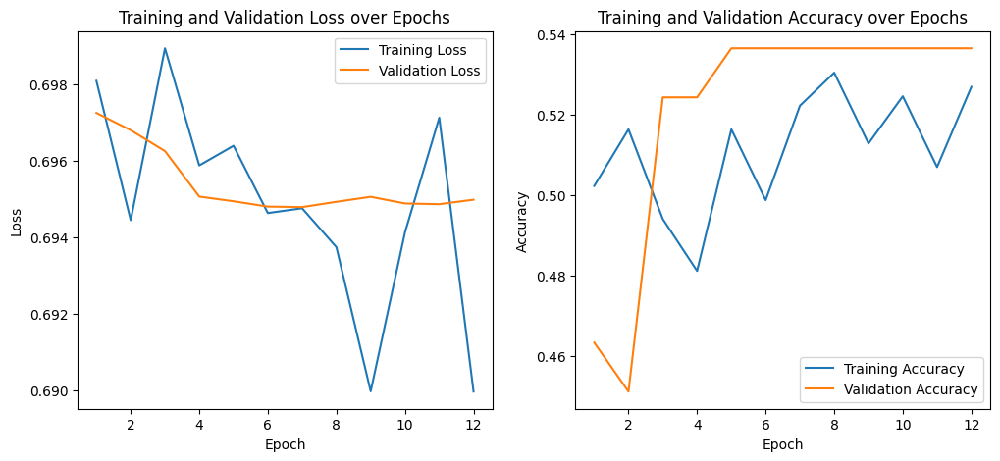

Test Loss: 0.6950, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7143, Val Loss: 0.6934, Train Acc: 0.5082, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7110, Val Loss: 0.6905, Train Acc: 0.5211, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6976, Val Loss: 0.6883, Train Acc: 0.5646, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6913, Val Loss: 0.6880, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7031, Val Loss: 0.6877, Train Acc: 0.5481, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6964, Val Loss: 0.6879, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7031, Val Loss: 0.6869, Train Acc: 0.5153, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7005, Val Loss: 0.6878, Train Acc: 0.5563, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6920, Val Loss: 0.6890, Train Acc: 0.53

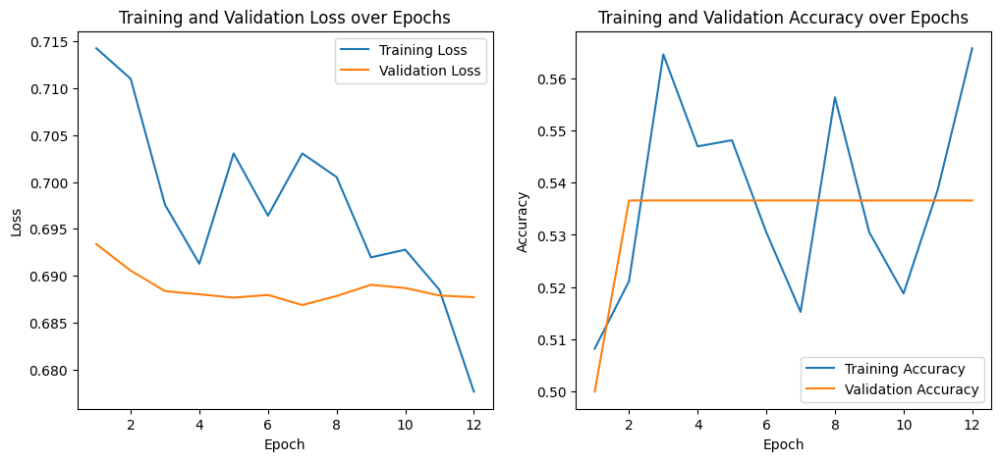

Test Loss: 0.6877, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7135, Val Loss: 0.6933, Train Acc: 0.5059, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7069, Val Loss: 0.6917, Train Acc: 0.5364, Val Acc: 0.5732
Epoch [3/100], Train Loss: 0.7067, Val Loss: 0.6905, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6949, Val Loss: 0.6893, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7034, Val Loss: 0.6892, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6877, Val Loss: 0.6884, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7024, Val Loss: 0.6886, Train Acc: 0.5505, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6934, Val Loss: 0.6902, Train Acc: 0.5387, Val Acc: 0.5854
Epoch [9/100], Train Loss: 0.6913, Val Loss: 0.6896, Train Acc:

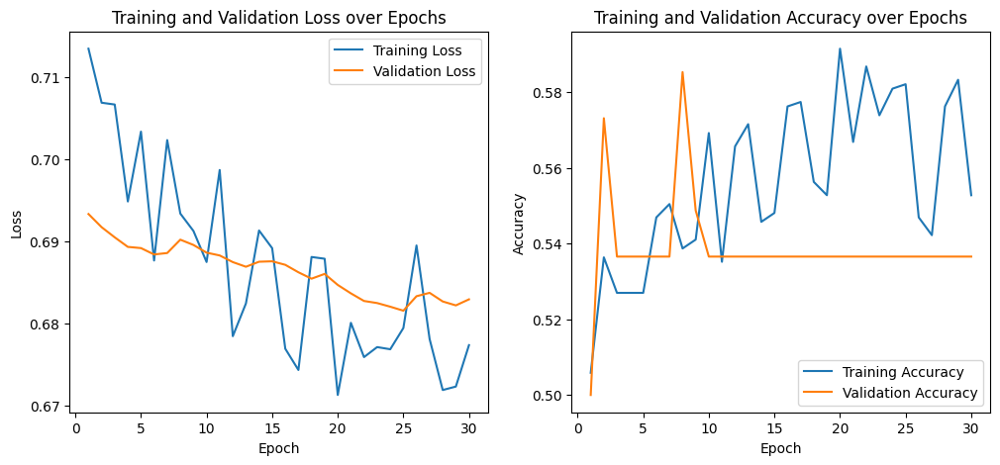

Test Loss: 0.6829, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7068, Val Loss: 0.6968, Train Acc: 0.5200, Val Acc: 0.4512
Epoch [2/100], Train Loss: 0.7078, Val Loss: 0.6963, Train Acc: 0.5188, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7173, Val Loss: 0.6955, Train Acc: 0.4847, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.7077, Val Loss: 0.6942, Train Acc: 0.5094, Val Acc: 0.5732
Epoch [5/100], Train Loss: 0.6935, Val Loss: 0.6935, Train Acc: 0.5282, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6975, Val Loss: 0.6927, Train Acc: 0.5258, Val Acc: 0.5122
Epoch [7/100], Train Loss: 0.7061, Val Loss: 0.6923, Train Acc: 0.5387, Val Acc: 0.5122
Epoch [8/100], Train Loss: 0.7052, Val Loss: 0.6917, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7002, Val Loss: 0.6913, Train Acc: 0.522

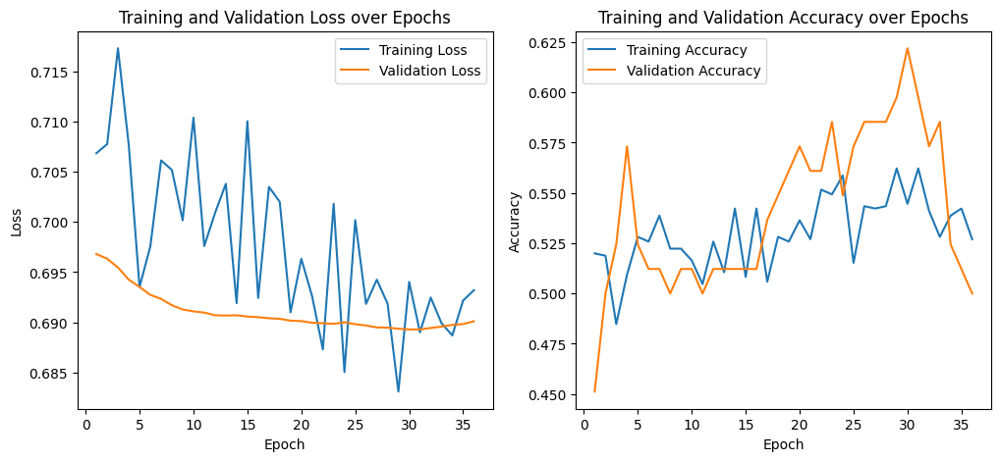

Test Loss: 0.6901, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7087, Val Loss: 0.6976, Train Acc: 0.4953, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7154, Val Loss: 0.6963, Train Acc: 0.4941, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7117, Val Loss: 0.6946, Train Acc: 0.5117, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7167, Val Loss: 0.6936, Train Acc: 0.4894, Val Acc: 0.5122
Epoch [5/100], Train Loss: 0.7205, Val Loss: 0.6924, Train Acc: 0.4883, Val Acc: 0.5488
Epoch [6/100], Train Loss: 0.7290, Val Loss: 0.6917, Train Acc: 0.4683, Val Acc: 0.5732
Epoch [7/100], Train Loss: 0.6982, Val Loss: 0.6912, Train Acc: 0.5329, Val Acc: 0.6098
Epoch [8/100], Train Loss: 0.7092, Val Loss: 0.6909, Train Acc: 0.5106, Val Acc: 0.5610
Epoch [9/100], Train Loss: 0.6960, Val Loss: 0.6906, Train Acc: 

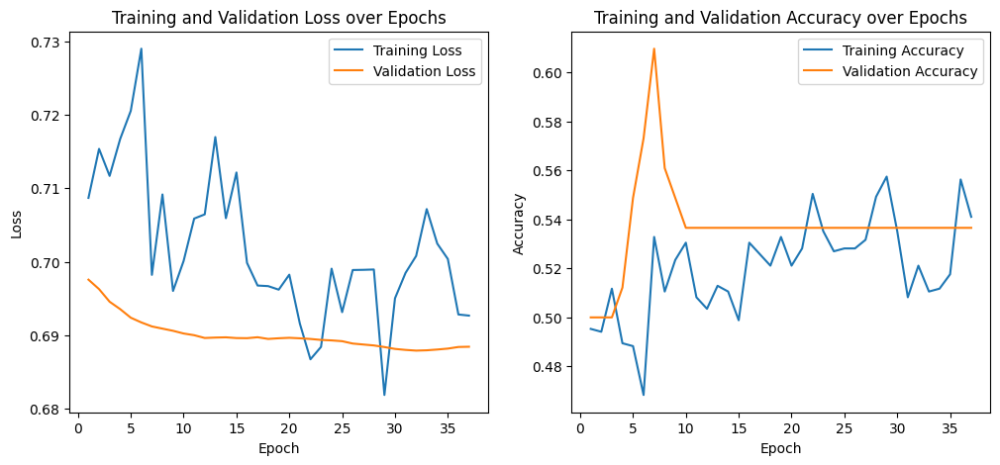

Test Loss: 0.6884, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7041, Val Loss: 0.6903, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7080, Val Loss: 0.6889, Train Acc: 0.5352, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7064, Val Loss: 0.6886, Train Acc: 0.5293, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7193, Val Loss: 0.6885, Train Acc: 0.5000, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7091, Val Loss: 0.6884, Train Acc: 0.5117, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7136, Val Loss: 0.6882, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7037, Val Loss: 0.6880, Train Acc: 0.5317, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6985, Val Loss: 0.6878, Train Acc: 0.5376, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7043, Val Loss: 0.6878, Train Acc: 0.544

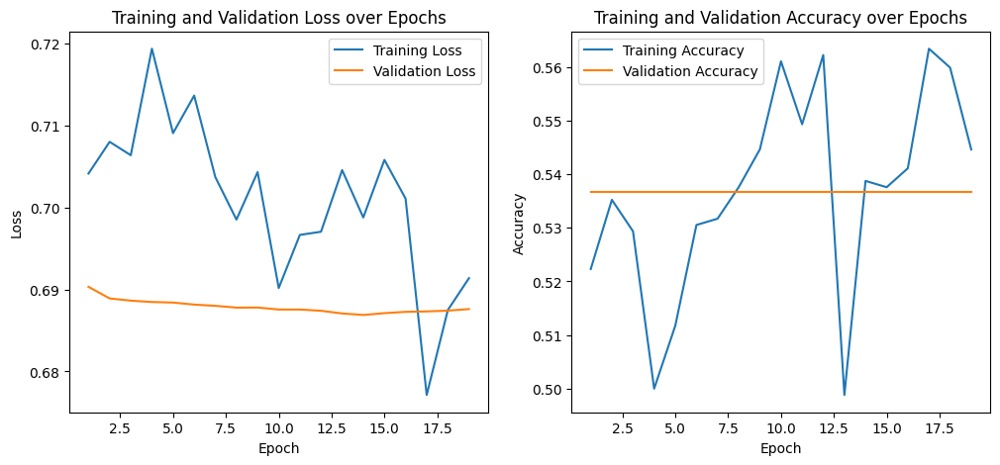

Test Loss: 0.6876, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7301, Val Loss: 0.6959, Train Acc: 0.4941, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7089, Val Loss: 0.6943, Train Acc: 0.4918, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.7105, Val Loss: 0.6920, Train Acc: 0.4930, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7122, Val Loss: 0.6908, Train Acc: 0.5000, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7045, Val Loss: 0.6902, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7000, Val Loss: 0.6898, Train Acc: 0.5364, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.6898, Val Loss: 0.6894, Train Acc: 0.5634, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.6956, Val Loss: 0.6894, Train Acc: 0.5246, Val Acc: 0.5122
Epoch [9/100], Train Loss: 0.7037, Val Loss: 0.6893, Train Acc: 

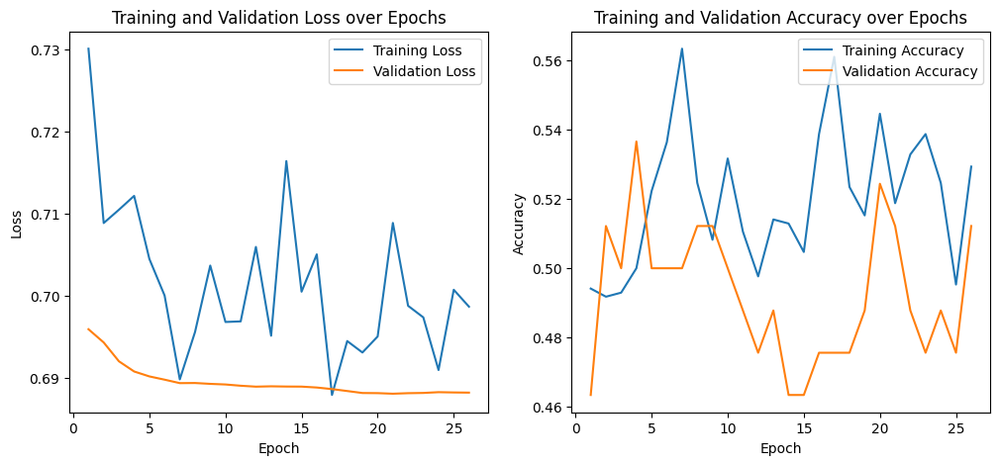

Test Loss: 0.6882, Accuracy: 51.22
Validation Accuracy: 51.22%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7106, Val Loss: 0.6938, Train Acc: 0.4965, Val Acc: 0.4512
Epoch [2/100], Train Loss: 0.7102, Val Loss: 0.6933, Train Acc: 0.5047, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7137, Val Loss: 0.6935, Train Acc: 0.5000, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7181, Val Loss: 0.6932, Train Acc: 0.4941, Val Acc: 0.4878
Epoch [5/100], Train Loss: 0.7283, Val Loss: 0.6930, Train Acc: 0.4953, Val Acc: 0.4878
Epoch [6/100], Train Loss: 0.7175, Val Loss: 0.6928, Train Acc: 0.5200, Val Acc: 0.4756
Epoch [7/100], Train Loss: 0.7144, Val Loss: 0.6928, Train Acc: 0.5153, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7267, Val Loss: 0.6927, Train Acc: 0.4718, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7243, Val Loss: 0.6926, Train Acc: 0.5094

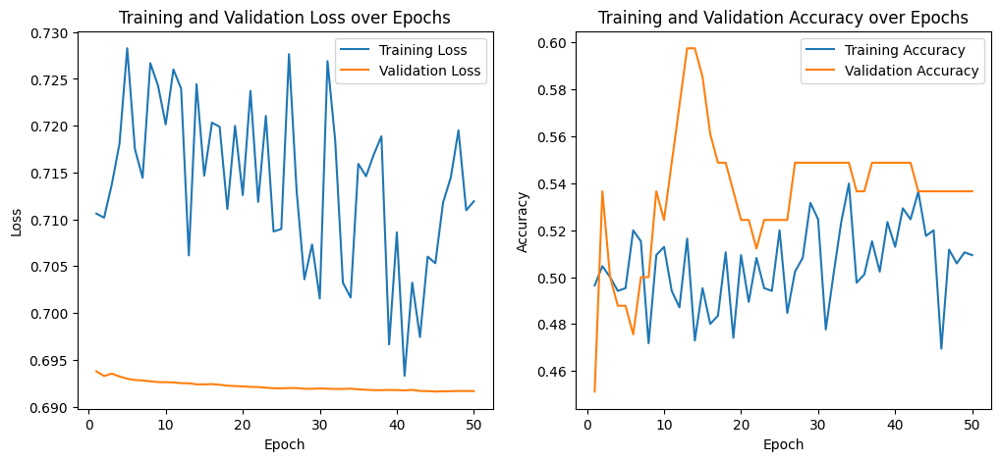

Test Loss: 0.6917, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6928, Val Loss: 0.6965, Train Acc: 0.5434, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7117, Val Loss: 0.6953, Train Acc: 0.5059, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7152, Val Loss: 0.6952, Train Acc: 0.5200, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7105, Val Loss: 0.6957, Train Acc: 0.4894, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.6975, Val Loss: 0.6956, Train Acc: 0.5282, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7218, Val Loss: 0.6957, Train Acc: 0.4871, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7101, Val Loss: 0.6956, Train Acc: 0.5188, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7172, Val Loss: 0.6956, Train Acc: 0.5012, Val Acc: 0.5000
Early stopping triggered.


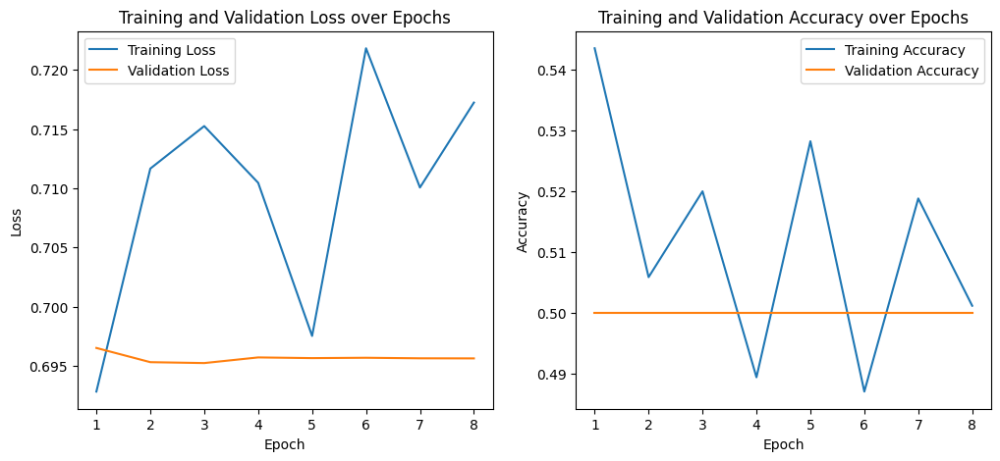

Test Loss: 0.6956, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7224, Val Loss: 0.6945, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7222, Val Loss: 0.6948, Train Acc: 0.4906, Val Acc: 0.4756
Epoch [3/100], Train Loss: 0.7203, Val Loss: 0.6938, Train Acc: 0.4941, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7323, Val Loss: 0.6935, Train Acc: 0.4707, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7326, Val Loss: 0.6934, Train Acc: 0.4918, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.7169, Val Loss: 0.6933, Train Acc: 0.5023, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7351, Val Loss: 0.6931, Train Acc: 0.4695, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.7208, Val Loss: 0.6929, Train Acc: 0.4707, Val Acc: 0.5244
Epoch [9/100], Train Loss: 0.7241, Val Loss: 0.6928, Train Acc: 0.483

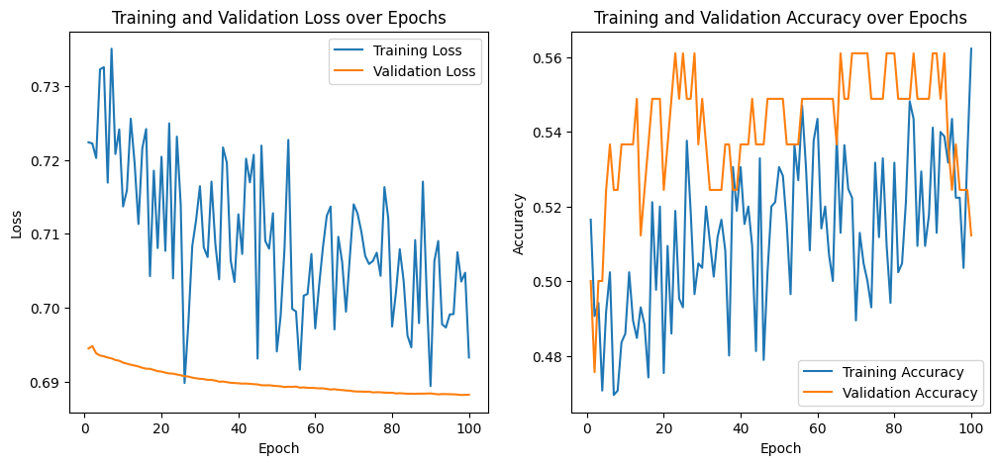

Test Loss: 0.6882, Accuracy: 51.22
Validation Accuracy: 51.22%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7420, Val Loss: 0.6943, Train Acc: 0.4566, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7191, Val Loss: 0.6948, Train Acc: 0.4789, Val Acc: 0.5488
Epoch [3/100], Train Loss: 0.7392, Val Loss: 0.6950, Train Acc: 0.4824, Val Acc: 0.4878
Epoch [4/100], Train Loss: 0.7424, Val Loss: 0.6953, Train Acc: 0.4742, Val Acc: 0.4756
Epoch [5/100], Train Loss: 0.7565, Val Loss: 0.6953, Train Acc: 0.4566, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7398, Val Loss: 0.6952, Train Acc: 0.4730, Val Acc: 0.4390
Early stopping triggered.


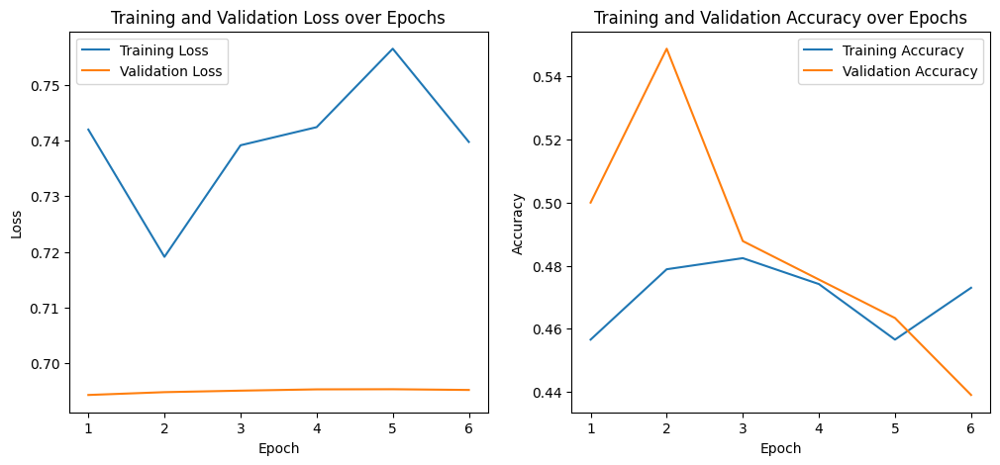

Test Loss: 0.6952, Accuracy: 43.90
Validation Accuracy: 43.90%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7079, Val Loss: 0.6933, Train Acc: 0.5200, Val Acc: 0.4756
Epoch [2/100], Train Loss: 0.7020, Val Loss: 0.6927, Train Acc: 0.5317, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.7299, Val Loss: 0.6921, Train Acc: 0.5047, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.7097, Val Loss: 0.6919, Train Acc: 0.5000, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.7025, Val Loss: 0.6919, Train Acc: 0.5141, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7017, Val Loss: 0.6919, Train Acc: 0.5282, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7136, Val Loss: 0.6919, Train Acc: 0.4977, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7164, Val Loss: 0.6920, Train Acc: 0.5211, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6973, Val Loss: 0.6919, Train Acc: 0.5399

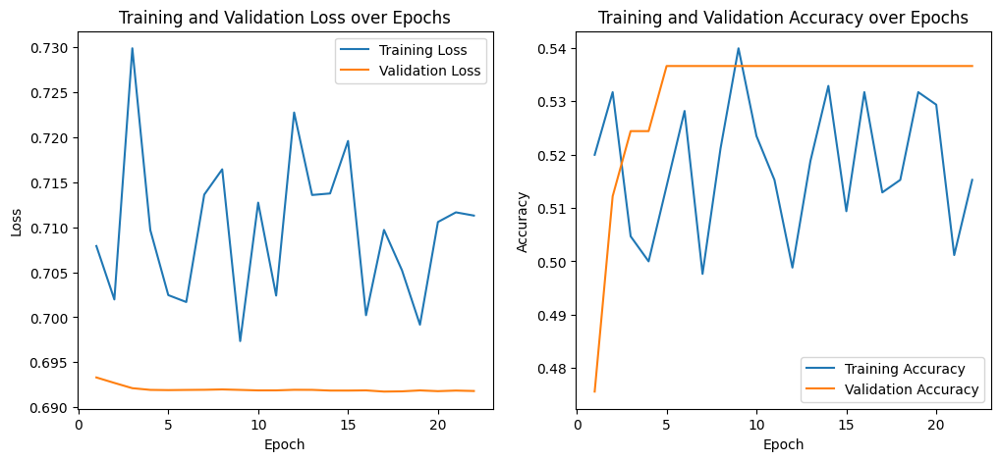

Test Loss: 0.6918, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 32, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7268, Val Loss: 0.6914, Train Acc: 0.4918, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7331, Val Loss: 0.6920, Train Acc: 0.4941, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7242, Val Loss: 0.6920, Train Acc: 0.4930, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7183, Val Loss: 0.6913, Train Acc: 0.5000, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7228, Val Loss: 0.6911, Train Acc: 0.4930, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7224, Val Loss: 0.6909, Train Acc: 0.4718, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7297, Val Loss: 0.6909, Train Acc: 0.4883, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7227, Val Loss: 0.6909, Train Acc: 0.4812, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7113, Val Loss: 0.6910, Train Acc: 0

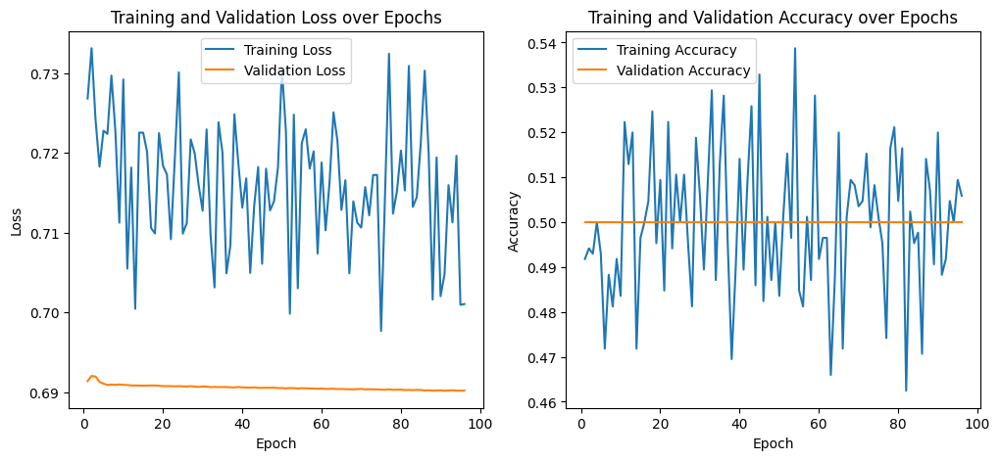

Test Loss: 0.6902, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6985, Val Loss: 0.7532, Train Acc: 0.5200, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6763, Val Loss: 0.7502, Train Acc: 0.5939, Val Acc: 0.4878
Epoch [3/100], Train Loss: 0.6656, Val Loss: 0.7332, Train Acc: 0.5833, Val Acc: 0.7195
Epoch [4/100], Train Loss: 0.6573, Val Loss: 0.7156, Train Acc: 0.5822, Val Acc: 0.7317
Epoch [5/100], Train Loss: 0.6458, Val Loss: 0.7093, Train Acc: 0.5857, Val Acc: 0.7683
Epoch [6/100], Train Loss: 0.6361, Val Loss: 0.6867, Train Acc: 0.6138, Val Acc: 0.7805
Epoch [7/100], Train Loss: 0.6227, Val Loss: 0.6749, Train Acc: 0.6397, Val Acc: 0.7805
Epoch [8/100], Train Loss: 0.6134, Val Loss: 0.6562, Train Acc: 0.6408, Val Acc: 0.7927
Epoch [9/100], Train Loss: 0.5995, Val Loss: 0.6350, Train Acc: 0.642

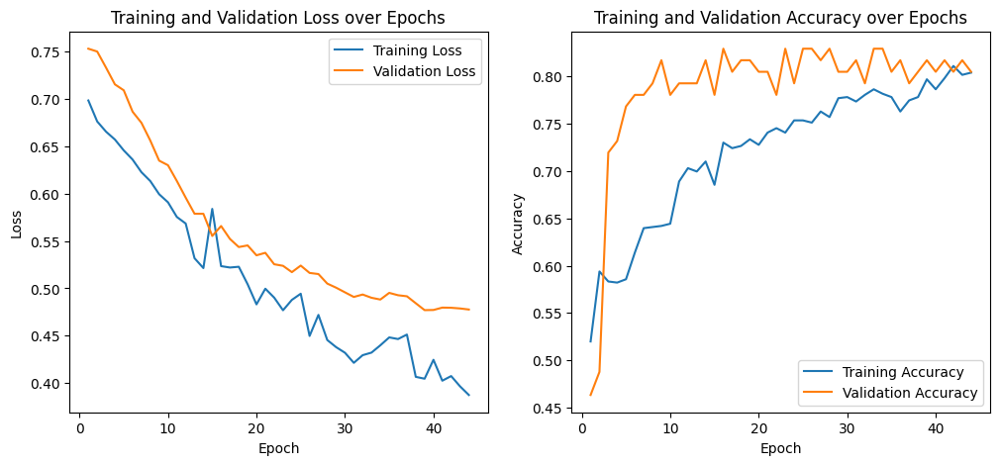

Test Loss: 0.4350, Accuracy: 80.49
Validation Accuracy: 80.49%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6950, Val Loss: 0.7523, Train Acc: 0.5317, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7054, Val Loss: 0.7401, Train Acc: 0.4930, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.6838, Val Loss: 0.7343, Train Acc: 0.5293, Val Acc: 0.5488
Epoch [4/100], Train Loss: 0.6825, Val Loss: 0.7363, Train Acc: 0.5481, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.6769, Val Loss: 0.7203, Train Acc: 0.5258, Val Acc: 0.4878
Epoch [6/100], Train Loss: 0.6511, Val Loss: 0.7161, Train Acc: 0.5423, Val Acc: 0.4878
Epoch [7/100], Train Loss: 0.6538, Val Loss: 0.7090, Train Acc: 0.5540, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6328, Val Loss: 0.6986, Train Acc: 0.5927, Val Acc: 0.5976
Epoch [9/100], Train Loss: 0.6224, Val Loss: 0.6867, Train Acc: 

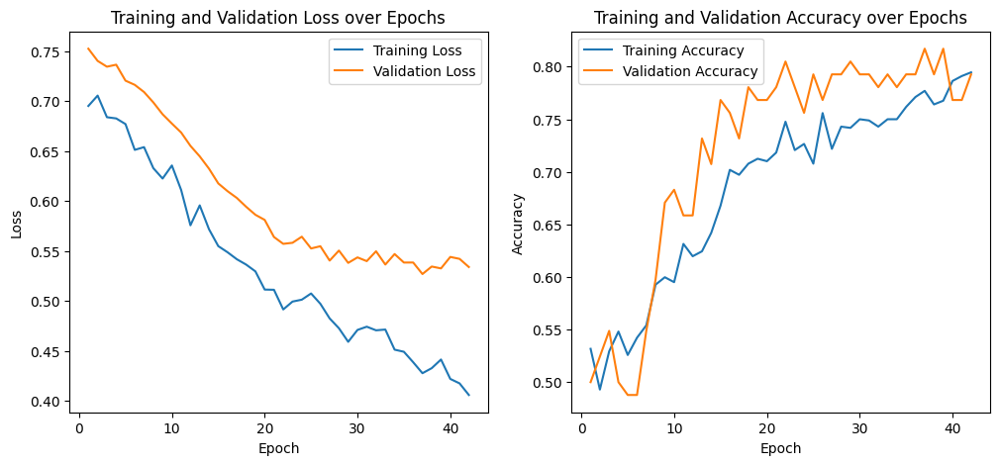

Test Loss: 0.5102, Accuracy: 79.27
Validation Accuracy: 79.27%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7147, Val Loss: 0.7463, Train Acc: 0.4495, Val Acc: 0.4878
Epoch [2/100], Train Loss: 0.7041, Val Loss: 0.7425, Train Acc: 0.5552, Val Acc: 0.5488
Epoch [3/100], Train Loss: 0.6978, Val Loss: 0.7354, Train Acc: 0.5317, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7018, Val Loss: 0.7313, Train Acc: 0.5399, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6814, Val Loss: 0.7294, Train Acc: 0.5528, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6886, Val Loss: 0.7294, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6885, Val Loss: 0.7290, Train Acc: 0.5622, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6687, Val Loss: 0.7274, Train Acc: 0.5434, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6771, Val Loss: 0.7273, Train Acc: 0.5692

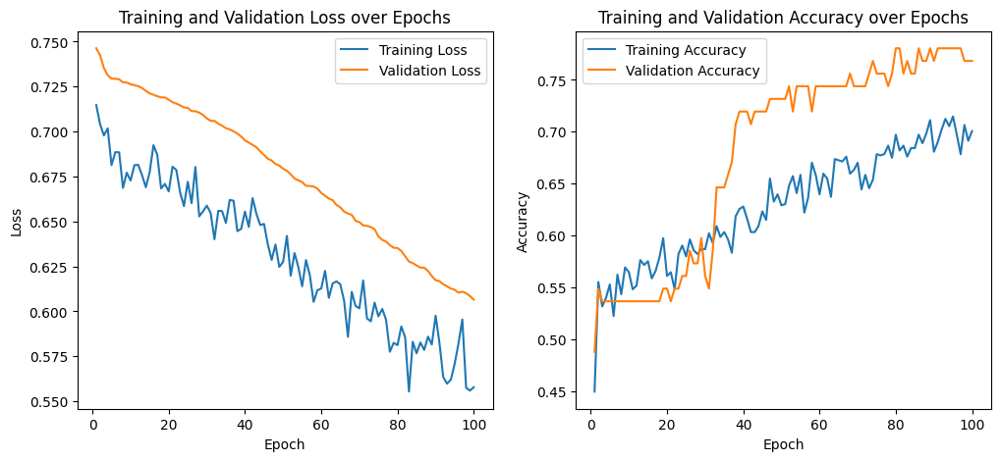

Test Loss: 0.5693, Accuracy: 76.83
Validation Accuracy: 76.83%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7237, Val Loss: 0.7578, Train Acc: 0.4636, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7283, Val Loss: 0.7558, Train Acc: 0.4601, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.6968, Val Loss: 0.7470, Train Acc: 0.5047, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.6818, Val Loss: 0.7395, Train Acc: 0.5423, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.6915, Val Loss: 0.7366, Train Acc: 0.5493, Val Acc: 0.5610
Epoch [6/100], Train Loss: 0.6925, Val Loss: 0.7355, Train Acc: 0.5399, Val Acc: 0.5610
Epoch [7/100], Train Loss: 0.6825, Val Loss: 0.7354, Train Acc: 0.5317, Val Acc: 0.5610
Epoch [8/100], Train Loss: 0.6891, Val Loss: 0.7352, Train Acc: 0.5423, Val Acc: 0.5488
Epoch [9/100], Train Loss: 0.6954, Val Loss: 0.7344, Train Acc: 0

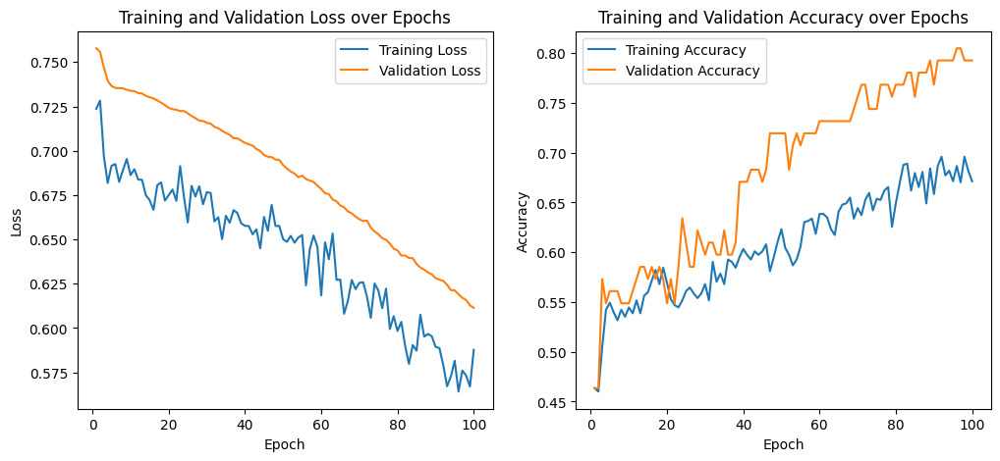

Test Loss: 0.5685, Accuracy: 79.27
Validation Accuracy: 79.27%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7064, Val Loss: 0.7492, Train Acc: 0.5012, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6934, Val Loss: 0.7444, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6951, Val Loss: 0.7390, Train Acc: 0.5364, Val Acc: 0.5854
Epoch [4/100], Train Loss: 0.6853, Val Loss: 0.7325, Train Acc: 0.5141, Val Acc: 0.6220
Epoch [5/100], Train Loss: 0.6801, Val Loss: 0.7306, Train Acc: 0.5376, Val Acc: 0.6220
Epoch [6/100], Train Loss: 0.6863, Val Loss: 0.7303, Train Acc: 0.5352, Val Acc: 0.5976
Epoch [7/100], Train Loss: 0.6761, Val Loss: 0.7294, Train Acc: 0.5270, Val Acc: 0.5976
Epoch [8/100], Train Loss: 0.6784, Val Loss: 0.7291, Train Acc: 0.5646, Val Acc: 0.6098
Epoch [9/100], Train Loss: 0.6849, Val Loss: 0.7281, Train Acc: 0.5469

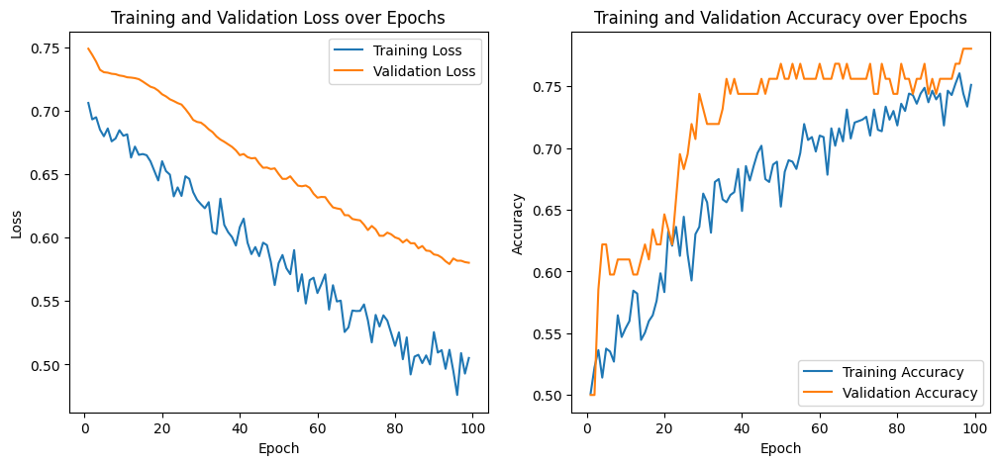

Test Loss: 0.5205, Accuracy: 78.05
Validation Accuracy: 78.05%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7009, Val Loss: 0.7423, Train Acc: 0.5305, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6882, Val Loss: 0.7328, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6912, Val Loss: 0.7247, Train Acc: 0.5481, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6807, Val Loss: 0.7222, Train Acc: 0.5469, Val Acc: 0.5976
Epoch [5/100], Train Loss: 0.6776, Val Loss: 0.7206, Train Acc: 0.5493, Val Acc: 0.6220
Epoch [6/100], Train Loss: 0.6823, Val Loss: 0.7185, Train Acc: 0.5540, Val Acc: 0.6098
Epoch [7/100], Train Loss: 0.6769, Val Loss: 0.7161, Train Acc: 0.5458, Val Acc: 0.6098
Epoch [8/100], Train Loss: 0.6770, Val Loss: 0.7144, Train Acc: 0.5235, Val Acc: 0.6098
Epoch [9/100], Train Loss: 0.6670, Val Loss: 0.7121, Train Acc: 0

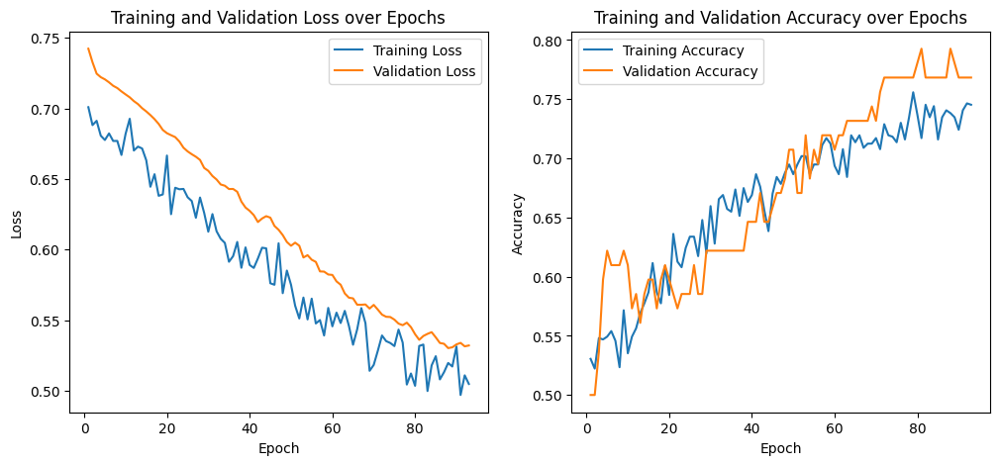

Test Loss: 0.5070, Accuracy: 76.83
Validation Accuracy: 76.83%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7776, Val Loss: 0.7632, Train Acc: 0.4354, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7701, Val Loss: 0.7714, Train Acc: 0.4460, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7661, Val Loss: 0.7760, Train Acc: 0.4484, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7494, Val Loss: 0.7741, Train Acc: 0.4507, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7577, Val Loss: 0.7719, Train Acc: 0.4331, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7539, Val Loss: 0.7700, Train Acc: 0.4401, Val Acc: 0.4634
Early stopping triggered.


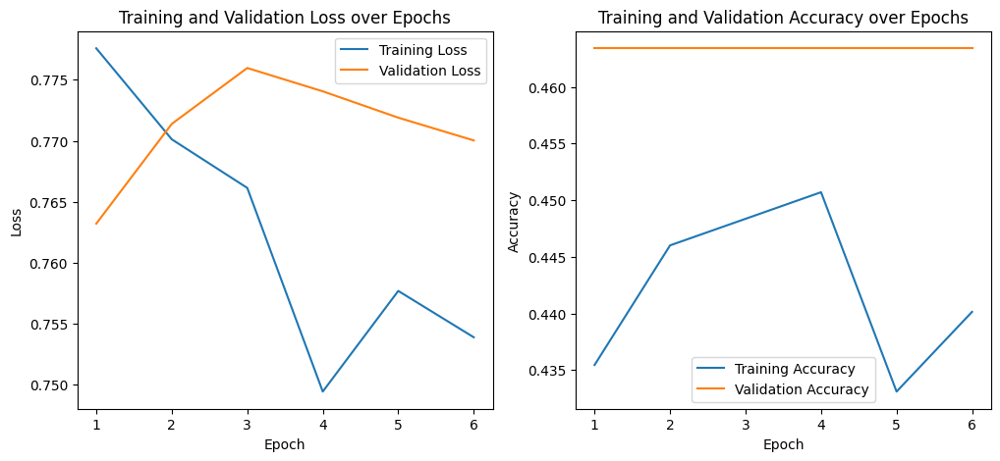

Test Loss: 0.7048, Accuracy: 46.34
Validation Accuracy: 46.34%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7186, Val Loss: 0.7534, Train Acc: 0.4707, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7152, Val Loss: 0.7560, Train Acc: 0.4660, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.7123, Val Loss: 0.7575, Train Acc: 0.4765, Val Acc: 0.4756
Epoch [4/100], Train Loss: 0.7113, Val Loss: 0.7575, Train Acc: 0.4707, Val Acc: 0.5122
Epoch [5/100], Train Loss: 0.7077, Val Loss: 0.7561, Train Acc: 0.4460, Val Acc: 0.5122
Epoch [6/100], Train Loss: 0.7026, Val Loss: 0.7551, Train Acc: 0.5176, Val Acc: 0.5000
Early stopping triggered.


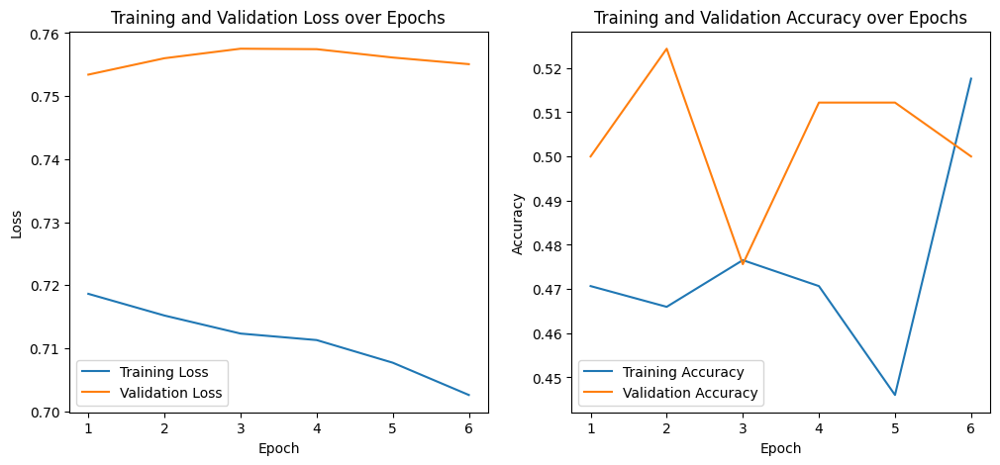

Test Loss: 0.6988, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7117, Val Loss: 0.7508, Train Acc: 0.5082, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6986, Val Loss: 0.7505, Train Acc: 0.4789, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7032, Val Loss: 0.7463, Train Acc: 0.4742, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.7101, Val Loss: 0.7439, Train Acc: 0.5047, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.7076, Val Loss: 0.7427, Train Acc: 0.4965, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6902, Val Loss: 0.7413, Train Acc: 0.5352, Val Acc: 0.5122
Epoch [7/100], Train Loss: 0.7005, Val Loss: 0.7400, Train Acc: 0.4941, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.6867, Val Loss: 0.7390, Train Acc: 0.5070, Val Acc: 0.5122
Epoch [9/100], Train Loss: 0.6884, Val Loss: 0.7382, Train Acc: 0.5293

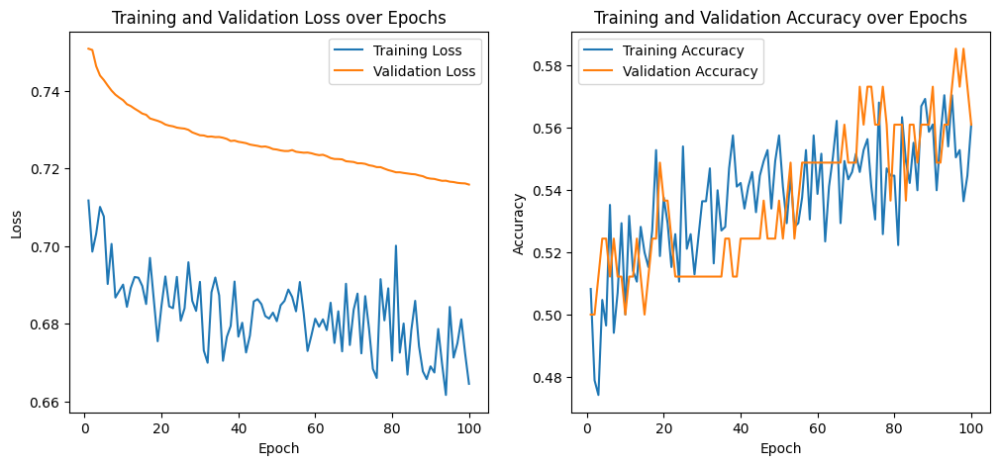

Test Loss: 0.6707, Accuracy: 56.10
Validation Accuracy: 56.10%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7040, Val Loss: 0.7552, Train Acc: 0.4648, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6982, Val Loss: 0.7528, Train Acc: 0.4566, Val Acc: 0.4878
Epoch [3/100], Train Loss: 0.7151, Val Loss: 0.7524, Train Acc: 0.4718, Val Acc: 0.4268
Epoch [4/100], Train Loss: 0.6999, Val Loss: 0.7532, Train Acc: 0.5000, Val Acc: 0.4146
Epoch [5/100], Train Loss: 0.6900, Val Loss: 0.7525, Train Acc: 0.4977, Val Acc: 0.4268
Epoch [6/100], Train Loss: 0.7127, Val Loss: 0.7517, Train Acc: 0.4707, Val Acc: 0.4146
Epoch [7/100], Train Loss: 0.6984, Val Loss: 0.7511, Train Acc: 0.4754, Val Acc: 0.3902
Epoch [8/100], Train Loss: 0.7019, Val Loss: 0.7505, Train Acc: 0.5141, Val Acc: 0.3902
Epoch [9/100], Train Loss: 0.6887, Val Loss: 0.7495, Train Acc: 0

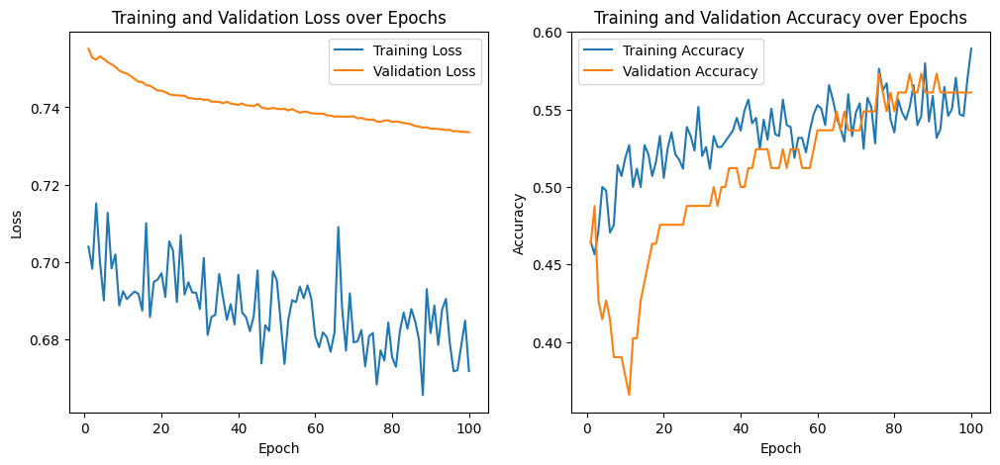

Test Loss: 0.6836, Accuracy: 56.10
Validation Accuracy: 56.10%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7000, Val Loss: 0.7577, Train Acc: 0.5153, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6955, Val Loss: 0.7556, Train Acc: 0.5070, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7005, Val Loss: 0.7523, Train Acc: 0.5129, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7024, Val Loss: 0.7513, Train Acc: 0.4977, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.6967, Val Loss: 0.7510, Train Acc: 0.4742, Val Acc: 0.5732
Epoch [6/100], Train Loss: 0.6921, Val Loss: 0.7509, Train Acc: 0.4906, Val Acc: 0.5610
Epoch [7/100], Train Loss: 0.7041, Val Loss: 0.7508, Train Acc: 0.4800, Val Acc: 0.5732
Epoch [8/100], Train Loss: 0.6957, Val Loss: 0.7509, Train Acc: 0.5235, Val Acc: 0.5610
Epoch [9/100], Train Loss: 0.7042, Val Loss: 0.7510, Train Acc: 0.5200,

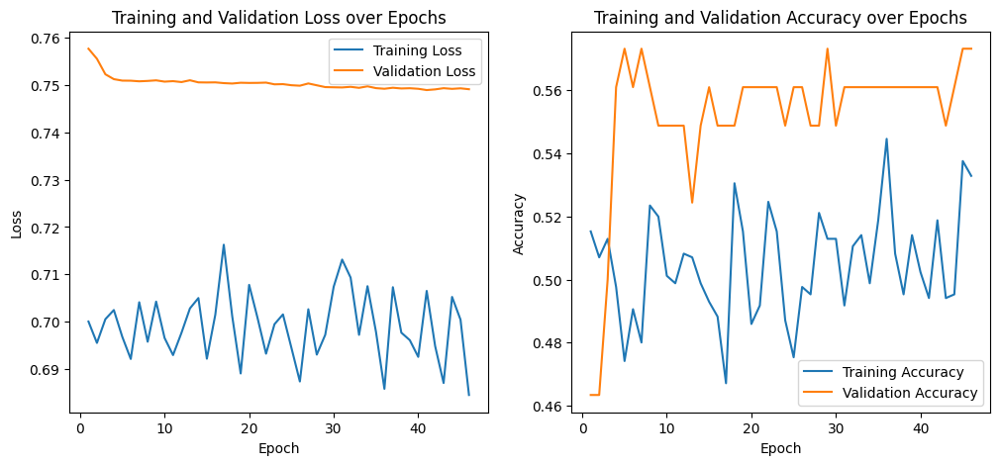

Test Loss: 0.6926, Accuracy: 57.32
Validation Accuracy: 57.32%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7061, Val Loss: 0.7537, Train Acc: 0.5059, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6972, Val Loss: 0.7564, Train Acc: 0.4965, Val Acc: 0.4512
Epoch [3/100], Train Loss: 0.7071, Val Loss: 0.7568, Train Acc: 0.4777, Val Acc: 0.4756
Epoch [4/100], Train Loss: 0.7037, Val Loss: 0.7552, Train Acc: 0.5000, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7079, Val Loss: 0.7541, Train Acc: 0.5176, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.6979, Val Loss: 0.7537, Train Acc: 0.5070, Val Acc: 0.4634
Epoch [7/100], Train Loss: 0.7078, Val Loss: 0.7538, Train Acc: 0.4871, Val Acc: 0.4634
Epoch [8/100], Train Loss: 0.7044, Val Loss: 0.7540, Train Acc: 0.5000, Val Acc: 0.4512
Epoch [9/100], Train Loss: 0.7037, Val Loss: 0.7538, Train Acc: 0.

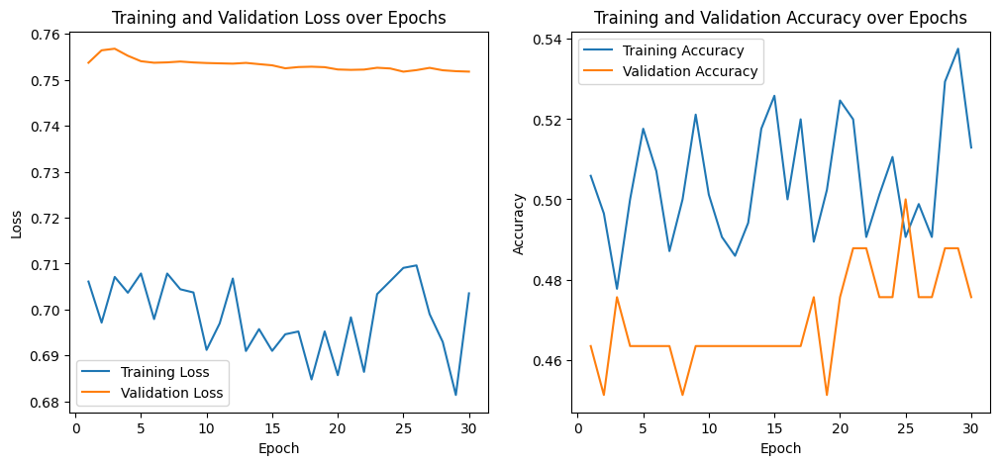

Test Loss: 0.6961, Accuracy: 47.56
Validation Accuracy: 47.56%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7275, Val Loss: 0.7610, Train Acc: 0.5059, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7066, Val Loss: 0.7585, Train Acc: 0.5188, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7170, Val Loss: 0.7546, Train Acc: 0.5364, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7081, Val Loss: 0.7600, Train Acc: 0.5176, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7004, Val Loss: 0.7607, Train Acc: 0.5200, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7507, Val Loss: 0.7577, Train Acc: 0.4883, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.6939, Val Loss: 0.7583, Train Acc: 0.5129, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7168, Val Loss: 0.7517, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.6938, Val Loss: 0.7549, Train Acc: 0.520

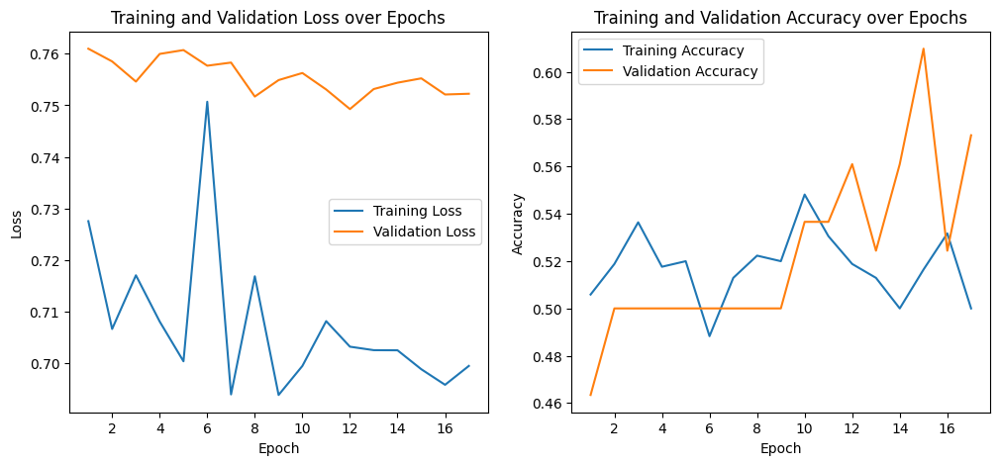

Test Loss: 0.6935, Accuracy: 57.32
Validation Accuracy: 57.32%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7229, Val Loss: 0.7486, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7299, Val Loss: 0.7440, Train Acc: 0.5188, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7502, Val Loss: 0.7423, Train Acc: 0.4988, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7202, Val Loss: 0.7424, Train Acc: 0.5188, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6917, Val Loss: 0.7446, Train Acc: 0.5387, Val Acc: 0.5122
Epoch [6/100], Train Loss: 0.7110, Val Loss: 0.7403, Train Acc: 0.5516, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.6990, Val Loss: 0.7422, Train Acc: 0.5434, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7005, Val Loss: 0.7425, Train Acc: 0.5153, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7163, Val Loss: 0.7423, Train Acc: 

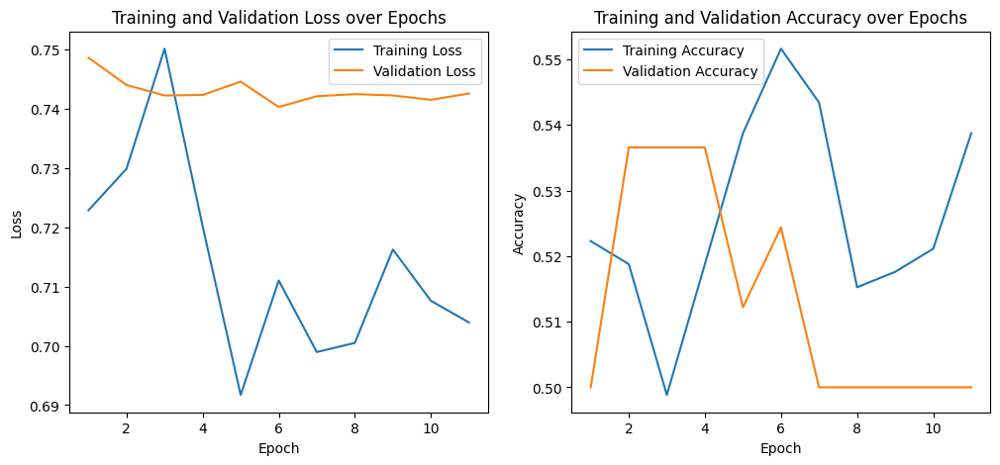

Test Loss: 0.6890, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7485, Val Loss: 0.7501, Train Acc: 0.5082, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7200, Val Loss: 0.7464, Train Acc: 0.5211, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7480, Val Loss: 0.7451, Train Acc: 0.5141, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7369, Val Loss: 0.7451, Train Acc: 0.5153, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7289, Val Loss: 0.7454, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7218, Val Loss: 0.7455, Train Acc: 0.5376, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7031, Val Loss: 0.7447, Train Acc: 0.5352, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7115, Val Loss: 0.7442, Train Acc: 0.5282, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7250, Val Loss: 0.7443, Train Acc: 0.5188

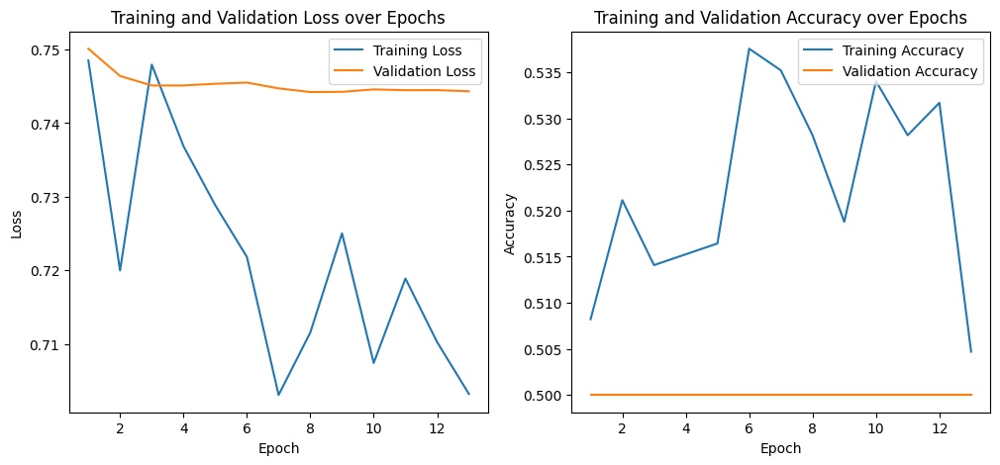

Test Loss: 0.6910, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7148, Val Loss: 0.7387, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6993, Val Loss: 0.7365, Train Acc: 0.5552, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7312, Val Loss: 0.7355, Train Acc: 0.5035, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7022, Val Loss: 0.7357, Train Acc: 0.5364, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7278, Val Loss: 0.7365, Train Acc: 0.5164, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7108, Val Loss: 0.7368, Train Acc: 0.5059, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7005, Val Loss: 0.7374, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7151, Val Loss: 0.7375, Train Acc: 0.4953, Val Acc: 0.5366
Early stopping triggered.


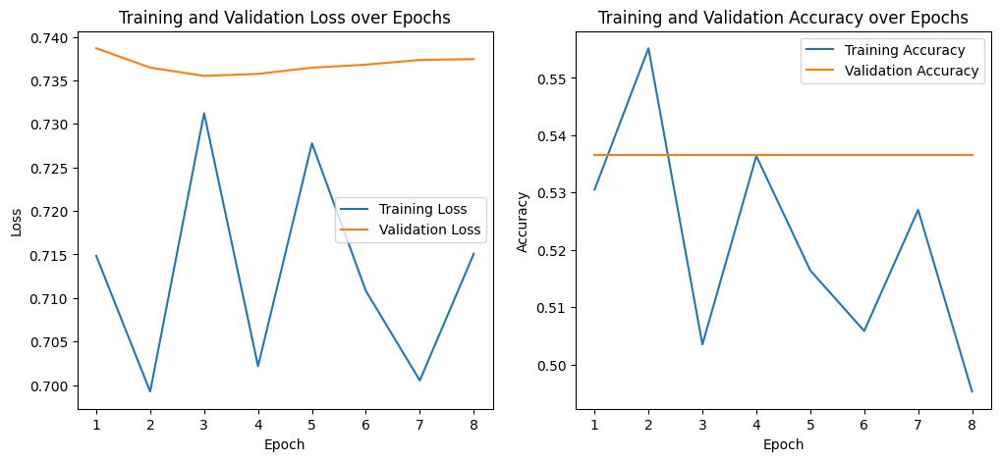

Test Loss: 0.6886, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7556, Val Loss: 0.7412, Train Acc: 0.4859, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7634, Val Loss: 0.7391, Train Acc: 0.4918, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7147, Val Loss: 0.7380, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7338, Val Loss: 0.7375, Train Acc: 0.5117, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7387, Val Loss: 0.7376, Train Acc: 0.4953, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7249, Val Loss: 0.7378, Train Acc: 0.4930, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7446, Val Loss: 0.7380, Train Acc: 0.5141, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7059, Val Loss: 0.7381, Train Acc: 0.5434, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7304, Val Loss: 0.7384, Train Acc: 0.5141

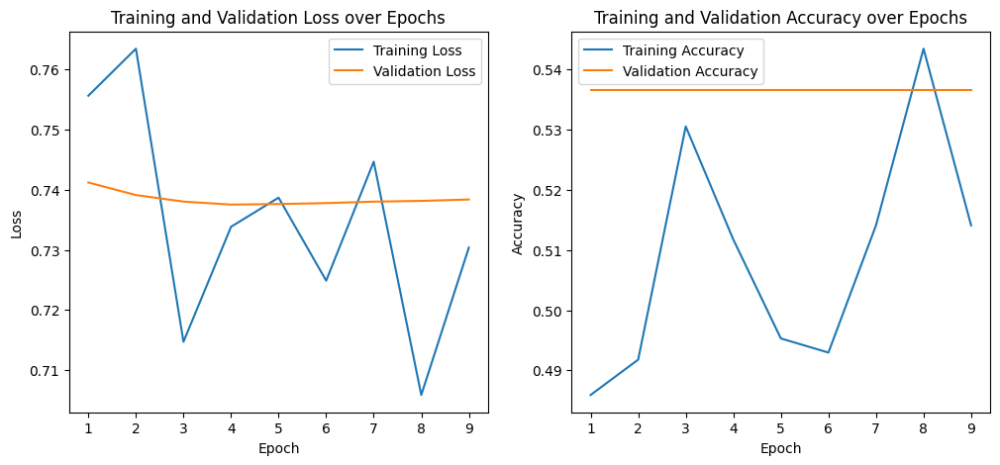

Test Loss: 0.6889, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7591, Val Loss: 0.7491, Train Acc: 0.4707, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7298, Val Loss: 0.7497, Train Acc: 0.4965, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7356, Val Loss: 0.7483, Train Acc: 0.4871, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7180, Val Loss: 0.7471, Train Acc: 0.5176, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7167, Val Loss: 0.7459, Train Acc: 0.5070, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7295, Val Loss: 0.7451, Train Acc: 0.5035, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7166, Val Loss: 0.7447, Train Acc: 0.5270, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7127, Val Loss: 0.7446, Train Acc: 0.5188, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7162, Val Loss: 0.7446, Train Acc: 0

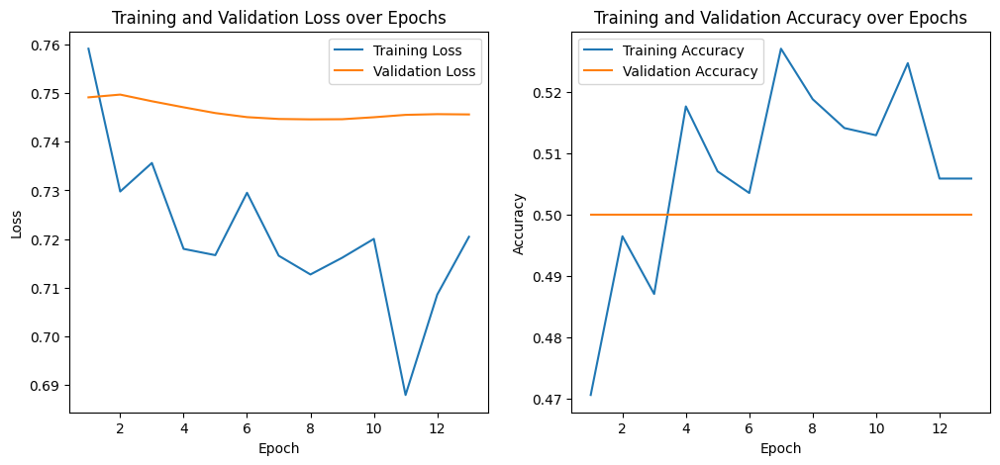

Test Loss: 0.6912, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7546, Val Loss: 0.7533, Train Acc: 0.4918, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7569, Val Loss: 0.7530, Train Acc: 0.4894, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7387, Val Loss: 0.7540, Train Acc: 0.4988, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7623, Val Loss: 0.7543, Train Acc: 0.4789, Val Acc: 0.4756
Epoch [5/100], Train Loss: 0.7604, Val Loss: 0.7543, Train Acc: 0.4988, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7334, Val Loss: 0.7542, Train Acc: 0.4859, Val Acc: 0.4756
Epoch [7/100], Train Loss: 0.7573, Val Loss: 0.7538, Train Acc: 0.4953, Val Acc: 0.4878
Early stopping triggered.


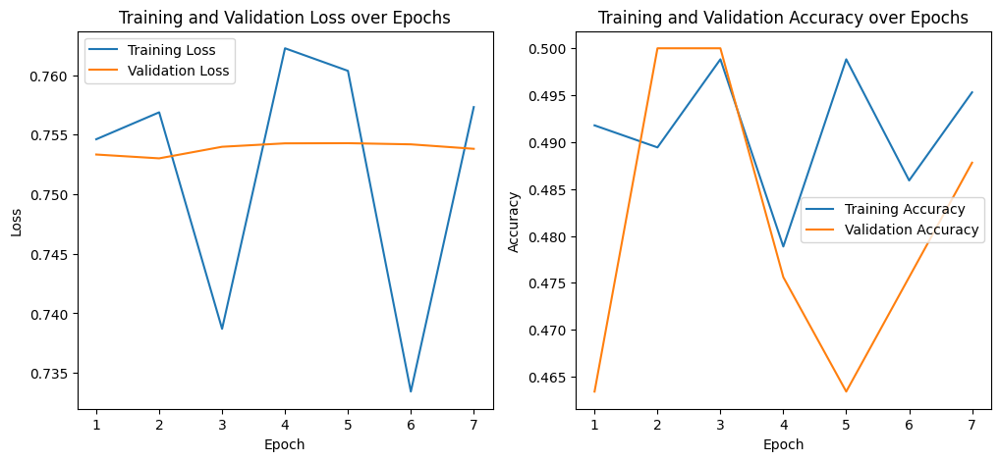

Test Loss: 0.6979, Accuracy: 48.78
Validation Accuracy: 48.78%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.8108, Val Loss: 0.7484, Train Acc: 0.4354, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.8198, Val Loss: 0.7508, Train Acc: 0.4636, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7730, Val Loss: 0.7522, Train Acc: 0.4883, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7803, Val Loss: 0.7523, Train Acc: 0.4695, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7849, Val Loss: 0.7510, Train Acc: 0.4742, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7788, Val Loss: 0.7495, Train Acc: 0.4765, Val Acc: 0.5000
Early stopping triggered.


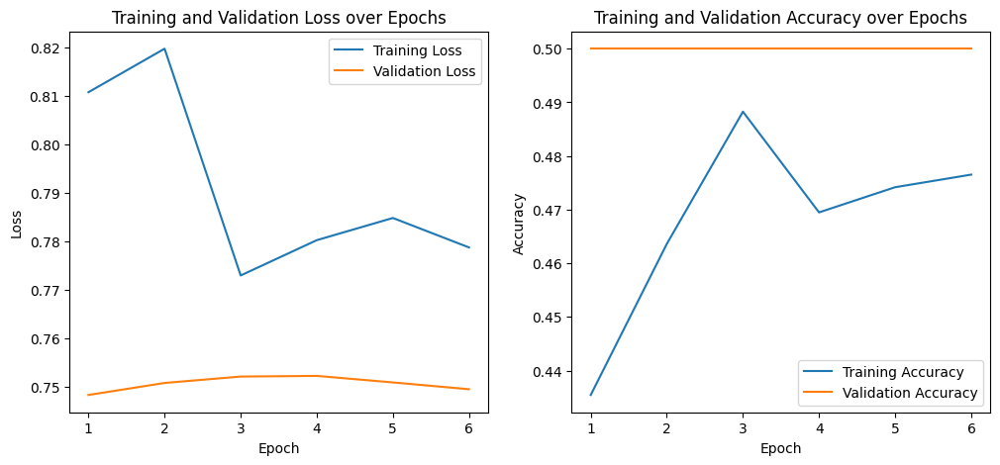

Test Loss: 0.6939, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7304, Val Loss: 0.7394, Train Acc: 0.5106, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7342, Val Loss: 0.7423, Train Acc: 0.5293, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7227, Val Loss: 0.7447, Train Acc: 0.5340, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7577, Val Loss: 0.7455, Train Acc: 0.4988, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7548, Val Loss: 0.7454, Train Acc: 0.5164, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7161, Val Loss: 0.7453, Train Acc: 0.5329, Val Acc: 0.5366
Early stopping triggered.


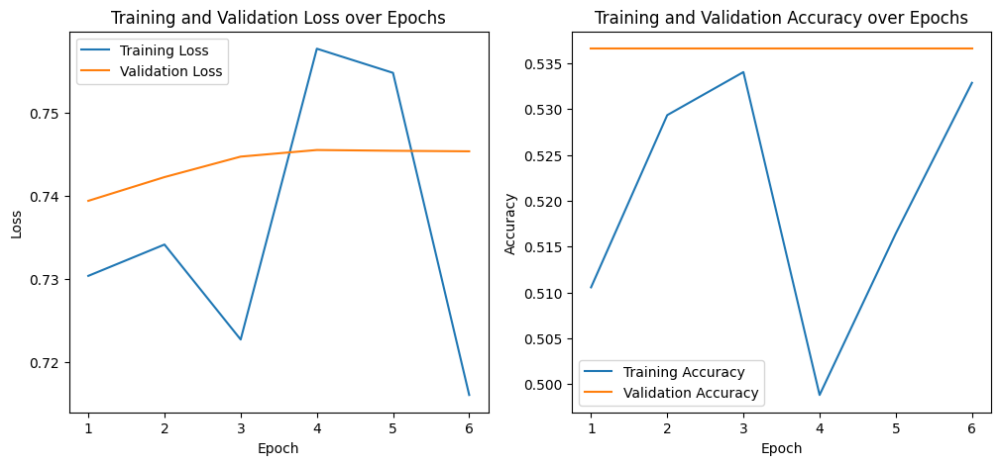

Test Loss: 0.6953, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7352, Val Loss: 0.7571, Train Acc: 0.5270, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7374, Val Loss: 0.7582, Train Acc: 0.4977, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7290, Val Loss: 0.7591, Train Acc: 0.5059, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7336, Val Loss: 0.7595, Train Acc: 0.4930, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7183, Val Loss: 0.7591, Train Acc: 0.5235, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7298, Val Loss: 0.7589, Train Acc: 0.4871, Val Acc: 0.4512
Early stopping triggered.


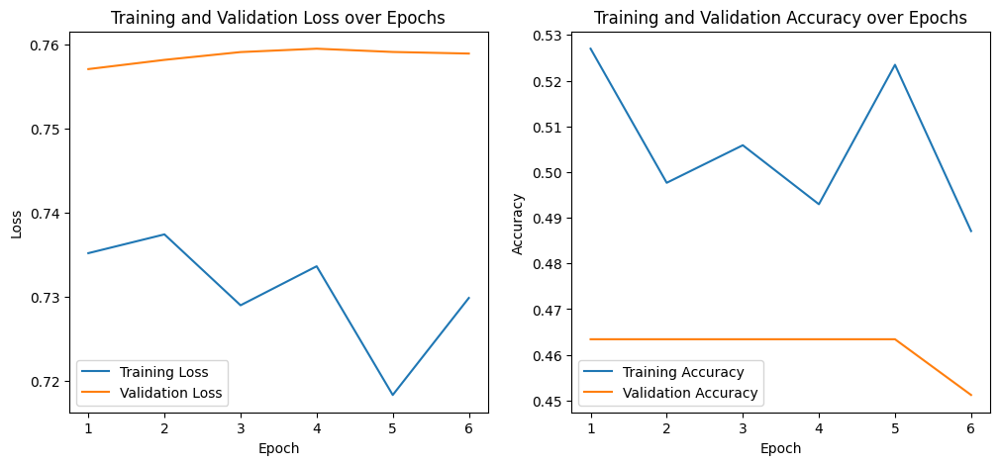

Test Loss: 0.6982, Accuracy: 45.12
Validation Accuracy: 45.12%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7553, Val Loss: 0.7505, Train Acc: 0.4871, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7337, Val Loss: 0.7522, Train Acc: 0.4765, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7648, Val Loss: 0.7535, Train Acc: 0.4988, Val Acc: 0.4878
Epoch [4/100], Train Loss: 0.7327, Val Loss: 0.7533, Train Acc: 0.5023, Val Acc: 0.4878
Epoch [5/100], Train Loss: 0.7325, Val Loss: 0.7531, Train Acc: 0.5059, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7237, Val Loss: 0.7532, Train Acc: 0.5047, Val Acc: 0.4634
Early stopping triggered.


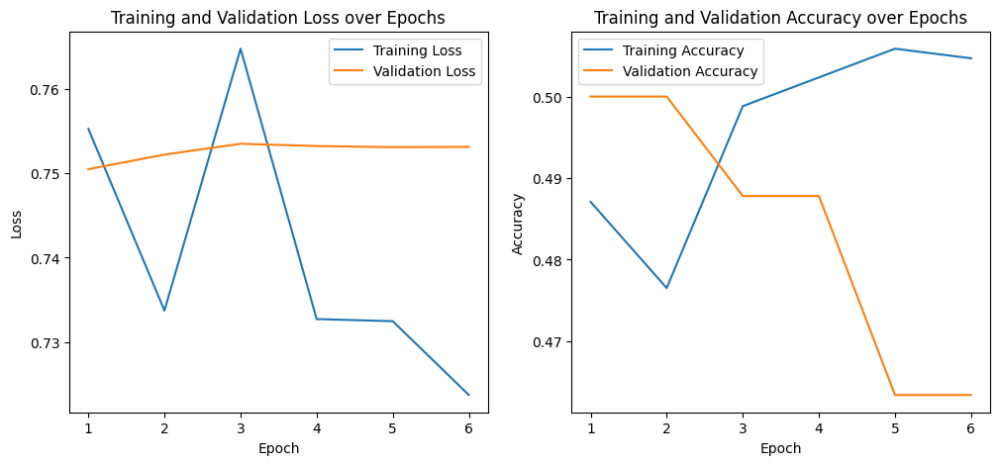

Test Loss: 0.6957, Accuracy: 46.34
Validation Accuracy: 46.34%
Training with parameters: {'batch_size': 64, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7507, Val Loss: 0.7550, Train Acc: 0.4894, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7536, Val Loss: 0.7569, Train Acc: 0.4930, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.7424, Val Loss: 0.7568, Train Acc: 0.4930, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7196, Val Loss: 0.7562, Train Acc: 0.4941, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.7411, Val Loss: 0.7560, Train Acc: 0.5153, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7548, Val Loss: 0.7562, Train Acc: 0.5059, Val Acc: 0.5366
Early stopping triggered.


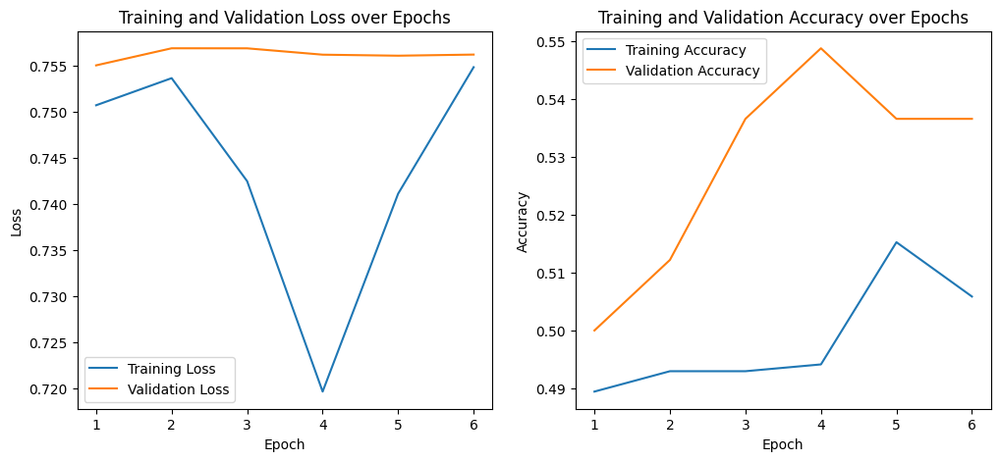

Test Loss: 0.6967, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6928, Val Loss: 0.6890, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6863, Val Loss: 0.6882, Train Acc: 0.5622, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6821, Val Loss: 0.6818, Train Acc: 0.5610, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6607, Val Loss: 0.6753, Train Acc: 0.6080, Val Acc: 0.6220
Epoch [5/100], Train Loss: 0.6616, Val Loss: 0.6739, Train Acc: 0.6127, Val Acc: 0.6463
Epoch [6/100], Train Loss: 0.6539, Val Loss: 0.6547, Train Acc: 0.6068, Val Acc: 0.6463
Epoch [7/100], Train Loss: 0.6413, Val Loss: 0.6574, Train Acc: 0.6080, Val Acc: 0.7073
Epoch [8/100], Train Loss: 0.6269, Val Loss: 0.6437, Train Acc: 0.6549, Val Acc: 0.6829
Epoch [9/100], Train Loss: 0.6066, Val Loss: 0.6484, Train Acc: 0.67

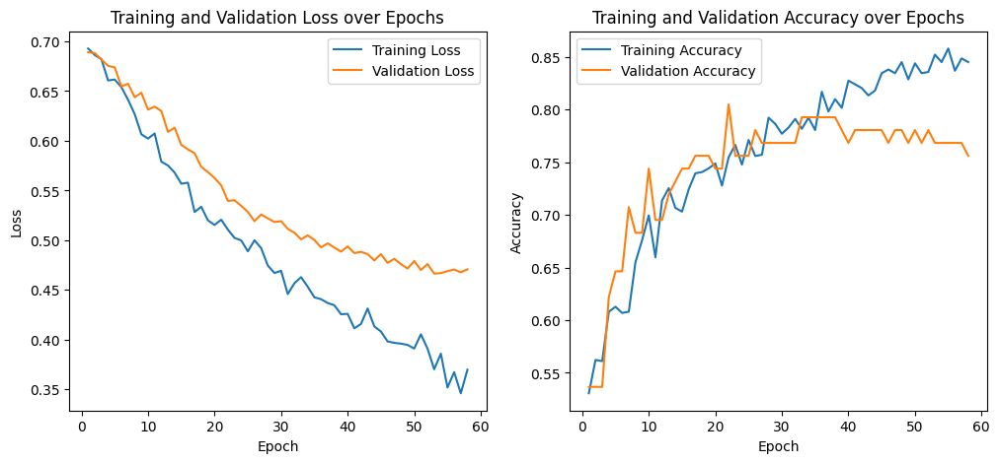

Test Loss: 0.4772, Accuracy: 75.61
Validation Accuracy: 75.61%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6966, Val Loss: 0.6882, Train Acc: 0.5446, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6790, Val Loss: 0.6896, Train Acc: 0.5528, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6756, Val Loss: 0.6800, Train Acc: 0.5704, Val Acc: 0.5854
Epoch [4/100], Train Loss: 0.6628, Val Loss: 0.6701, Train Acc: 0.5951, Val Acc: 0.6341
Epoch [5/100], Train Loss: 0.6603, Val Loss: 0.6649, Train Acc: 0.5998, Val Acc: 0.7073
Epoch [6/100], Train Loss: 0.6415, Val Loss: 0.6575, Train Acc: 0.6373, Val Acc: 0.7073
Epoch [7/100], Train Loss: 0.6346, Val Loss: 0.6495, Train Acc: 0.6350, Val Acc: 0.7195
Epoch [8/100], Train Loss: 0.6231, Val Loss: 0.6488, Train Acc: 0.6890, Val Acc: 0.7073
Epoch [9/100], Train Loss: 0.6063, Val Loss: 0.6261, Train Acc:

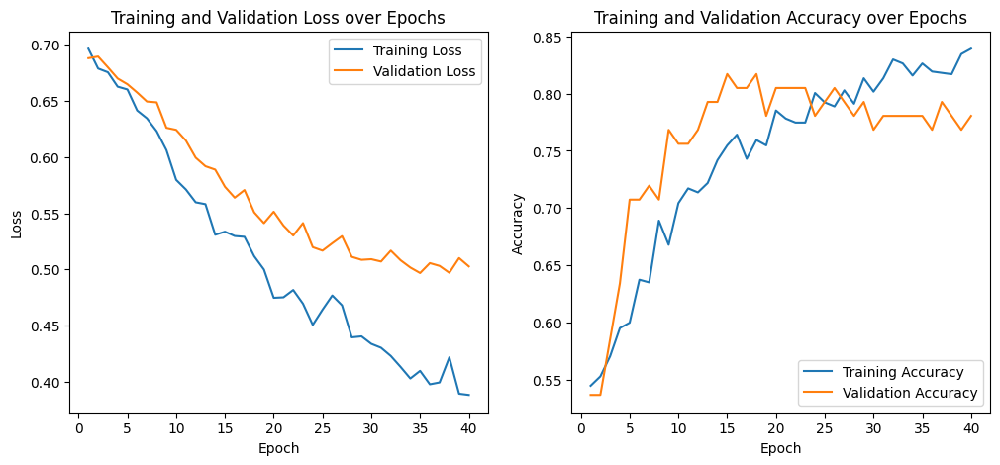

Test Loss: 0.4891, Accuracy: 78.05
Validation Accuracy: 78.05%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7000, Val Loss: 0.6885, Train Acc: 0.4883, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6955, Val Loss: 0.6882, Train Acc: 0.5035, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.6931, Val Loss: 0.6892, Train Acc: 0.4941, Val Acc: 0.5610
Epoch [4/100], Train Loss: 0.6866, Val Loss: 0.6880, Train Acc: 0.5376, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6920, Val Loss: 0.6866, Train Acc: 0.5317, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6872, Val Loss: 0.6858, Train Acc: 0.5411, Val Acc: 0.5488
Epoch [7/100], Train Loss: 0.6859, Val Loss: 0.6849, Train Acc: 0.5340, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6888, Val Loss: 0.6845, Train Acc: 0.5528, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6874, Val Loss: 0.6841, Train Acc: 0.548

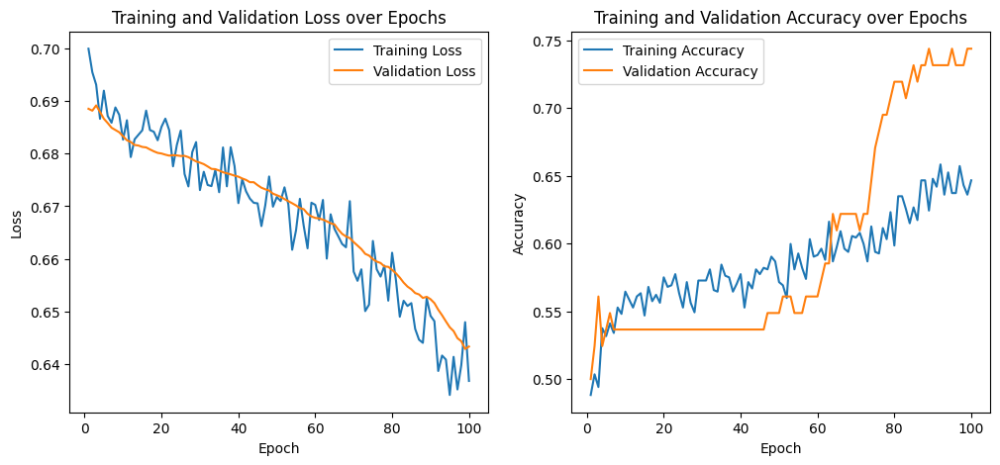

Test Loss: 0.6486, Accuracy: 74.39
Validation Accuracy: 74.39%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7038, Val Loss: 0.6962, Train Acc: 0.4601, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6976, Val Loss: 0.6952, Train Acc: 0.5023, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7042, Val Loss: 0.6927, Train Acc: 0.4765, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.6956, Val Loss: 0.6904, Train Acc: 0.5176, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.6945, Val Loss: 0.6892, Train Acc: 0.5000, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6867, Val Loss: 0.6880, Train Acc: 0.5446, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.6866, Val Loss: 0.6868, Train Acc: 0.5387, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6882, Val Loss: 0.6861, Train Acc: 0.5458, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6868, Val Loss: 0.6851, Train Acc: 

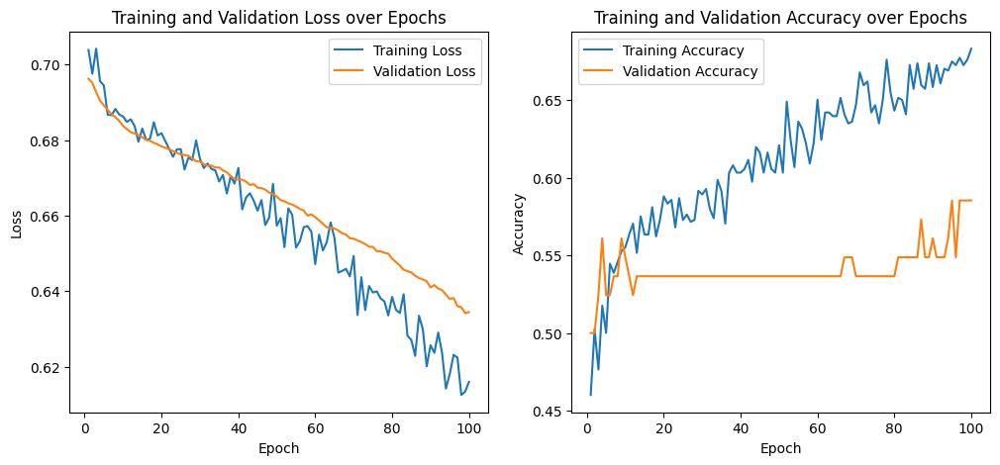

Test Loss: 0.6494, Accuracy: 58.54
Validation Accuracy: 58.54%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6920, Val Loss: 0.6920, Train Acc: 0.5516, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6829, Val Loss: 0.6913, Train Acc: 0.5540, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6895, Val Loss: 0.6890, Train Acc: 0.5387, Val Acc: 0.5610
Epoch [4/100], Train Loss: 0.6812, Val Loss: 0.6864, Train Acc: 0.5646, Val Acc: 0.5854
Epoch [5/100], Train Loss: 0.6754, Val Loss: 0.6847, Train Acc: 0.5681, Val Acc: 0.5732
Epoch [6/100], Train Loss: 0.6715, Val Loss: 0.6830, Train Acc: 0.5681, Val Acc: 0.5488
Epoch [7/100], Train Loss: 0.6692, Val Loss: 0.6817, Train Acc: 0.5786, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6870, Val Loss: 0.6807, Train Acc: 0.5728, Val Acc: 0.5488
Epoch [9/100], Train Loss: 0.6725, Val Loss: 0.6812, Train Acc: 0.566

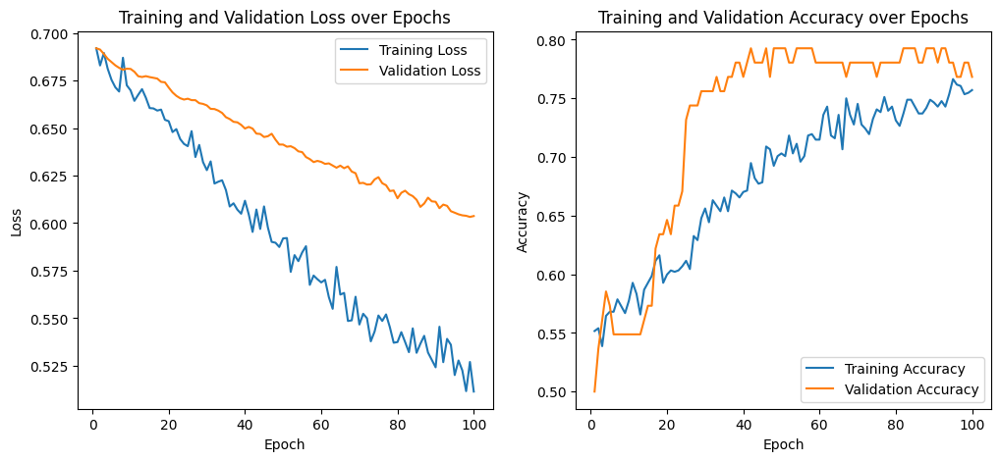

Test Loss: 0.5963, Accuracy: 76.83
Validation Accuracy: 76.83%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6907, Val Loss: 0.6909, Train Acc: 0.5423, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6960, Val Loss: 0.6887, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6882, Val Loss: 0.6875, Train Acc: 0.5505, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6869, Val Loss: 0.6872, Train Acc: 0.5528, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6886, Val Loss: 0.6860, Train Acc: 0.5387, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6851, Val Loss: 0.6848, Train Acc: 0.5692, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6803, Val Loss: 0.6836, Train Acc: 0.5681, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6789, Val Loss: 0.6834, Train Acc: 0.5646, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6806, Val Loss: 0.6834, Train Acc: 

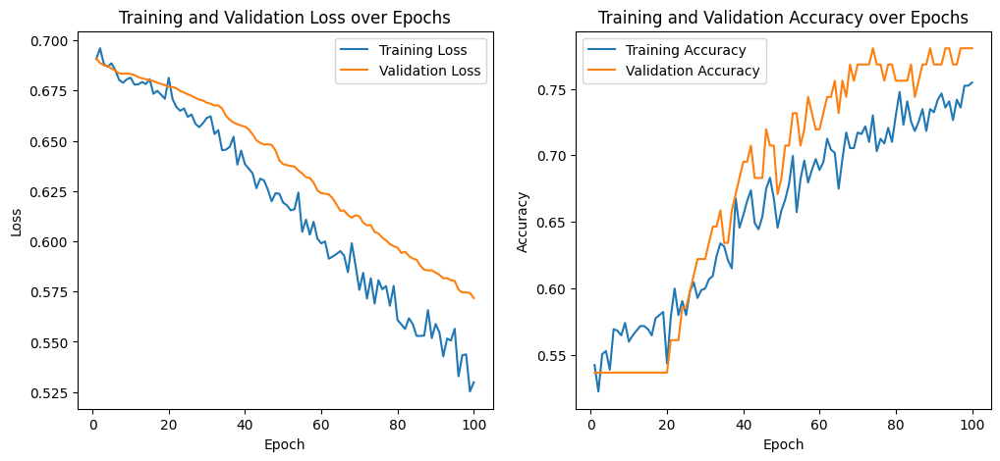

Test Loss: 0.5700, Accuracy: 78.05
Validation Accuracy: 78.05%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7128, Val Loss: 0.7000, Train Acc: 0.4507, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7117, Val Loss: 0.7024, Train Acc: 0.4648, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.7084, Val Loss: 0.7031, Train Acc: 0.4765, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.7082, Val Loss: 0.7030, Train Acc: 0.4554, Val Acc: 0.5122
Epoch [5/100], Train Loss: 0.7063, Val Loss: 0.7025, Train Acc: 0.4671, Val Acc: 0.5122
Epoch [6/100], Train Loss: 0.7030, Val Loss: 0.7021, Train Acc: 0.4777, Val Acc: 0.5122
Early stopping triggered.


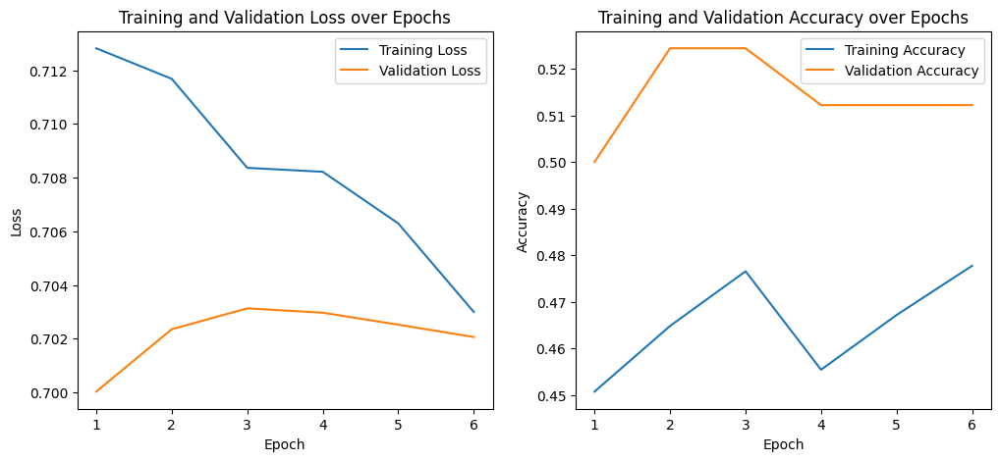

Test Loss: 0.6946, Accuracy: 51.22
Validation Accuracy: 51.22%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7069, Val Loss: 0.6993, Train Acc: 0.4577, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7051, Val Loss: 0.6994, Train Acc: 0.4531, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7041, Val Loss: 0.6982, Train Acc: 0.4624, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7050, Val Loss: 0.6983, Train Acc: 0.4401, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7074, Val Loss: 0.6984, Train Acc: 0.4636, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7049, Val Loss: 0.6983, Train Acc: 0.4531, Val Acc: 0.4634
Epoch [7/100], Train Loss: 0.7018, Val Loss: 0.6982, Train Acc: 0.4777, Val Acc: 0.4634
Epoch [8/100], Train Loss: 0.7045, Val Loss: 0.6978, Train Acc: 0.4354, Val Acc: 0.4634
Epoch [9/100], Train Loss: 0.7031, Val Loss: 0.6976, Train Acc: 0

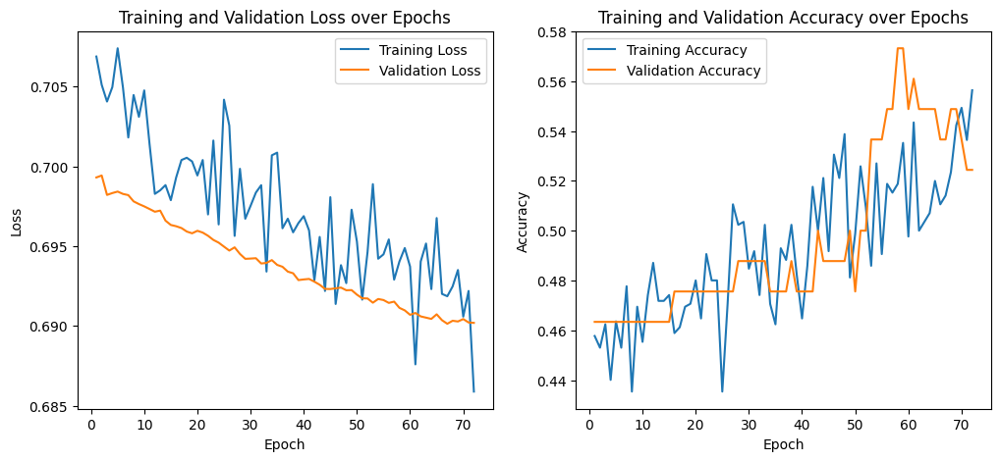

Test Loss: 0.6904, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6980, Val Loss: 0.6999, Train Acc: 0.4871, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6939, Val Loss: 0.6990, Train Acc: 0.5094, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.6979, Val Loss: 0.6996, Train Acc: 0.4883, Val Acc: 0.4878
Epoch [4/100], Train Loss: 0.6951, Val Loss: 0.6989, Train Acc: 0.4871, Val Acc: 0.4878
Epoch [5/100], Train Loss: 0.6961, Val Loss: 0.6980, Train Acc: 0.4812, Val Acc: 0.4756
Epoch [6/100], Train Loss: 0.6952, Val Loss: 0.6975, Train Acc: 0.5141, Val Acc: 0.4756
Epoch [7/100], Train Loss: 0.6917, Val Loss: 0.6968, Train Acc: 0.5129, Val Acc: 0.4756
Epoch [8/100], Train Loss: 0.6884, Val Loss: 0.6963, Train Acc: 0.5434, Val Acc: 0.4756
Epoch [9/100], Train Loss: 0.6932, Val Loss: 0.6958, Train Acc: 0.521

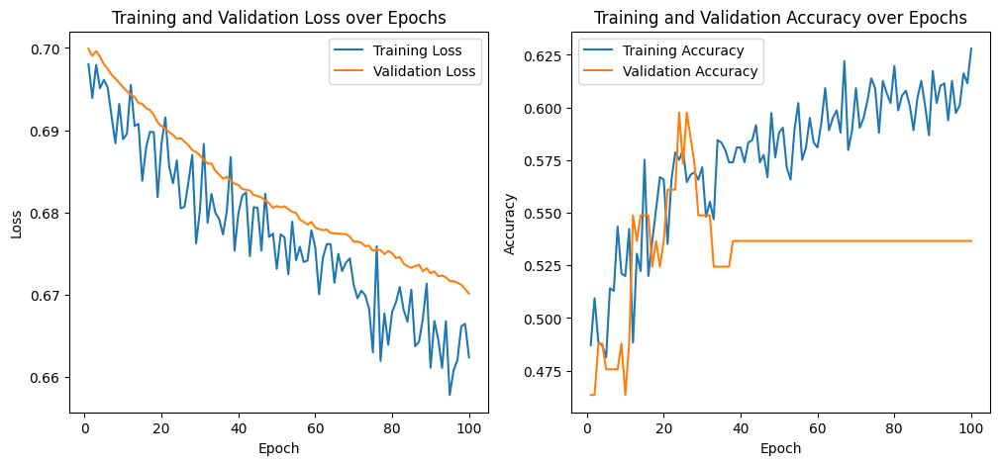

Test Loss: 0.6757, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7058, Val Loss: 0.6976, Train Acc: 0.4800, Val Acc: 0.5122
Epoch [2/100], Train Loss: 0.7026, Val Loss: 0.6990, Train Acc: 0.4695, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7083, Val Loss: 0.6997, Train Acc: 0.4636, Val Acc: 0.4756
Epoch [4/100], Train Loss: 0.7054, Val Loss: 0.6991, Train Acc: 0.4683, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7025, Val Loss: 0.6982, Train Acc: 0.4965, Val Acc: 0.5122
Epoch [6/100], Train Loss: 0.6997, Val Loss: 0.6974, Train Acc: 0.5000, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.6983, Val Loss: 0.6970, Train Acc: 0.4941, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.6976, Val Loss: 0.6961, Train Acc: 0.4883, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.6993, Val Loss: 0.6957, Train Acc: 

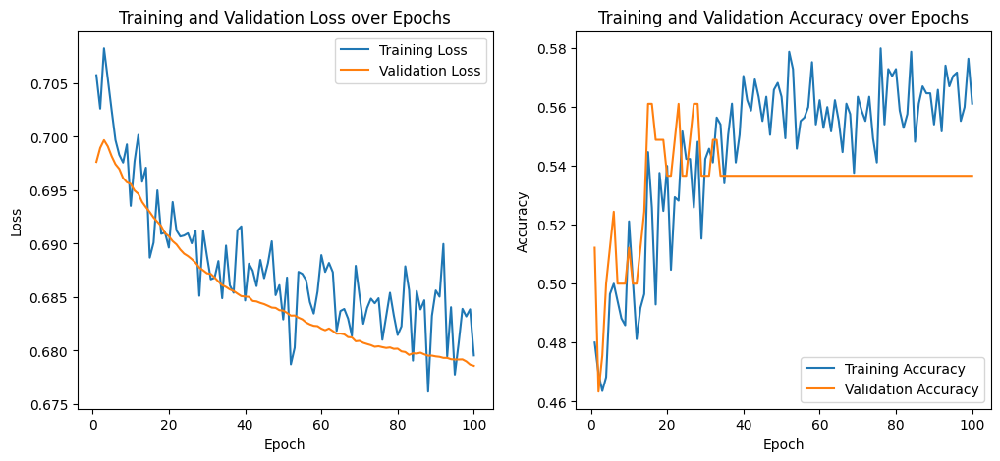

Test Loss: 0.6834, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6911, Val Loss: 0.6899, Train Acc: 0.5211, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6940, Val Loss: 0.6889, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6947, Val Loss: 0.6873, Train Acc: 0.5153, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.6943, Val Loss: 0.6874, Train Acc: 0.5200, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.6944, Val Loss: 0.6873, Train Acc: 0.5129, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.6916, Val Loss: 0.6869, Train Acc: 0.5129, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.6997, Val Loss: 0.6871, Train Acc: 0.5235, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.6891, Val Loss: 0.6875, Train Acc: 0.5387, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.6938, Val Loss: 0.6873, Train Acc: 0.5200

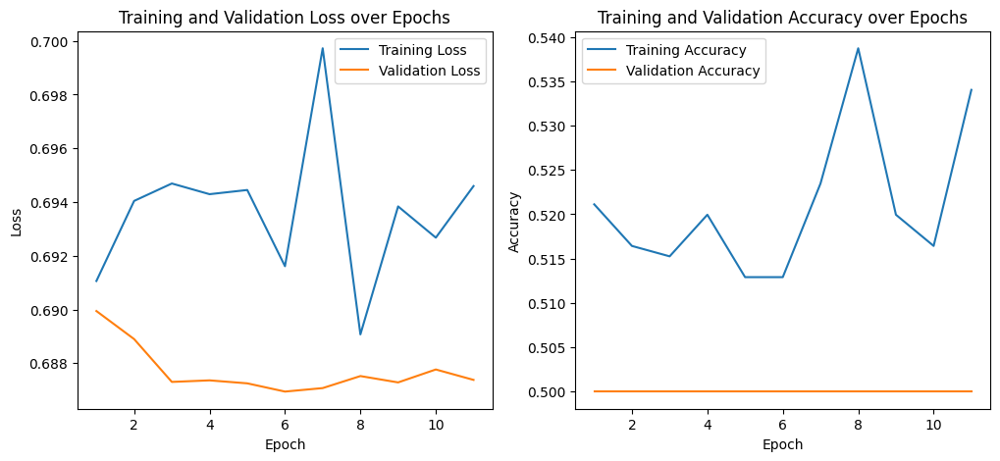

Test Loss: 0.6934, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7092, Val Loss: 0.7014, Train Acc: 0.4800, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7062, Val Loss: 0.6999, Train Acc: 0.4718, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7065, Val Loss: 0.6983, Train Acc: 0.4812, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7042, Val Loss: 0.6981, Train Acc: 0.4765, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7043, Val Loss: 0.6978, Train Acc: 0.4789, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7097, Val Loss: 0.6977, Train Acc: 0.4812, Val Acc: 0.4634
Epoch [7/100], Train Loss: 0.7081, Val Loss: 0.6977, Train Acc: 0.4484, Val Acc: 0.4634
Epoch [8/100], Train Loss: 0.7024, Val Loss: 0.6975, Train Acc: 0.4918, Val Acc: 0.4634
Epoch [9/100], Train Loss: 0.7035, Val Loss: 0.6977, Train Acc: 0

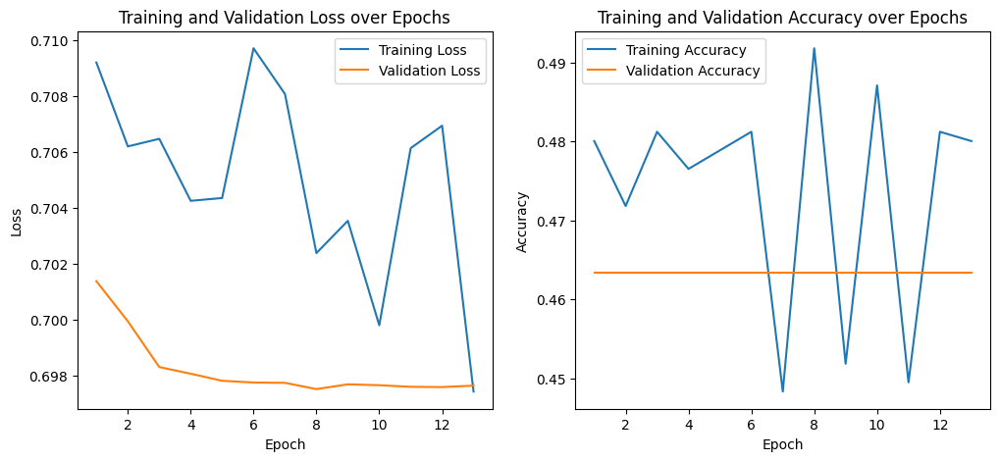

Test Loss: 0.6940, Accuracy: 46.34
Validation Accuracy: 46.34%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7072, Val Loss: 0.6864, Train Acc: 0.5047, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6955, Val Loss: 0.6842, Train Acc: 0.5516, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6919, Val Loss: 0.6842, Train Acc: 0.5458, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7035, Val Loss: 0.6846, Train Acc: 0.5282, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6935, Val Loss: 0.6833, Train Acc: 0.5610, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6986, Val Loss: 0.6838, Train Acc: 0.5411, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6988, Val Loss: 0.6841, Train Acc: 0.5446, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6845, Val Loss: 0.6848, Train Acc: 0.5540, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6957, Val Loss: 0.6838, Train Acc: 0.53

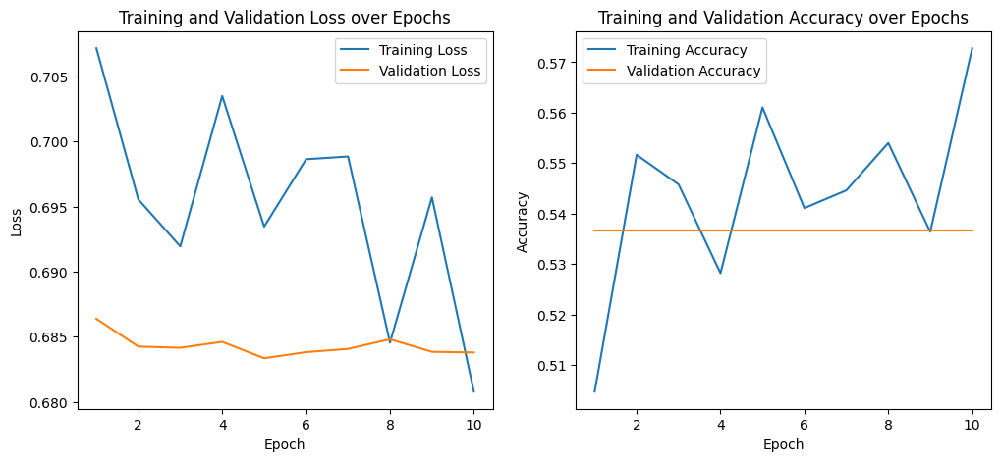

Test Loss: 0.6882, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7076, Val Loss: 0.6884, Train Acc: 0.5411, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7152, Val Loss: 0.6895, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7145, Val Loss: 0.6862, Train Acc: 0.5117, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7017, Val Loss: 0.6839, Train Acc: 0.5516, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7029, Val Loss: 0.6843, Train Acc: 0.5376, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7078, Val Loss: 0.6841, Train Acc: 0.5329, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6990, Val Loss: 0.6846, Train Acc: 0.5293, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6914, Val Loss: 0.6833, Train Acc: 0.5446, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7002, Val Loss: 0.6824, Train Acc:

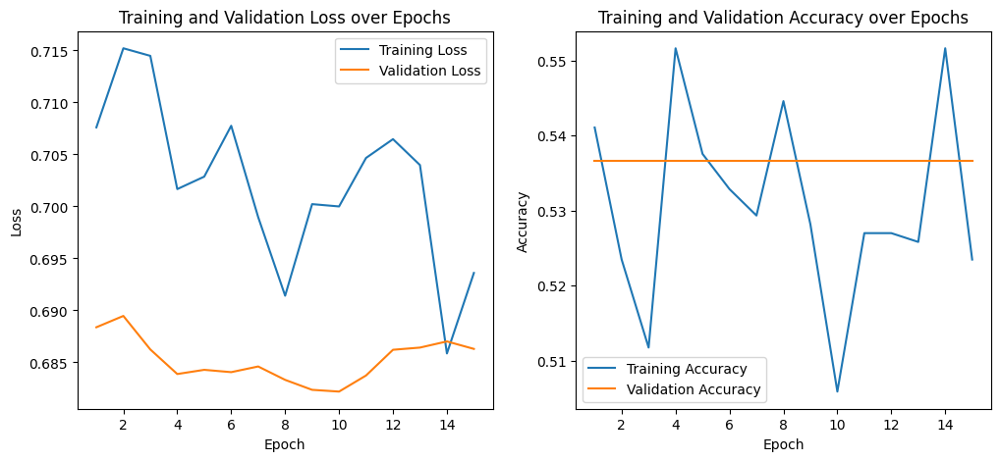

Test Loss: 0.6904, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6991, Val Loss: 0.6954, Train Acc: 0.5188, Val Acc: 0.5122
Epoch [2/100], Train Loss: 0.7143, Val Loss: 0.6941, Train Acc: 0.5070, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7106, Val Loss: 0.6936, Train Acc: 0.5164, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7006, Val Loss: 0.6931, Train Acc: 0.4988, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.6979, Val Loss: 0.6928, Train Acc: 0.5399, Val Acc: 0.5610
Epoch [6/100], Train Loss: 0.6958, Val Loss: 0.6926, Train Acc: 0.5458, Val Acc: 0.5610
Epoch [7/100], Train Loss: 0.7021, Val Loss: 0.6925, Train Acc: 0.5246, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.7037, Val Loss: 0.6923, Train Acc: 0.4965, Val Acc: 0.5488
Epoch [9/100], Train Loss: 0.6953, Val Loss: 0.6921, Train Acc: 0.534

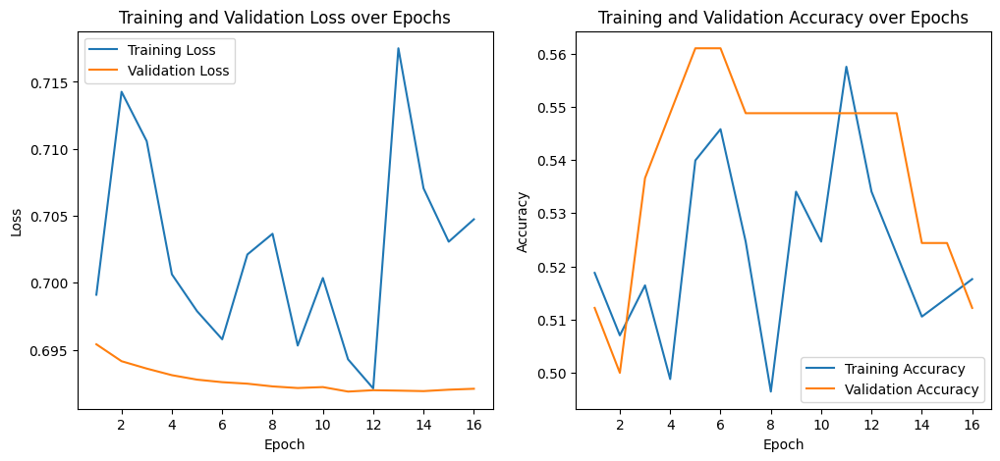

Test Loss: 0.6920, Accuracy: 51.22
Validation Accuracy: 51.22%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7196, Val Loss: 0.6908, Train Acc: 0.5117, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7144, Val Loss: 0.6916, Train Acc: 0.5200, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.7017, Val Loss: 0.6911, Train Acc: 0.5211, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.6994, Val Loss: 0.6904, Train Acc: 0.5270, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6952, Val Loss: 0.6898, Train Acc: 0.5423, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7010, Val Loss: 0.6893, Train Acc: 0.5200, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6982, Val Loss: 0.6884, Train Acc: 0.5012, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6982, Val Loss: 0.6880, Train Acc: 0.5376, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7021, Val Loss: 0.6879, Train Acc: 

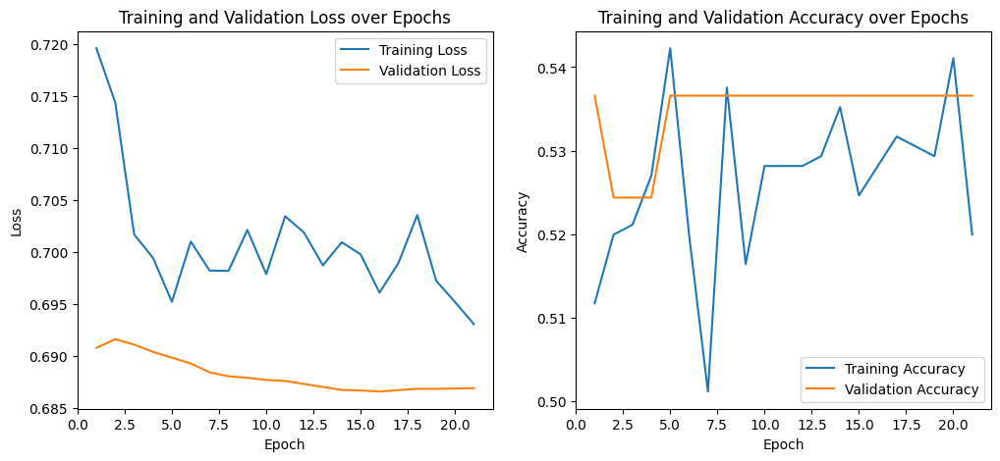

Test Loss: 0.6908, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7065, Val Loss: 0.6935, Train Acc: 0.5235, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7093, Val Loss: 0.6908, Train Acc: 0.5188, Val Acc: 0.5854
Epoch [3/100], Train Loss: 0.7149, Val Loss: 0.6882, Train Acc: 0.4918, Val Acc: 0.6463
Epoch [4/100], Train Loss: 0.7038, Val Loss: 0.6871, Train Acc: 0.5188, Val Acc: 0.6341
Epoch [5/100], Train Loss: 0.7006, Val Loss: 0.6866, Train Acc: 0.5235, Val Acc: 0.6220
Epoch [6/100], Train Loss: 0.7062, Val Loss: 0.6866, Train Acc: 0.5211, Val Acc: 0.5854
Epoch [7/100], Train Loss: 0.6971, Val Loss: 0.6865, Train Acc: 0.5329, Val Acc: 0.5854
Epoch [8/100], Train Loss: 0.7021, Val Loss: 0.6865, Train Acc: 0.5082, Val Acc: 0.5854
Epoch [9/100], Train Loss: 0.6897, Val Loss: 0.6864, Train Acc: 0.534

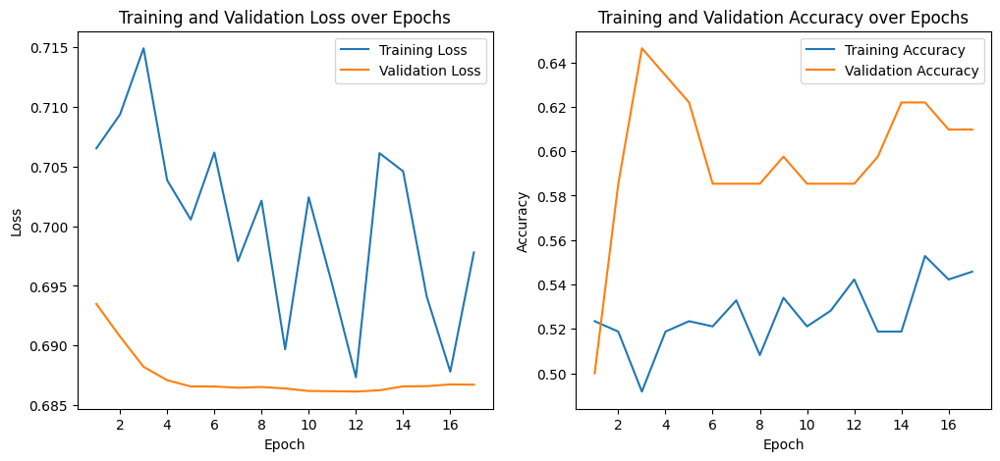

Test Loss: 0.6881, Accuracy: 60.98
Validation Accuracy: 60.98%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7242, Val Loss: 0.6921, Train Acc: 0.4800, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7109, Val Loss: 0.6913, Train Acc: 0.5117, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7061, Val Loss: 0.6905, Train Acc: 0.5059, Val Acc: 0.5488
Epoch [4/100], Train Loss: 0.7021, Val Loss: 0.6893, Train Acc: 0.5059, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.7073, Val Loss: 0.6883, Train Acc: 0.4953, Val Acc: 0.5488
Epoch [6/100], Train Loss: 0.6998, Val Loss: 0.6876, Train Acc: 0.5340, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7131, Val Loss: 0.6872, Train Acc: 0.5082, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6902, Val Loss: 0.6870, Train Acc: 0.5376, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6981, Val Loss: 0.6867, Train Acc: 

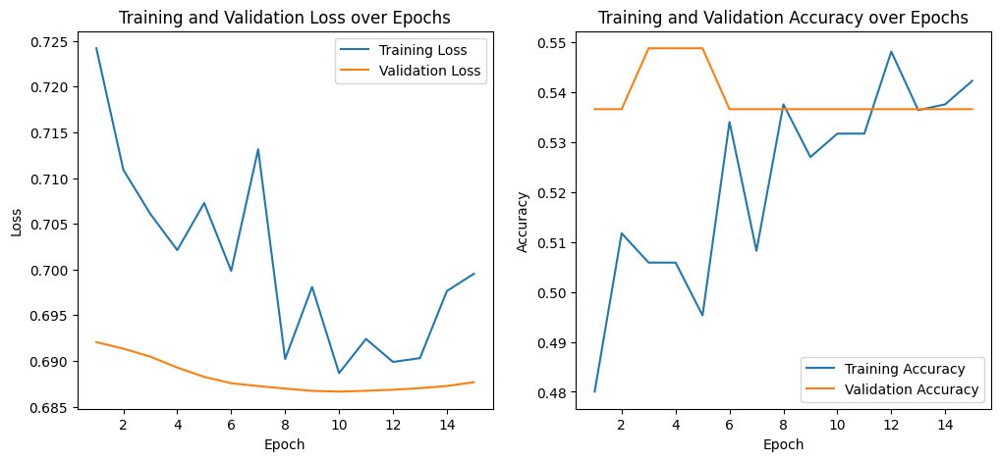

Test Loss: 0.6905, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7272, Val Loss: 0.6987, Train Acc: 0.4707, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7183, Val Loss: 0.6990, Train Acc: 0.5047, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7238, Val Loss: 0.6992, Train Acc: 0.4707, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7177, Val Loss: 0.6995, Train Acc: 0.5059, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7275, Val Loss: 0.6994, Train Acc: 0.4894, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7268, Val Loss: 0.6993, Train Acc: 0.4789, Val Acc: 0.5000
Early stopping triggered.


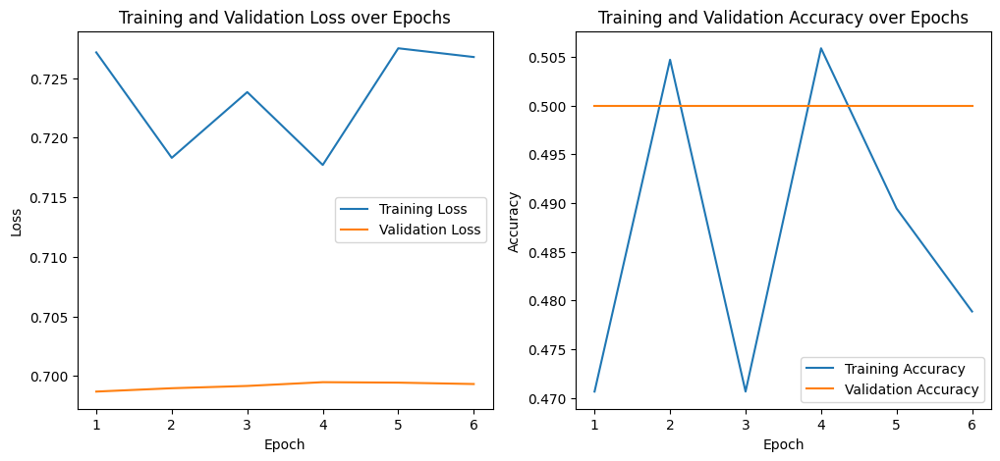

Test Loss: 0.6952, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7323, Val Loss: 0.6944, Train Acc: 0.4789, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7133, Val Loss: 0.6952, Train Acc: 0.4824, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7165, Val Loss: 0.6954, Train Acc: 0.4965, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7119, Val Loss: 0.6952, Train Acc: 0.5106, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7252, Val Loss: 0.6950, Train Acc: 0.4718, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7157, Val Loss: 0.6949, Train Acc: 0.4977, Val Acc: 0.5000
Early stopping triggered.


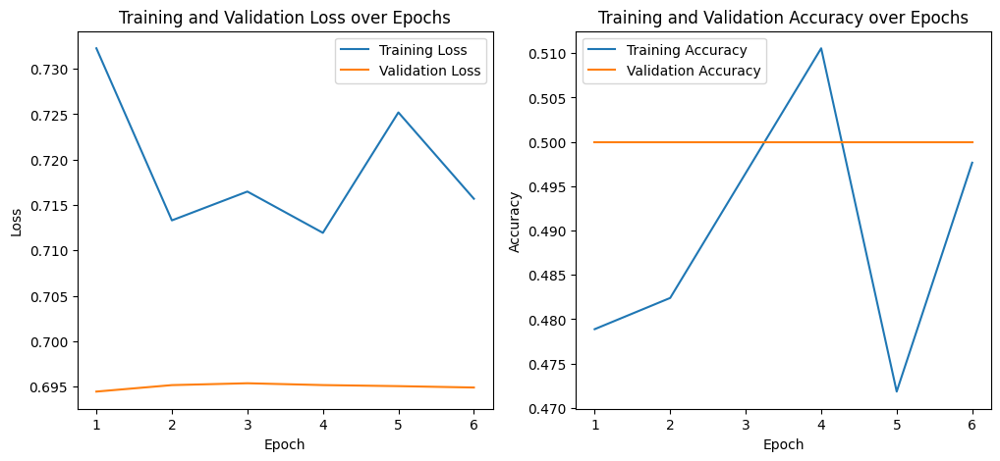

Test Loss: 0.6945, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7147, Val Loss: 0.6901, Train Acc: 0.5141, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6862, Val Loss: 0.6887, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7196, Val Loss: 0.6873, Train Acc: 0.5129, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7109, Val Loss: 0.6868, Train Acc: 0.5023, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7037, Val Loss: 0.6866, Train Acc: 0.5446, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7018, Val Loss: 0.6866, Train Acc: 0.5364, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7069, Val Loss: 0.6866, Train Acc: 0.5176, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7190, Val Loss: 0.6865, Train Acc: 0.5188, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7158, Val Loss: 0.6866, Train Acc: 0.518

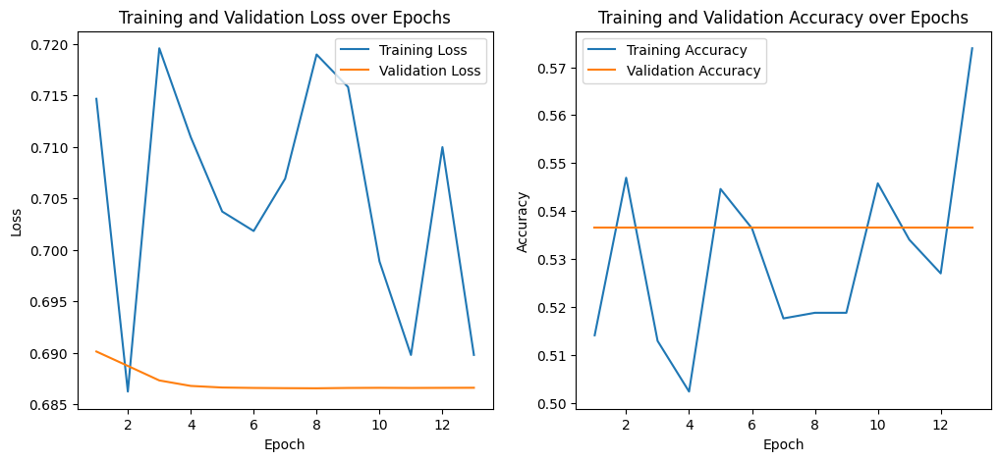

Test Loss: 0.6903, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7222, Val Loss: 0.6890, Train Acc: 0.5106, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7202, Val Loss: 0.6892, Train Acc: 0.4988, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6967, Val Loss: 0.6888, Train Acc: 0.5458, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7248, Val Loss: 0.6885, Train Acc: 0.4859, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7079, Val Loss: 0.6883, Train Acc: 0.5211, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7139, Val Loss: 0.6883, Train Acc: 0.5188, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7038, Val Loss: 0.6882, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7120, Val Loss: 0.6881, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7238, Val Loss: 0.6881, Train Acc: 

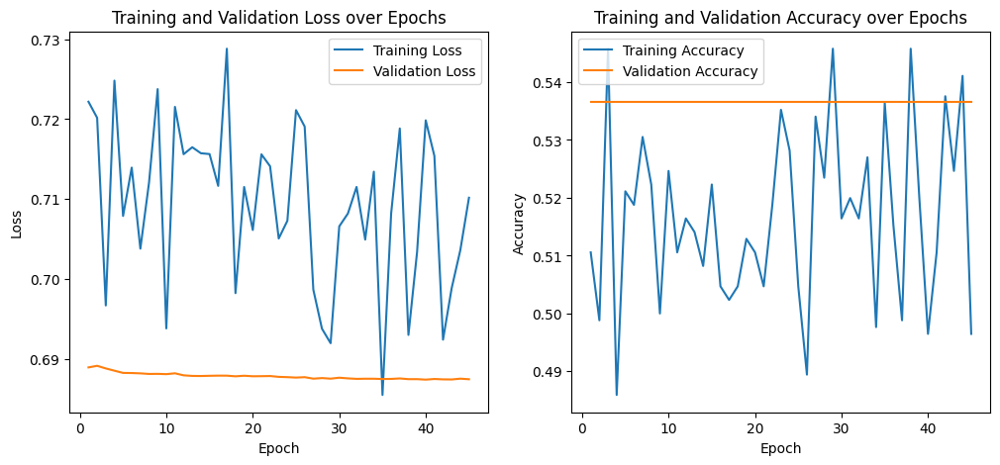

Test Loss: 0.6922, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7127, Val Loss: 0.6942, Train Acc: 0.5211, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6993, Val Loss: 0.6935, Train Acc: 0.5446, Val Acc: 0.4756
Epoch [3/100], Train Loss: 0.7046, Val Loss: 0.6938, Train Acc: 0.5235, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.6993, Val Loss: 0.6941, Train Acc: 0.5223, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.7279, Val Loss: 0.6941, Train Acc: 0.5000, Val Acc: 0.5122
Epoch [6/100], Train Loss: 0.7061, Val Loss: 0.6941, Train Acc: 0.5246, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.7127, Val Loss: 0.6941, Train Acc: 0.5141, Val Acc: 0.5244
Early stopping triggered.


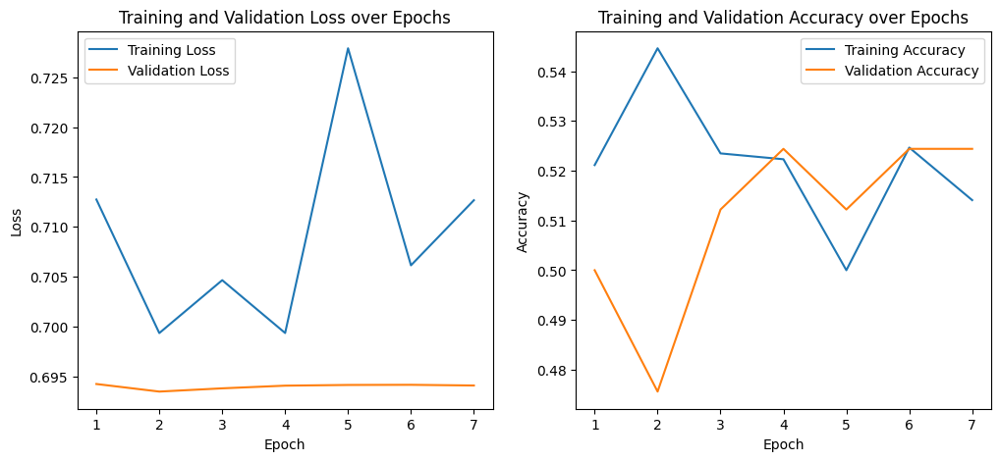

Test Loss: 0.6941, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 64, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7105, Val Loss: 0.6905, Train Acc: 0.4930, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7197, Val Loss: 0.6904, Train Acc: 0.5106, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7395, Val Loss: 0.6896, Train Acc: 0.5000, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7272, Val Loss: 0.6892, Train Acc: 0.5012, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7249, Val Loss: 0.6892, Train Acc: 0.4824, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7247, Val Loss: 0.6893, Train Acc: 0.4871, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.6979, Val Loss: 0.6893, Train Acc: 0.5305, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7112, Val Loss: 0.6892, Train Acc: 0.5117, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7131, Val Loss: 0.6892, Train Acc: 0

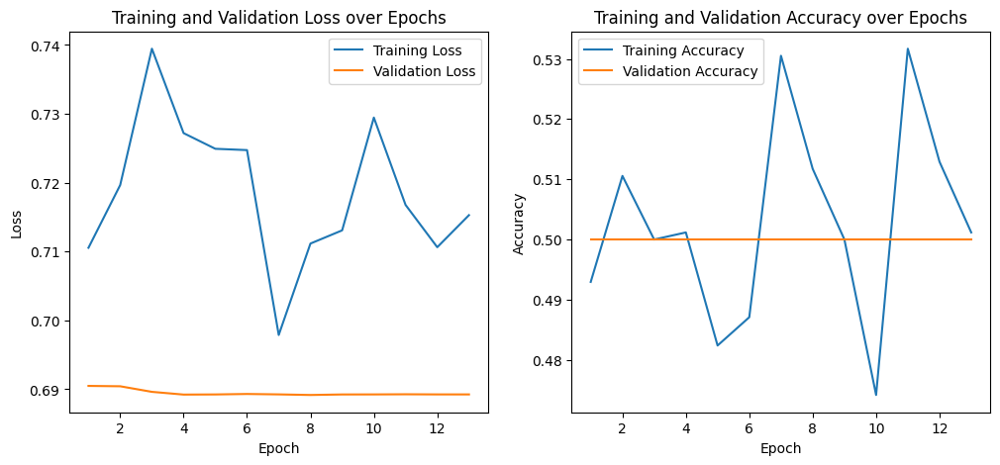

Test Loss: 0.6938, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7034, Val Loss: 0.7409, Train Acc: 0.5070, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6799, Val Loss: 0.7426, Train Acc: 0.5211, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6608, Val Loss: 0.7311, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.6747, Val Loss: 0.7145, Train Acc: 0.5082, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.6484, Val Loss: 0.6966, Train Acc: 0.5223, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6289, Val Loss: 0.6819, Train Acc: 0.5434, Val Acc: 0.5976
Epoch [7/100], Train Loss: 0.6123, Val Loss: 0.6656, Train Acc: 0.5610, Val Acc: 0.6585
Epoch [8/100], Train Loss: 0.6187, Val Loss: 0.6512, Train Acc: 0.5951, Val Acc: 0.7073
Epoch [9/100], Train Loss: 0.5977, Val Loss: 0.6425, Train Acc: 0.585

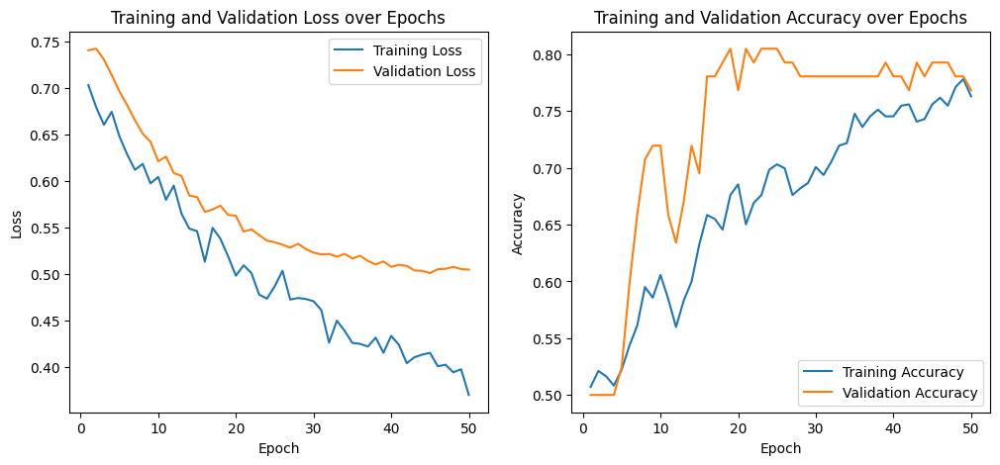

Test Loss: 0.4692, Accuracy: 76.83
Validation Accuracy: 76.83%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6911, Val Loss: 0.7502, Train Acc: 0.5387, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6912, Val Loss: 0.7377, Train Acc: 0.5246, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6772, Val Loss: 0.7244, Train Acc: 0.5540, Val Acc: 0.4878
Epoch [4/100], Train Loss: 0.6675, Val Loss: 0.7026, Train Acc: 0.5505, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.6555, Val Loss: 0.6947, Train Acc: 0.5458, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.6274, Val Loss: 0.6699, Train Acc: 0.5716, Val Acc: 0.5488
Epoch [7/100], Train Loss: 0.6364, Val Loss: 0.6641, Train Acc: 0.5481, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6299, Val Loss: 0.6438, Train Acc: 0.5622, Val Acc: 0.5488
Epoch [9/100], Train Loss: 0.6026, Val Loss: 0.6379, Train Acc: 

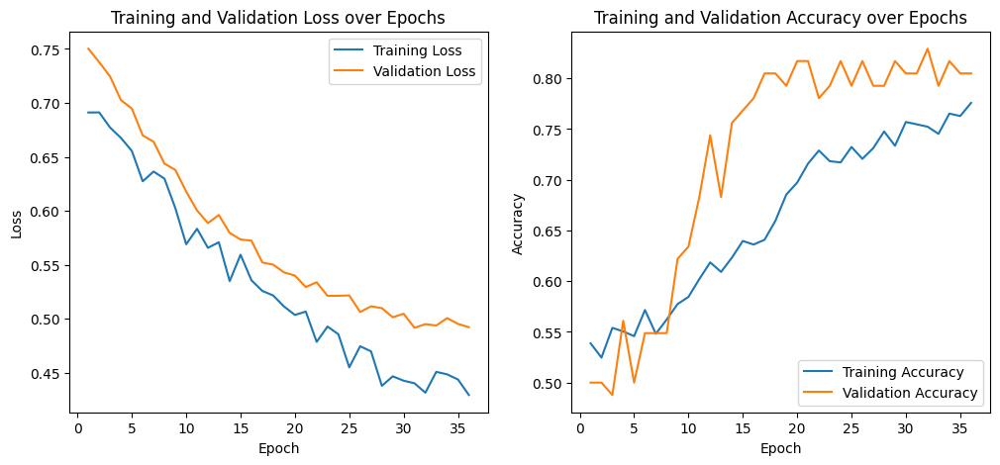

Test Loss: 0.4613, Accuracy: 80.49
Validation Accuracy: 80.49%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6998, Val Loss: 0.7523, Train Acc: 0.4859, Val Acc: 0.4756
Epoch [2/100], Train Loss: 0.6905, Val Loss: 0.7443, Train Acc: 0.5282, Val Acc: 0.6220
Epoch [3/100], Train Loss: 0.7021, Val Loss: 0.7373, Train Acc: 0.5434, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.6868, Val Loss: 0.7341, Train Acc: 0.5293, Val Acc: 0.5854
Epoch [5/100], Train Loss: 0.6923, Val Loss: 0.7338, Train Acc: 0.5481, Val Acc: 0.5976
Epoch [6/100], Train Loss: 0.6948, Val Loss: 0.7337, Train Acc: 0.5340, Val Acc: 0.5976
Epoch [7/100], Train Loss: 0.6834, Val Loss: 0.7324, Train Acc: 0.5469, Val Acc: 0.6098
Epoch [8/100], Train Loss: 0.6921, Val Loss: 0.7301, Train Acc: 0.5411, Val Acc: 0.6098
Epoch [9/100], Train Loss: 0.6715, Val Loss: 0.7282, Train Acc: 0.5399

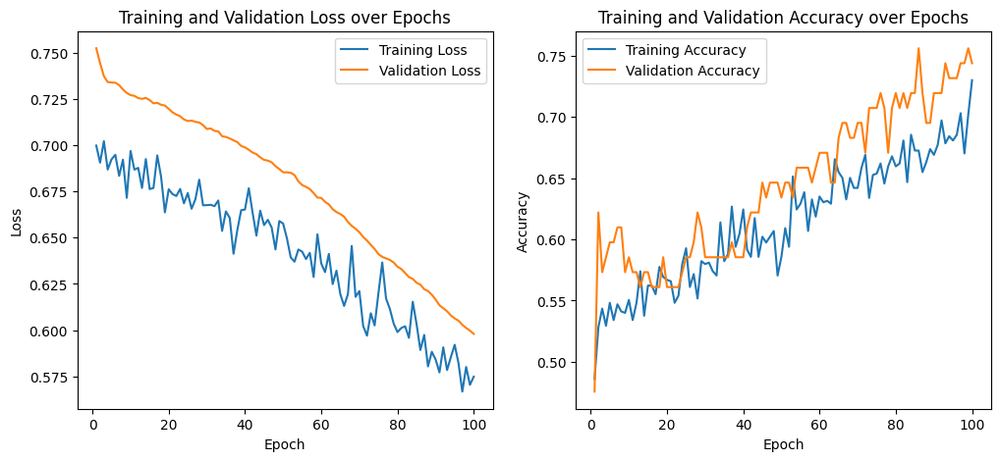

Test Loss: 0.5790, Accuracy: 74.39
Validation Accuracy: 74.39%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7095, Val Loss: 0.7624, Train Acc: 0.5035, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7066, Val Loss: 0.7591, Train Acc: 0.4824, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.6965, Val Loss: 0.7513, Train Acc: 0.4871, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.6798, Val Loss: 0.7478, Train Acc: 0.5575, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.6765, Val Loss: 0.7451, Train Acc: 0.5293, Val Acc: 0.5488
Epoch [6/100], Train Loss: 0.6779, Val Loss: 0.7439, Train Acc: 0.5622, Val Acc: 0.6220
Epoch [7/100], Train Loss: 0.6857, Val Loss: 0.7421, Train Acc: 0.5469, Val Acc: 0.6220
Epoch [8/100], Train Loss: 0.6963, Val Loss: 0.7408, Train Acc: 0.5434, Val Acc: 0.6098
Epoch [9/100], Train Loss: 0.6848, Val Loss: 0.7395, Train Acc: 0

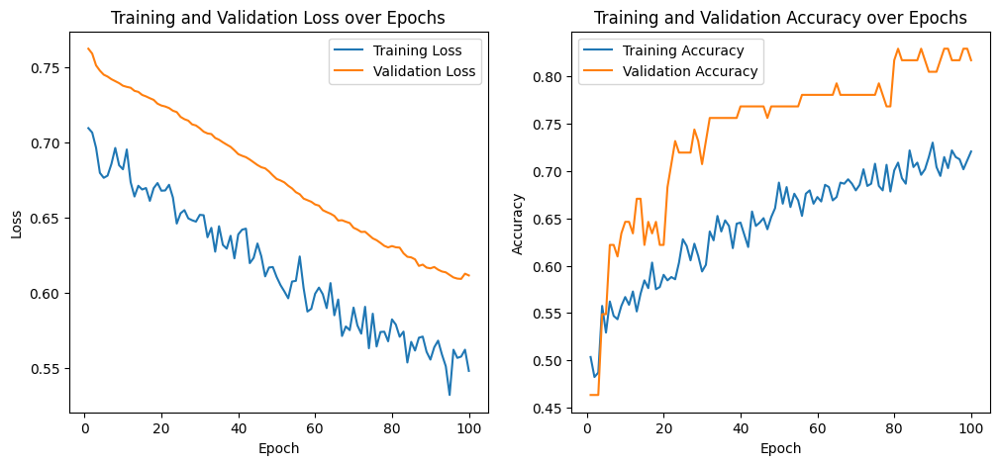

Test Loss: 0.5831, Accuracy: 81.71
Validation Accuracy: 81.71%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7012, Val Loss: 0.7436, Train Acc: 0.5012, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6917, Val Loss: 0.7351, Train Acc: 0.5469, Val Acc: 0.6098
Epoch [3/100], Train Loss: 0.6894, Val Loss: 0.7288, Train Acc: 0.5434, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.6818, Val Loss: 0.7244, Train Acc: 0.5634, Val Acc: 0.5976
Epoch [5/100], Train Loss: 0.6850, Val Loss: 0.7219, Train Acc: 0.5434, Val Acc: 0.5854
Epoch [6/100], Train Loss: 0.6886, Val Loss: 0.7200, Train Acc: 0.5622, Val Acc: 0.5854
Epoch [7/100], Train Loss: 0.6823, Val Loss: 0.7188, Train Acc: 0.5646, Val Acc: 0.5854
Epoch [8/100], Train Loss: 0.6778, Val Loss: 0.7183, Train Acc: 0.5505, Val Acc: 0.5976
Epoch [9/100], Train Loss: 0.6995, Val Loss: 0.7173, Train Acc: 0.5657

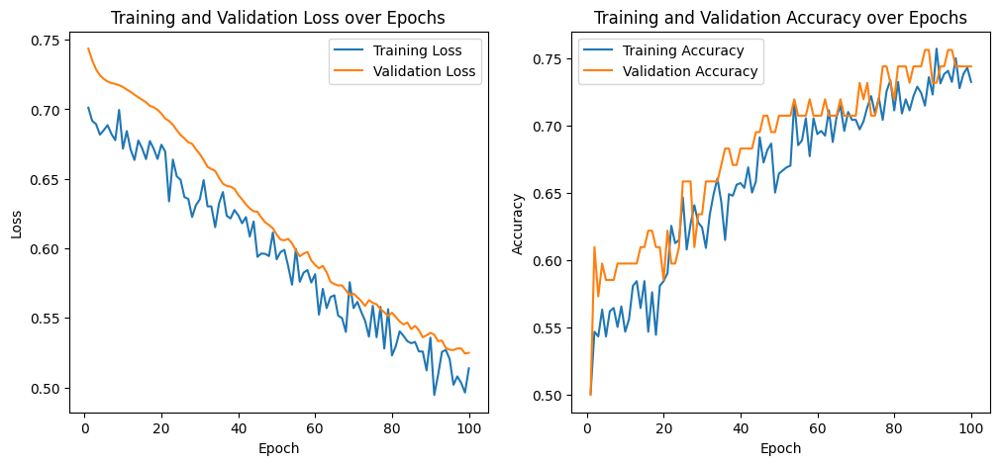

Test Loss: 0.5109, Accuracy: 74.39
Validation Accuracy: 74.39%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6992, Val Loss: 0.7466, Train Acc: 0.5035, Val Acc: 0.5122
Epoch [2/100], Train Loss: 0.6981, Val Loss: 0.7383, Train Acc: 0.5481, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6810, Val Loss: 0.7325, Train Acc: 0.5739, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6906, Val Loss: 0.7316, Train Acc: 0.5763, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6836, Val Loss: 0.7315, Train Acc: 0.5516, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6791, Val Loss: 0.7311, Train Acc: 0.5411, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6833, Val Loss: 0.7296, Train Acc: 0.5657, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6903, Val Loss: 0.7288, Train Acc: 0.5716, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6939, Val Loss: 0.7274, Train Acc: 0

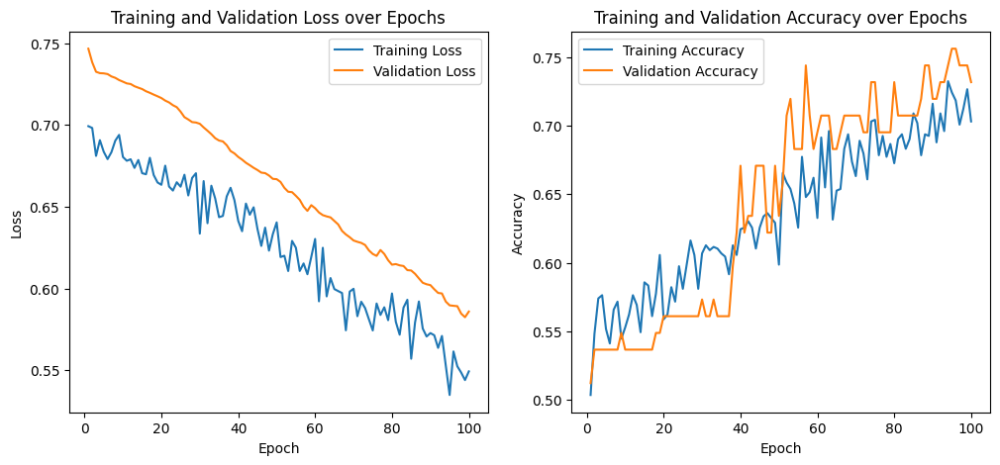

Test Loss: 0.5683, Accuracy: 73.17
Validation Accuracy: 73.17%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6999, Val Loss: 0.7474, Train Acc: 0.5141, Val Acc: 0.5976
Epoch [2/100], Train Loss: 0.6860, Val Loss: 0.7429, Train Acc: 0.5258, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7025, Val Loss: 0.7429, Train Acc: 0.4977, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7003, Val Loss: 0.7438, Train Acc: 0.5200, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6856, Val Loss: 0.7444, Train Acc: 0.5059, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6986, Val Loss: 0.7444, Train Acc: 0.5129, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.6835, Val Loss: 0.7438, Train Acc: 0.5446, Val Acc: 0.5244
Early stopping triggered.


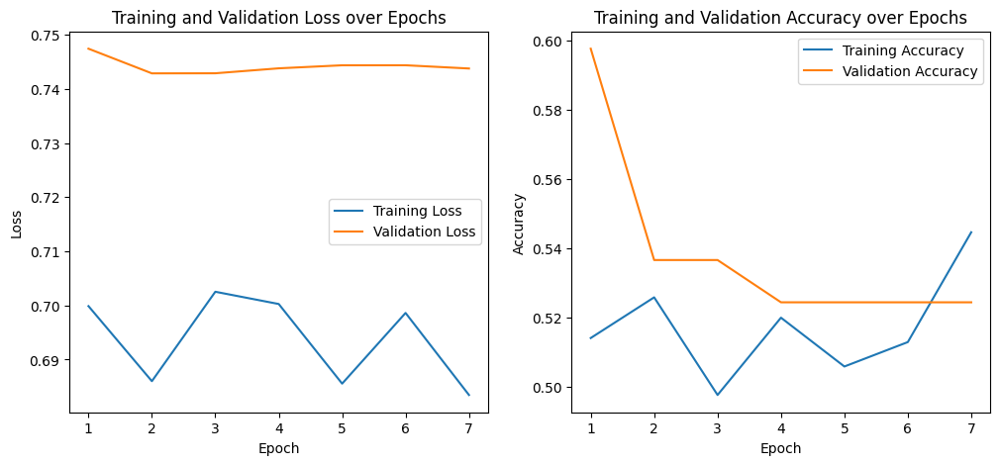

Test Loss: 0.7143, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6888, Val Loss: 0.7401, Train Acc: 0.5376, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7012, Val Loss: 0.7388, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6815, Val Loss: 0.7383, Train Acc: 0.5552, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6932, Val Loss: 0.7388, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6989, Val Loss: 0.7388, Train Acc: 0.5047, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6916, Val Loss: 0.7387, Train Acc: 0.5399, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6871, Val Loss: 0.7384, Train Acc: 0.5376, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6956, Val Loss: 0.7382, Train Acc: 0.5446, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6931, Val Loss: 0.7384, Train Acc: 0.

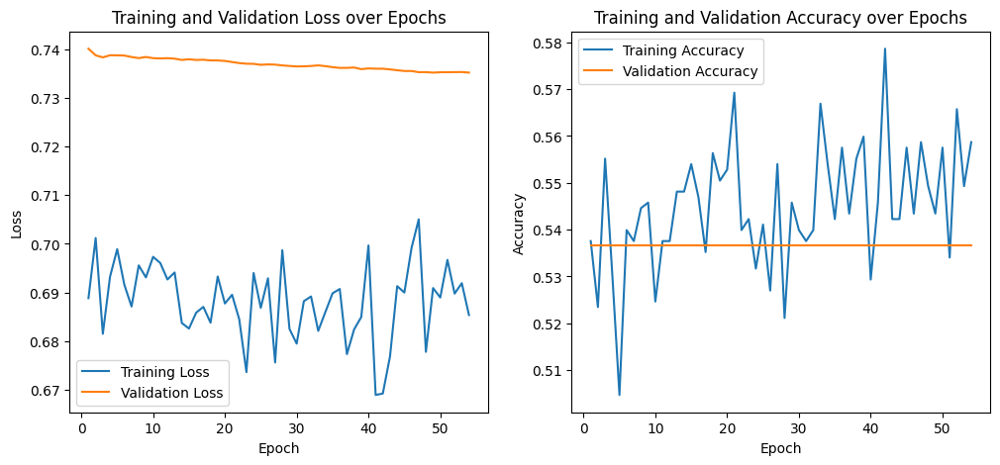

Test Loss: 0.7063, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6861, Val Loss: 0.7434, Train Acc: 0.5329, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6854, Val Loss: 0.7440, Train Acc: 0.5153, Val Acc: 0.4756
Epoch [3/100], Train Loss: 0.6930, Val Loss: 0.7418, Train Acc: 0.5235, Val Acc: 0.4390
Epoch [4/100], Train Loss: 0.7024, Val Loss: 0.7419, Train Acc: 0.5270, Val Acc: 0.4390
Epoch [5/100], Train Loss: 0.6854, Val Loss: 0.7405, Train Acc: 0.5129, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.6811, Val Loss: 0.7398, Train Acc: 0.5329, Val Acc: 0.4756
Epoch [7/100], Train Loss: 0.6992, Val Loss: 0.7395, Train Acc: 0.5188, Val Acc: 0.4756
Epoch [8/100], Train Loss: 0.6918, Val Loss: 0.7399, Train Acc: 0.5106, Val Acc: 0.5122
Epoch [9/100], Train Loss: 0.6985, Val Loss: 0.7401, Train Acc: 0.5047

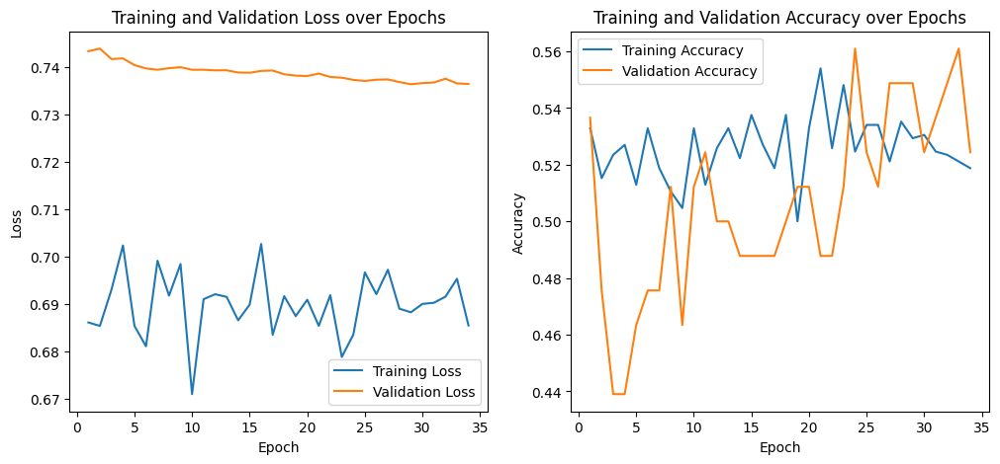

Test Loss: 0.7079, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7051, Val Loss: 0.7561, Train Acc: 0.4953, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6854, Val Loss: 0.7467, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7144, Val Loss: 0.7430, Train Acc: 0.5106, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.7052, Val Loss: 0.7420, Train Acc: 0.5035, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6872, Val Loss: 0.7414, Train Acc: 0.5293, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6932, Val Loss: 0.7407, Train Acc: 0.5223, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.6981, Val Loss: 0.7396, Train Acc: 0.5200, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.6871, Val Loss: 0.7388, Train Acc: 0.5106, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7033, Val Loss: 0.7373, Train Acc: 0

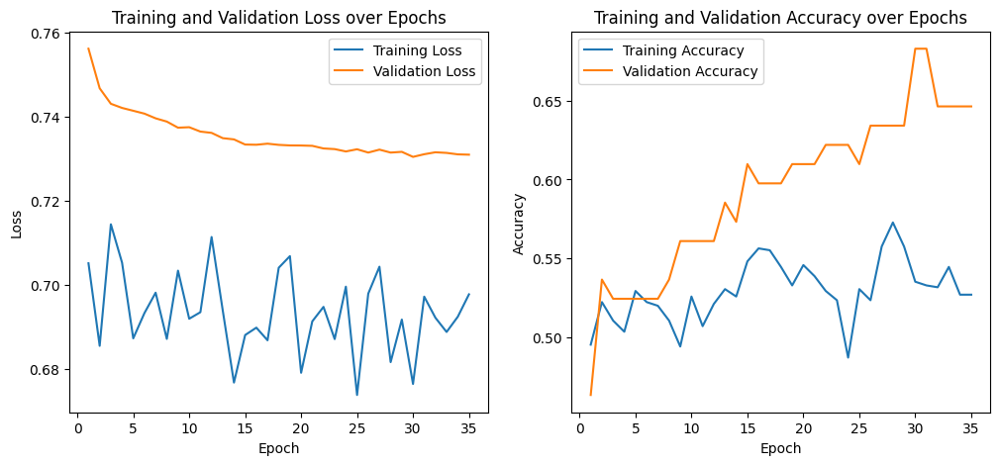

Test Loss: 0.6996, Accuracy: 64.63
Validation Accuracy: 64.63%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7196, Val Loss: 0.7588, Train Acc: 0.4707, Val Acc: 0.5122
Epoch [2/100], Train Loss: 0.7190, Val Loss: 0.7625, Train Acc: 0.4648, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.7182, Val Loss: 0.7631, Train Acc: 0.4730, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7186, Val Loss: 0.7643, Train Acc: 0.4730, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.6974, Val Loss: 0.7647, Train Acc: 0.4988, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7128, Val Loss: 0.7644, Train Acc: 0.4906, Val Acc: 0.4634
Early stopping triggered.


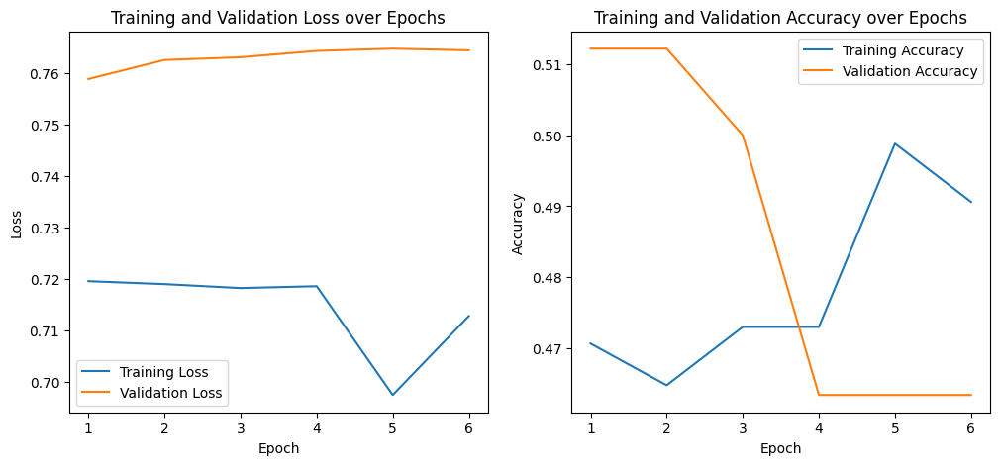

Test Loss: 0.7258, Accuracy: 46.34
Validation Accuracy: 46.34%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7101, Val Loss: 0.7460, Train Acc: 0.5012, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6983, Val Loss: 0.7435, Train Acc: 0.5129, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7012, Val Loss: 0.7422, Train Acc: 0.5282, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.7096, Val Loss: 0.7418, Train Acc: 0.4871, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6961, Val Loss: 0.7414, Train Acc: 0.4965, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.6981, Val Loss: 0.7410, Train Acc: 0.5059, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.6927, Val Loss: 0.7409, Train Acc: 0.5094, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.7051, Val Loss: 0.7407, Train Acc: 0.5000, Val Acc: 0.5244
Epoch [9/100], Train Loss: 0.7007, Val Loss: 0.7408, Train Acc: 0.

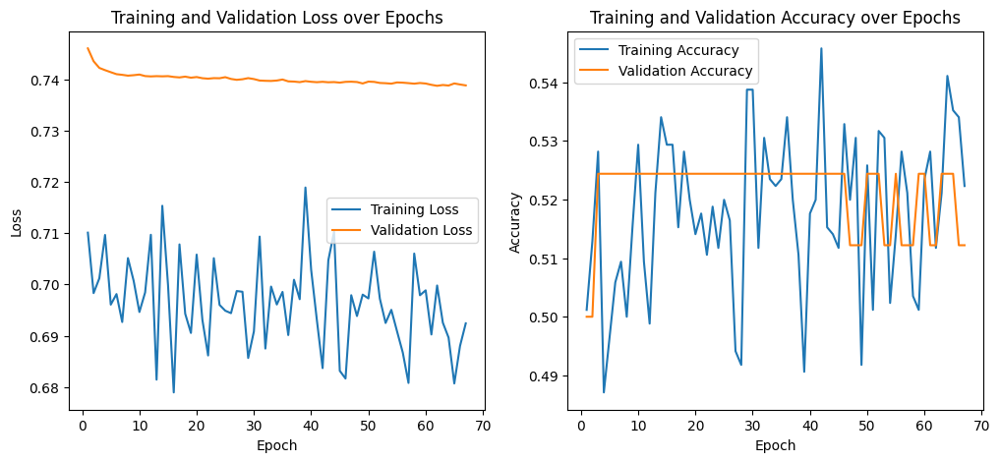

Test Loss: 0.7079, Accuracy: 51.22
Validation Accuracy: 51.22%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7389, Val Loss: 0.7412, Train Acc: 0.5188, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7299, Val Loss: 0.7378, Train Acc: 0.5023, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7062, Val Loss: 0.7371, Train Acc: 0.5246, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7160, Val Loss: 0.7368, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7089, Val Loss: 0.7365, Train Acc: 0.5211, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7006, Val Loss: 0.7366, Train Acc: 0.5117, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7127, Val Loss: 0.7372, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7139, Val Loss: 0.7388, Train Acc: 0.5293, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6955, Val Loss: 0.7381, Train Acc: 0.534

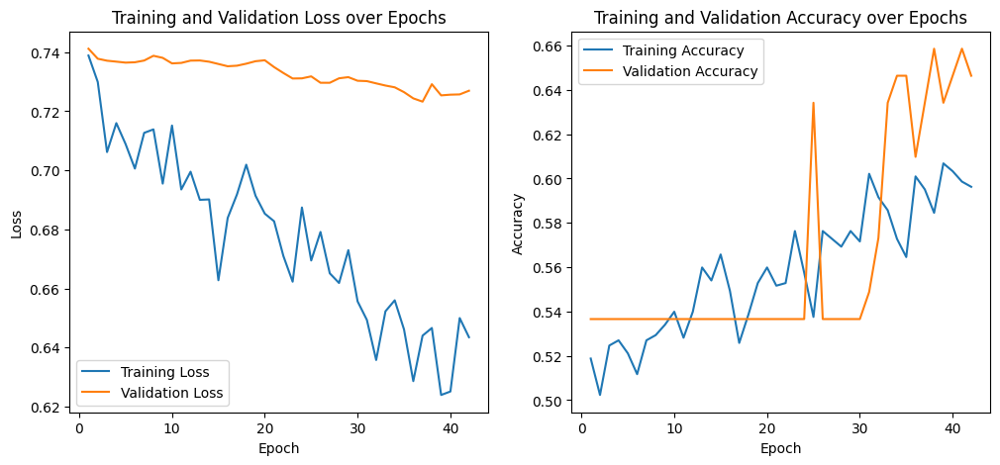

Test Loss: 0.6948, Accuracy: 64.63
Validation Accuracy: 64.63%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7228, Val Loss: 0.7400, Train Acc: 0.5282, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7680, Val Loss: 0.7408, Train Acc: 0.4894, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7059, Val Loss: 0.7361, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6852, Val Loss: 0.7360, Train Acc: 0.5540, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7248, Val Loss: 0.7374, Train Acc: 0.5329, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7194, Val Loss: 0.7380, Train Acc: 0.5423, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6935, Val Loss: 0.7370, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7133, Val Loss: 0.7360, Train Acc: 0.5329, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6975, Val Loss: 0.7351, Train Acc: 

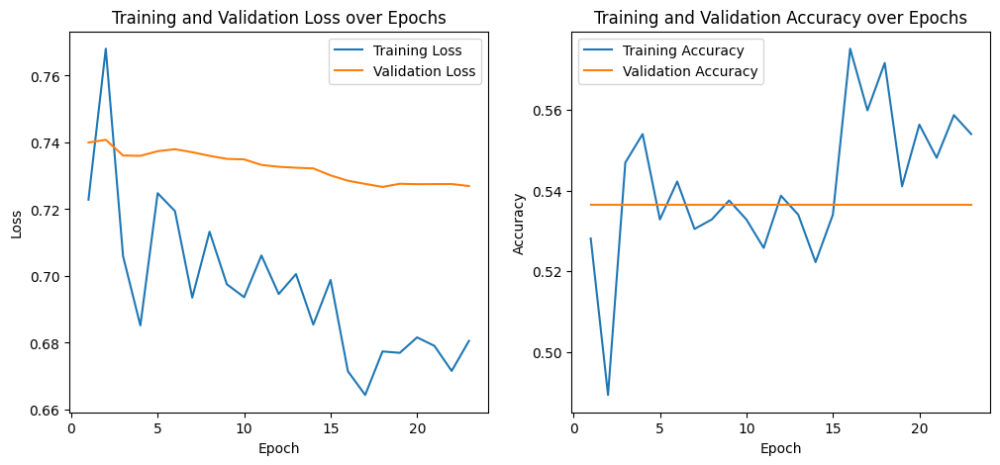

Test Loss: 0.7012, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7357, Val Loss: 0.7444, Train Acc: 0.5153, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7133, Val Loss: 0.7434, Train Acc: 0.5164, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7160, Val Loss: 0.7426, Train Acc: 0.5258, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7184, Val Loss: 0.7426, Train Acc: 0.5200, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7356, Val Loss: 0.7425, Train Acc: 0.5176, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7060, Val Loss: 0.7423, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7161, Val Loss: 0.7422, Train Acc: 0.5106, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7347, Val Loss: 0.7426, Train Acc: 0.4906, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7145, Val Loss: 0.7432, Train Acc: 0.5293

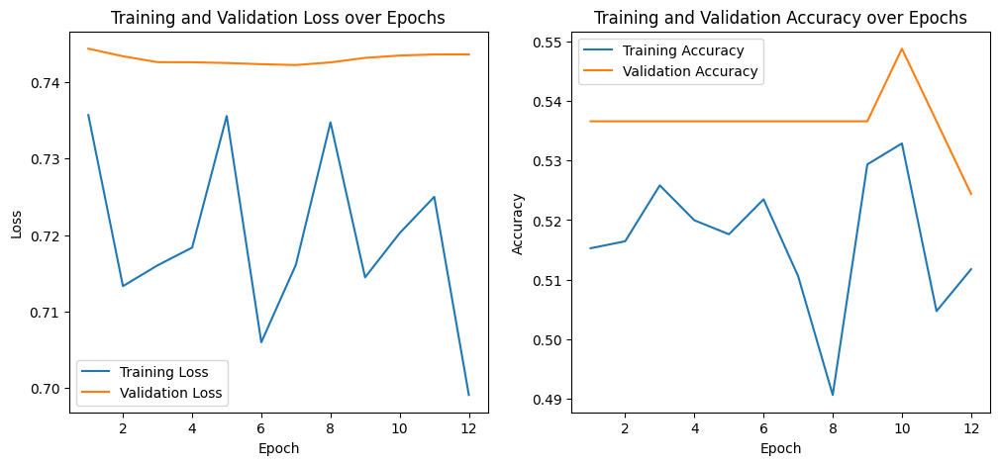

Test Loss: 0.7122, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7114, Val Loss: 0.7538, Train Acc: 0.5340, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7234, Val Loss: 0.7506, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7140, Val Loss: 0.7511, Train Acc: 0.5164, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7040, Val Loss: 0.7503, Train Acc: 0.5528, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7195, Val Loss: 0.7491, Train Acc: 0.5094, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7184, Val Loss: 0.7496, Train Acc: 0.5329, Val Acc: 0.4634
Epoch [7/100], Train Loss: 0.7100, Val Loss: 0.7494, Train Acc: 0.5305, Val Acc: 0.4756
Epoch [8/100], Train Loss: 0.7050, Val Loss: 0.7488, Train Acc: 0.5305, Val Acc: 0.4756
Epoch [9/100], Train Loss: 0.7191, Val Loss: 0.7480, Train Acc: 0

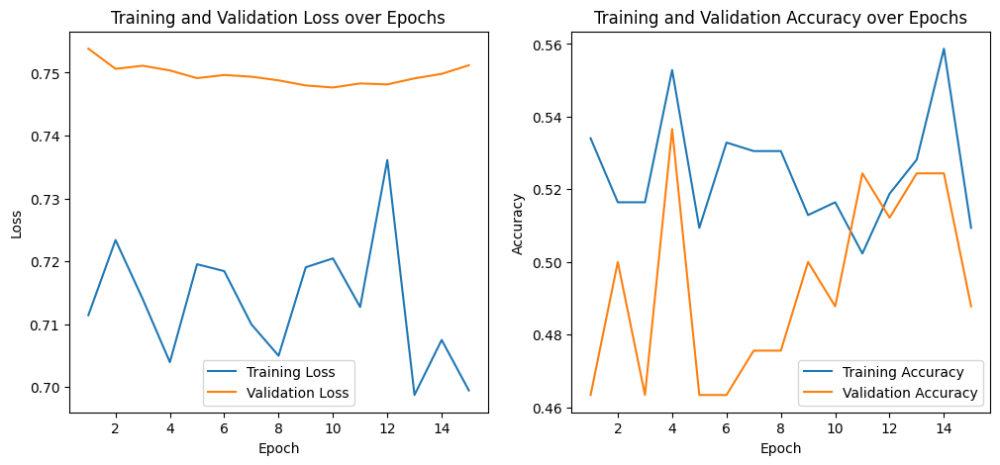

Test Loss: 0.7178, Accuracy: 48.78
Validation Accuracy: 48.78%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7237, Val Loss: 0.7436, Train Acc: 0.4906, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7241, Val Loss: 0.7421, Train Acc: 0.5023, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7149, Val Loss: 0.7412, Train Acc: 0.4965, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6923, Val Loss: 0.7402, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7189, Val Loss: 0.7393, Train Acc: 0.4965, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7126, Val Loss: 0.7388, Train Acc: 0.5317, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7312, Val Loss: 0.7383, Train Acc: 0.4930, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7254, Val Loss: 0.7382, Train Acc: 0.5094, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6988, Val Loss: 0.7386, Train Acc: 0.5117

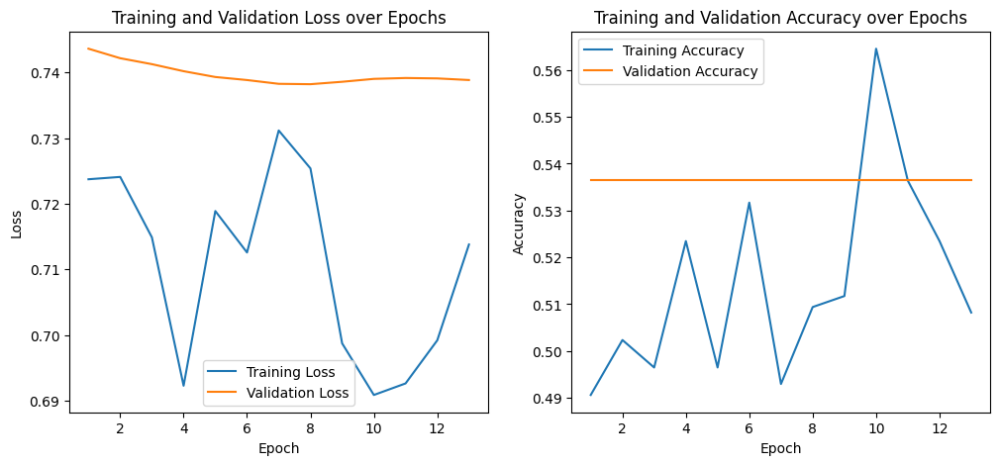

Test Loss: 0.7083, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7459, Val Loss: 0.7452, Train Acc: 0.4965, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6897, Val Loss: 0.7433, Train Acc: 0.5493, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7451, Val Loss: 0.7426, Train Acc: 0.5035, Val Acc: 0.5244
Epoch [4/100], Train Loss: 0.7492, Val Loss: 0.7421, Train Acc: 0.5059, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.7323, Val Loss: 0.7418, Train Acc: 0.5235, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.7277, Val Loss: 0.7419, Train Acc: 0.5035, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.7252, Val Loss: 0.7419, Train Acc: 0.5070, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.7246, Val Loss: 0.7421, Train Acc: 0.5082, Val Acc: 0.5244
Epoch [9/100], Train Loss: 0.7209, Val Loss: 0.7419, Train Acc: 0

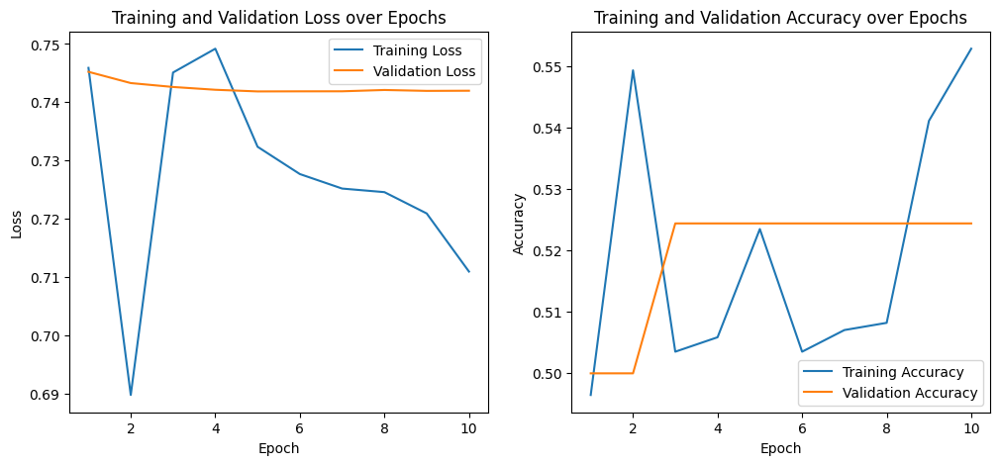

Test Loss: 0.7121, Accuracy: 52.44
Validation Accuracy: 52.44%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7453, Val Loss: 0.7541, Train Acc: 0.5047, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7598, Val Loss: 0.7552, Train Acc: 0.5047, Val Acc: 0.4512
Epoch [3/100], Train Loss: 0.7266, Val Loss: 0.7559, Train Acc: 0.5293, Val Acc: 0.4390
Epoch [4/100], Train Loss: 0.7639, Val Loss: 0.7564, Train Acc: 0.4953, Val Acc: 0.4268
Epoch [5/100], Train Loss: 0.7369, Val Loss: 0.7561, Train Acc: 0.4894, Val Acc: 0.4146
Epoch [6/100], Train Loss: 0.7314, Val Loss: 0.7556, Train Acc: 0.4894, Val Acc: 0.4268
Early stopping triggered.


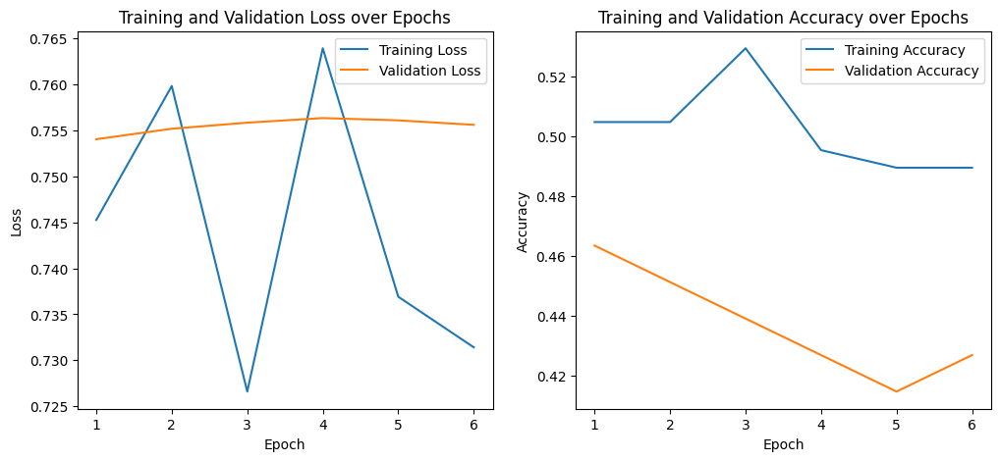

Test Loss: 0.7208, Accuracy: 42.68
Validation Accuracy: 42.68%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7392, Val Loss: 0.7400, Train Acc: 0.5176, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7149, Val Loss: 0.7387, Train Acc: 0.5352, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7107, Val Loss: 0.7388, Train Acc: 0.5399, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7219, Val Loss: 0.7384, Train Acc: 0.5094, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7579, Val Loss: 0.7384, Train Acc: 0.4742, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7286, Val Loss: 0.7384, Train Acc: 0.4941, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6922, Val Loss: 0.7384, Train Acc: 0.5411, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7213, Val Loss: 0.7387, Train Acc: 0.5094, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7169, Val Loss: 0.7387, Train Acc: 0.

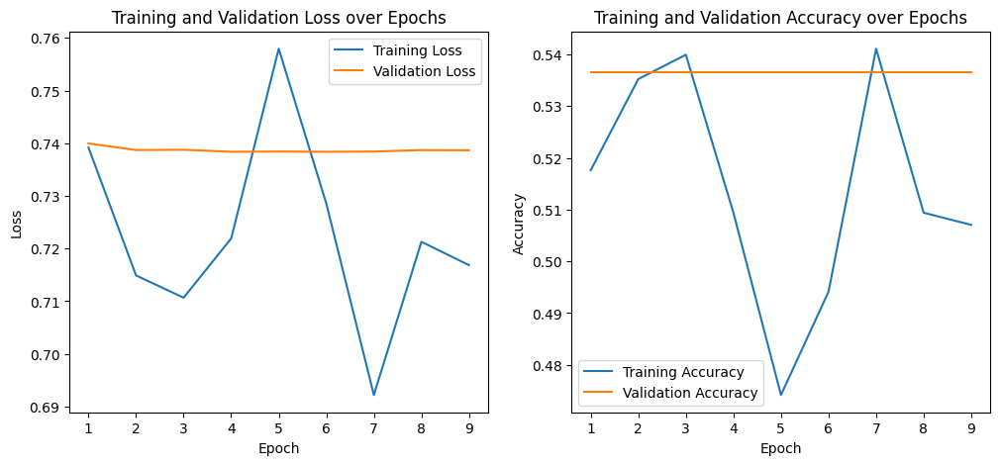

Test Loss: 0.7102, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7256, Val Loss: 0.7522, Train Acc: 0.5387, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7321, Val Loss: 0.7520, Train Acc: 0.5153, Val Acc: 0.5122
Epoch [3/100], Train Loss: 0.7558, Val Loss: 0.7516, Train Acc: 0.5023, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.7654, Val Loss: 0.7509, Train Acc: 0.4977, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.7421, Val Loss: 0.7503, Train Acc: 0.4871, Val Acc: 0.5244
Epoch [6/100], Train Loss: 0.7240, Val Loss: 0.7499, Train Acc: 0.5000, Val Acc: 0.5244
Epoch [7/100], Train Loss: 0.7374, Val Loss: 0.7497, Train Acc: 0.5340, Val Acc: 0.5244
Epoch [8/100], Train Loss: 0.7446, Val Loss: 0.7494, Train Acc: 0.5059, Val Acc: 0.5122
Epoch [9/100], Train Loss: 0.7410, Val Loss: 0.7492, Train Acc: 0.4894

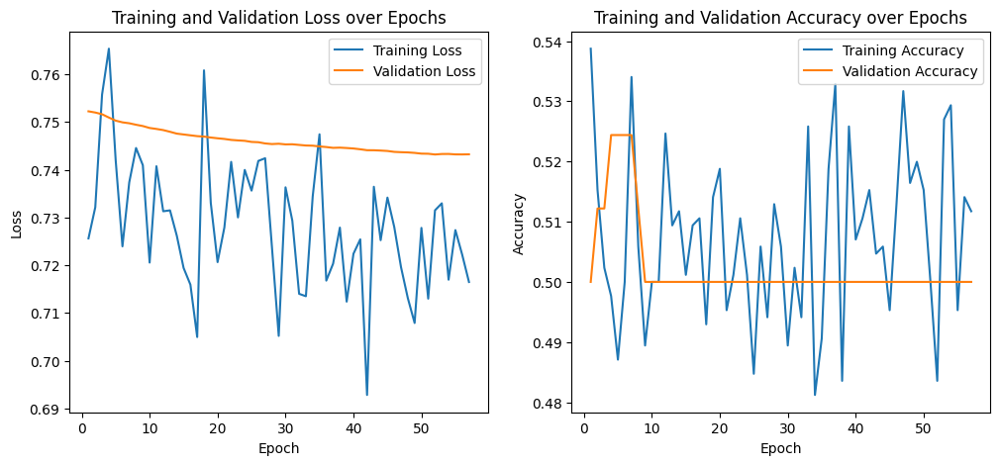

Test Loss: 0.7113, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7130, Val Loss: 0.7459, Train Acc: 0.5505, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7438, Val Loss: 0.7437, Train Acc: 0.5364, Val Acc: 0.5854
Epoch [3/100], Train Loss: 0.7627, Val Loss: 0.7430, Train Acc: 0.5094, Val Acc: 0.6220
Epoch [4/100], Train Loss: 0.7225, Val Loss: 0.7423, Train Acc: 0.5129, Val Acc: 0.6098
Epoch [5/100], Train Loss: 0.7315, Val Loss: 0.7422, Train Acc: 0.5117, Val Acc: 0.5976
Epoch [6/100], Train Loss: 0.7355, Val Loss: 0.7423, Train Acc: 0.5493, Val Acc: 0.5976
Epoch [7/100], Train Loss: 0.7537, Val Loss: 0.7425, Train Acc: 0.5164, Val Acc: 0.5854
Epoch [8/100], Train Loss: 0.7123, Val Loss: 0.7427, Train Acc: 0.5258, Val Acc: 0.5854
Epoch [9/100], Train Loss: 0.7557, Val Loss: 0.7427, Train Acc: 0

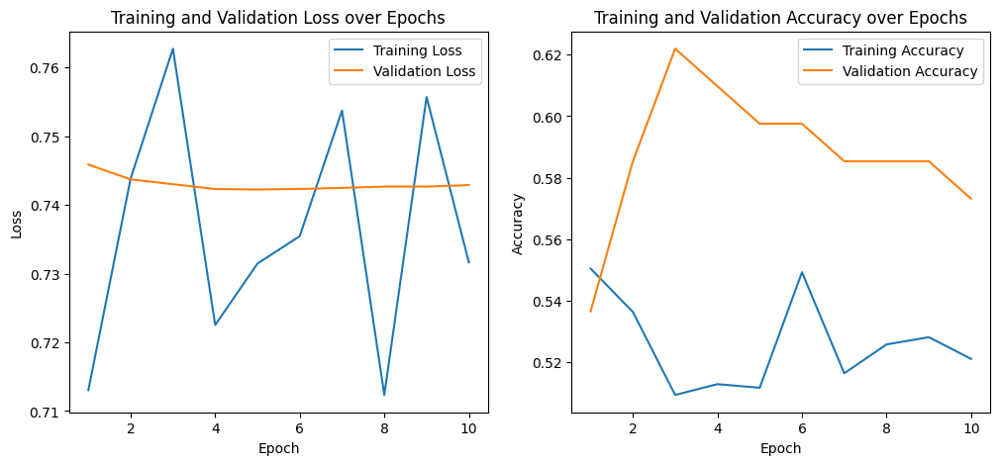

Test Loss: 0.7105, Accuracy: 57.32
Validation Accuracy: 57.32%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7540, Val Loss: 0.7465, Train Acc: 0.4800, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7344, Val Loss: 0.7469, Train Acc: 0.4918, Val Acc: 0.4878
Epoch [3/100], Train Loss: 0.7361, Val Loss: 0.7449, Train Acc: 0.5282, Val Acc: 0.5488
Epoch [4/100], Train Loss: 0.7677, Val Loss: 0.7435, Train Acc: 0.4660, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.7588, Val Loss: 0.7428, Train Acc: 0.5000, Val Acc: 0.5610
Epoch [6/100], Train Loss: 0.7506, Val Loss: 0.7429, Train Acc: 0.5012, Val Acc: 0.5610
Epoch [7/100], Train Loss: 0.7875, Val Loss: 0.7428, Train Acc: 0.4777, Val Acc: 0.5610
Epoch [8/100], Train Loss: 0.7608, Val Loss: 0.7426, Train Acc: 0.5153, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7640, Val Loss: 0.7425, Train Acc: 0.4836,

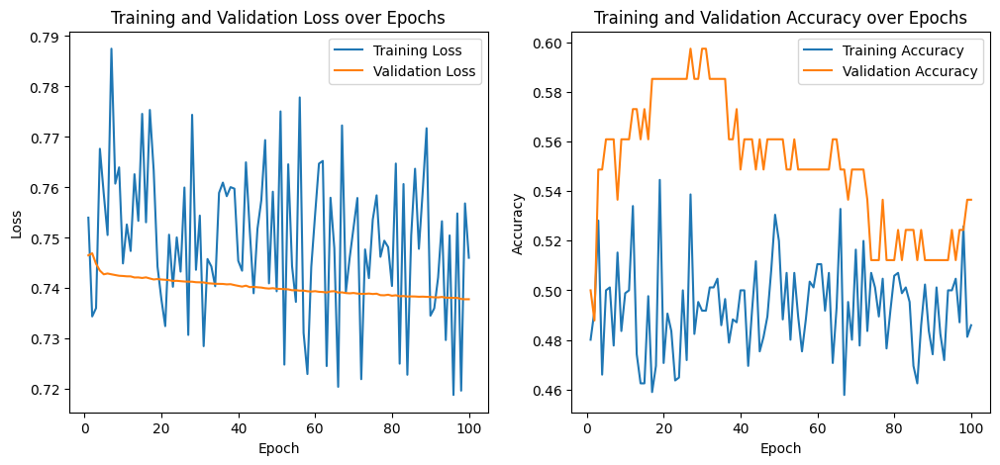

Test Loss: 0.7080, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': CrossEntropyLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7268, Val Loss: 0.7511, Train Acc: 0.5235, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7381, Val Loss: 0.7512, Train Acc: 0.5106, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7162, Val Loss: 0.7515, Train Acc: 0.5223, Val Acc: 0.4512
Epoch [4/100], Train Loss: 0.7099, Val Loss: 0.7516, Train Acc: 0.5070, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7363, Val Loss: 0.7517, Train Acc: 0.5211, Val Acc: 0.4756
Epoch [6/100], Train Loss: 0.7400, Val Loss: 0.7517, Train Acc: 0.4859, Val Acc: 0.4878
Early stopping triggered.


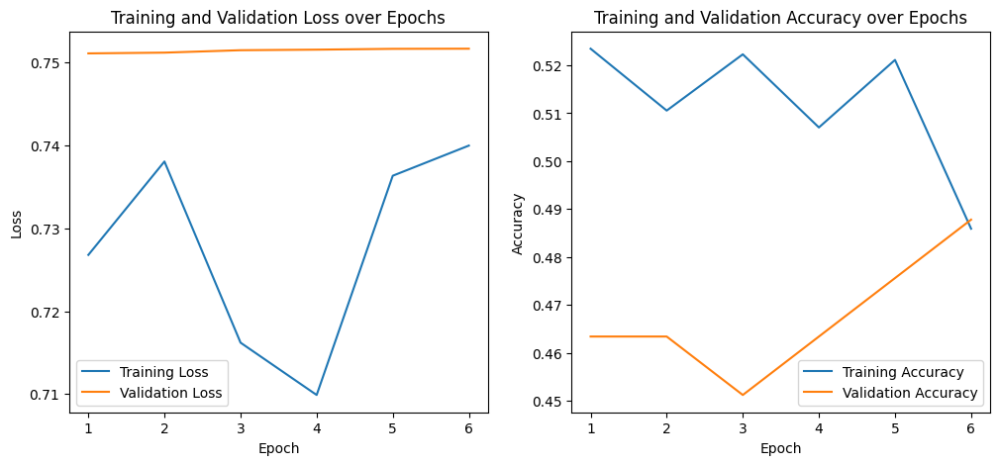

Test Loss: 0.7181, Accuracy: 48.78
Validation Accuracy: 48.78%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6906, Val Loss: 0.6952, Train Acc: 0.5563, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6863, Val Loss: 0.6890, Train Acc: 0.5528, Val Acc: 0.6220
Epoch [3/100], Train Loss: 0.6816, Val Loss: 0.6783, Train Acc: 0.5575, Val Acc: 0.5854
Epoch [4/100], Train Loss: 0.6658, Val Loss: 0.6650, Train Acc: 0.5751, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.6598, Val Loss: 0.6607, Train Acc: 0.5986, Val Acc: 0.6098
Epoch [6/100], Train Loss: 0.6648, Val Loss: 0.6533, Train Acc: 0.6021, Val Acc: 0.6463
Epoch [7/100], Train Loss: 0.6520, Val Loss: 0.6404, Train Acc: 0.6185, Val Acc: 0.6463
Epoch [8/100], Train Loss: 0.6413, Val Loss: 0.6297, Train Acc: 0.6408, Val Acc: 0.6585
Epoch [9/100], Train Loss: 0.6301, Val Loss: 0.6226, Train Acc: 0.64

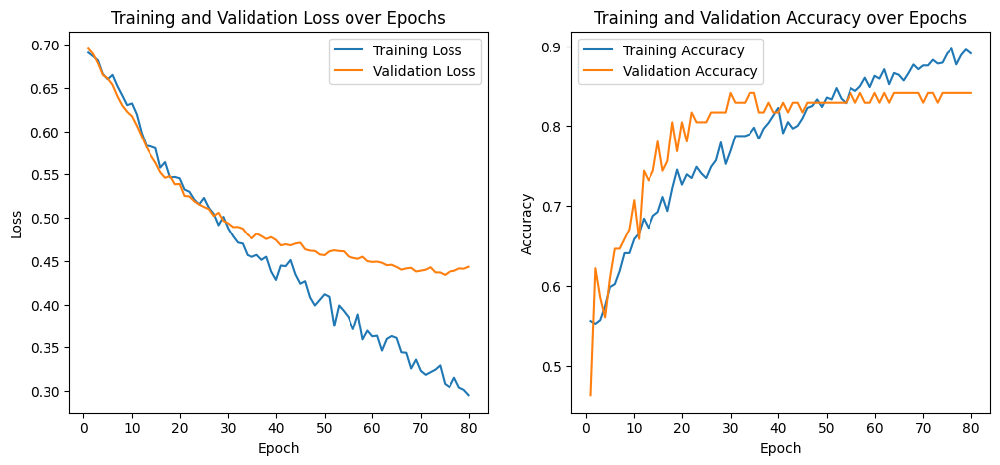

Test Loss: 0.4386, Accuracy: 84.15
Validation Accuracy: 84.15%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6937, Val Loss: 0.6920, Train Acc: 0.5552, Val Acc: 0.5976
Epoch [2/100], Train Loss: 0.6849, Val Loss: 0.6899, Train Acc: 0.5458, Val Acc: 0.6220
Epoch [3/100], Train Loss: 0.6804, Val Loss: 0.6839, Train Acc: 0.5798, Val Acc: 0.6707
Epoch [4/100], Train Loss: 0.6695, Val Loss: 0.6755, Train Acc: 0.5751, Val Acc: 0.6707
Epoch [5/100], Train Loss: 0.6697, Val Loss: 0.6692, Train Acc: 0.5822, Val Acc: 0.6829
Epoch [6/100], Train Loss: 0.6509, Val Loss: 0.6628, Train Acc: 0.5998, Val Acc: 0.6829
Epoch [7/100], Train Loss: 0.6444, Val Loss: 0.6619, Train Acc: 0.6303, Val Acc: 0.6951
Epoch [8/100], Train Loss: 0.6310, Val Loss: 0.6514, Train Acc: 0.6549, Val Acc: 0.6829
Epoch [9/100], Train Loss: 0.6334, Val Loss: 0.6457, Train Acc:

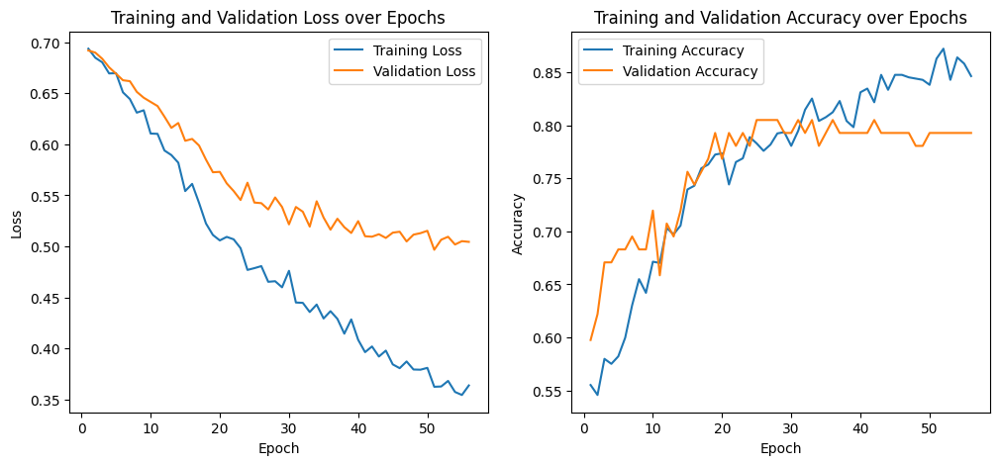

Test Loss: 0.4895, Accuracy: 79.27
Validation Accuracy: 79.27%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6951, Val Loss: 0.6914, Train Acc: 0.5200, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6938, Val Loss: 0.6893, Train Acc: 0.5282, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6925, Val Loss: 0.6881, Train Acc: 0.5164, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.6891, Val Loss: 0.6859, Train Acc: 0.5200, Val Acc: 0.5244
Epoch [5/100], Train Loss: 0.6905, Val Loss: 0.6847, Train Acc: 0.5106, Val Acc: 0.5732
Epoch [6/100], Train Loss: 0.6958, Val Loss: 0.6840, Train Acc: 0.5153, Val Acc: 0.5854
Epoch [7/100], Train Loss: 0.6890, Val Loss: 0.6830, Train Acc: 0.5376, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6904, Val Loss: 0.6823, Train Acc: 0.5352, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6935, Val Loss: 0.6818, Train Acc: 0.520

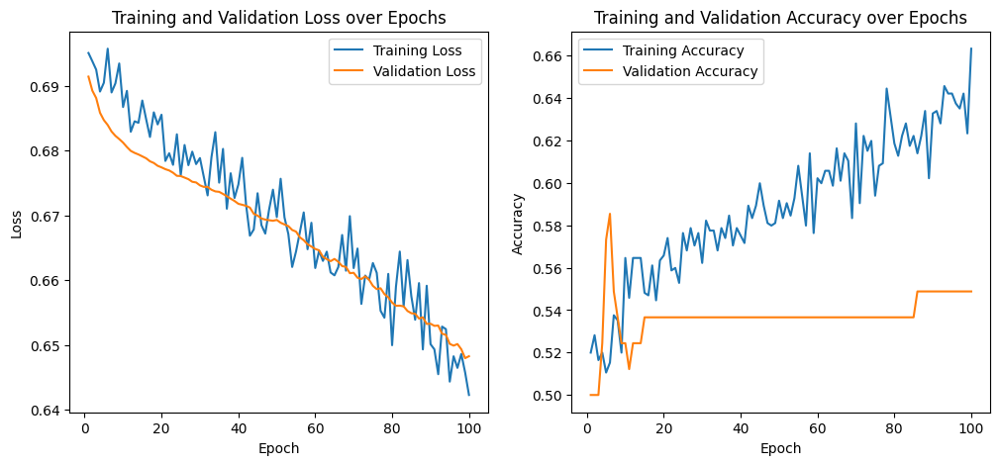

Test Loss: 0.6546, Accuracy: 54.88
Validation Accuracy: 54.88%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6968, Val Loss: 0.6911, Train Acc: 0.4953, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7033, Val Loss: 0.6910, Train Acc: 0.4695, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.6931, Val Loss: 0.6905, Train Acc: 0.5164, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6928, Val Loss: 0.6882, Train Acc: 0.5270, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6917, Val Loss: 0.6862, Train Acc: 0.5235, Val Acc: 0.5610
Epoch [6/100], Train Loss: 0.6879, Val Loss: 0.6855, Train Acc: 0.5516, Val Acc: 0.5488
Epoch [7/100], Train Loss: 0.6921, Val Loss: 0.6839, Train Acc: 0.5364, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6847, Val Loss: 0.6834, Train Acc: 0.5563, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6885, Val Loss: 0.6835, Train Acc: 

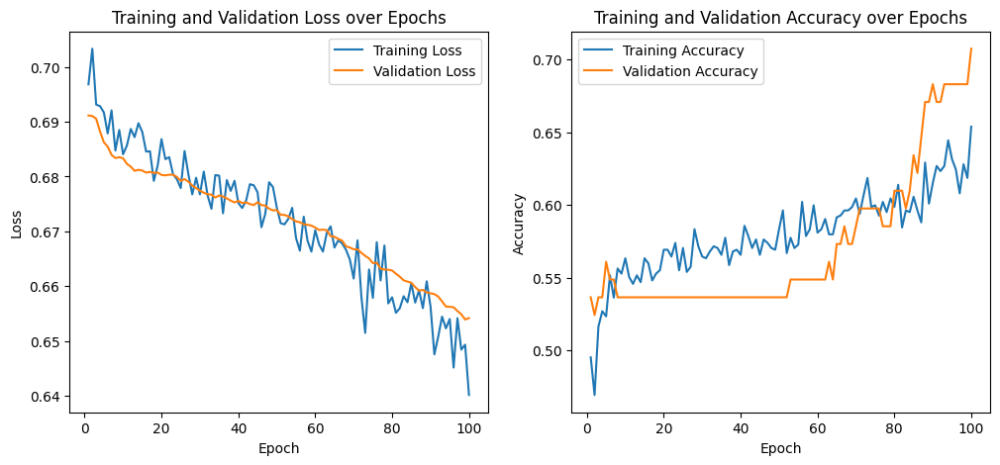

Test Loss: 0.6568, Accuracy: 70.73
Validation Accuracy: 70.73%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.6923, Val Loss: 0.6898, Train Acc: 0.5364, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6894, Val Loss: 0.6851, Train Acc: 0.5282, Val Acc: 0.5610
Epoch [3/100], Train Loss: 0.6908, Val Loss: 0.6832, Train Acc: 0.5575, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6897, Val Loss: 0.6812, Train Acc: 0.5411, Val Acc: 0.5488
Epoch [5/100], Train Loss: 0.6808, Val Loss: 0.6795, Train Acc: 0.5704, Val Acc: 0.5488
Epoch [6/100], Train Loss: 0.6872, Val Loss: 0.6782, Train Acc: 0.5434, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6866, Val Loss: 0.6778, Train Acc: 0.5552, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6872, Val Loss: 0.6772, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6843, Val Loss: 0.6767, Train Acc: 0.561

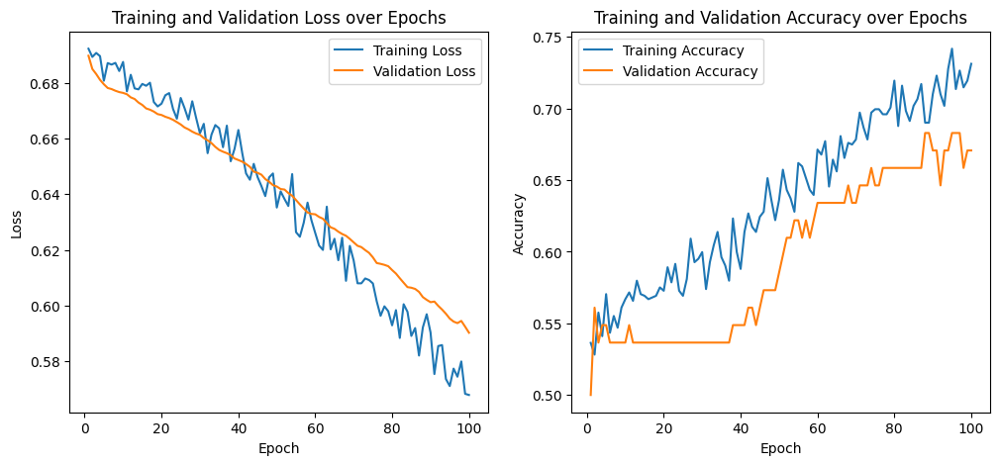

Test Loss: 0.5978, Accuracy: 67.07
Validation Accuracy: 67.07%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6986, Val Loss: 0.6925, Train Acc: 0.4765, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6932, Val Loss: 0.6894, Train Acc: 0.5246, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6850, Val Loss: 0.6856, Train Acc: 0.5364, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.6890, Val Loss: 0.6838, Train Acc: 0.5516, Val Acc: 0.5732
Epoch [5/100], Train Loss: 0.6825, Val Loss: 0.6830, Train Acc: 0.5423, Val Acc: 0.5732
Epoch [6/100], Train Loss: 0.6803, Val Loss: 0.6826, Train Acc: 0.5622, Val Acc: 0.5488
Epoch [7/100], Train Loss: 0.6835, Val Loss: 0.6822, Train Acc: 0.5681, Val Acc: 0.5488
Epoch [8/100], Train Loss: 0.6735, Val Loss: 0.6815, Train Acc: 0.5704, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6696, Val Loss: 0.6809, Train Acc: 

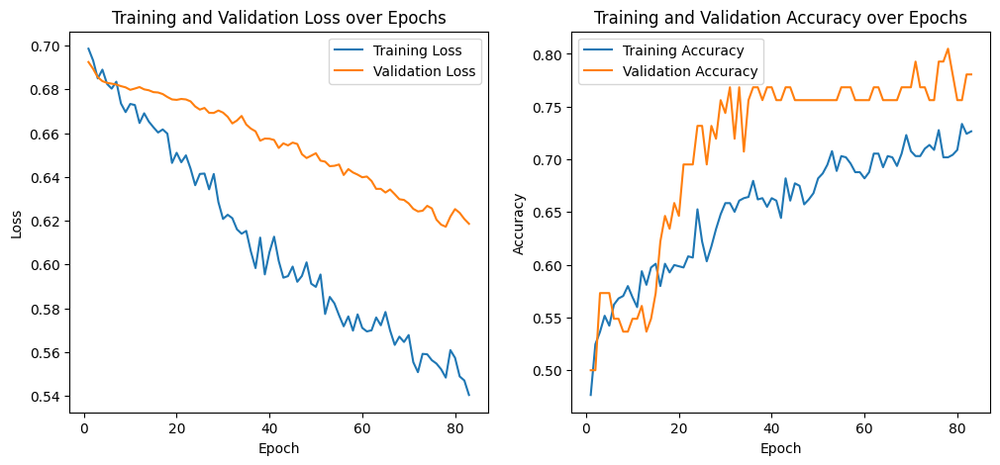

Test Loss: 0.6191, Accuracy: 78.05
Validation Accuracy: 78.05%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7033, Val Loss: 0.6955, Train Acc: 0.4484, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7028, Val Loss: 0.6959, Train Acc: 0.5094, Val Acc: 0.4146
Epoch [3/100], Train Loss: 0.7024, Val Loss: 0.6982, Train Acc: 0.4754, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7031, Val Loss: 0.6977, Train Acc: 0.4636, Val Acc: 0.4756
Epoch [5/100], Train Loss: 0.7035, Val Loss: 0.6973, Train Acc: 0.4718, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7020, Val Loss: 0.6971, Train Acc: 0.4613, Val Acc: 0.4756
Early stopping triggered.


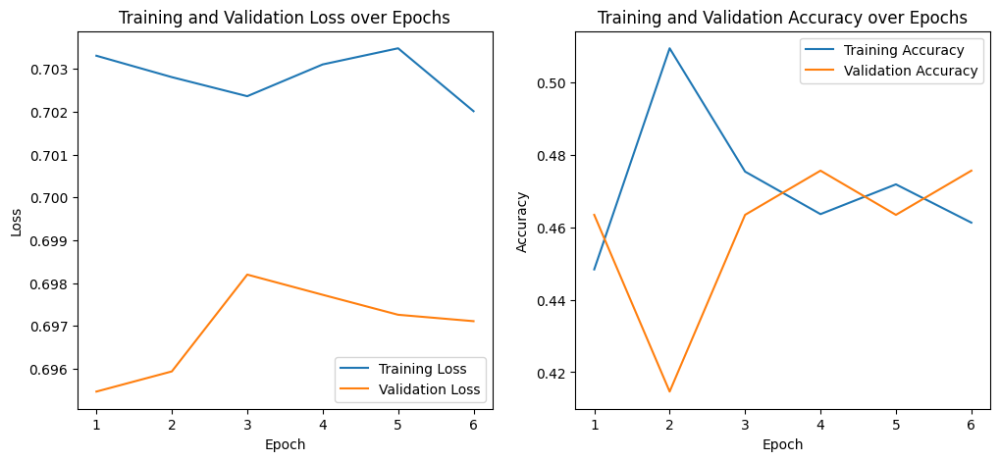

Test Loss: 0.6963, Accuracy: 47.56
Validation Accuracy: 47.56%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7081, Val Loss: 0.6996, Train Acc: 0.4366, Val Acc: 0.5244
Epoch [2/100], Train Loss: 0.7075, Val Loss: 0.6997, Train Acc: 0.4577, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.6998, Val Loss: 0.7008, Train Acc: 0.4812, Val Acc: 0.4878
Epoch [4/100], Train Loss: 0.7051, Val Loss: 0.7011, Train Acc: 0.4824, Val Acc: 0.4756
Epoch [5/100], Train Loss: 0.7068, Val Loss: 0.7015, Train Acc: 0.4824, Val Acc: 0.4634
Epoch [6/100], Train Loss: 0.7032, Val Loss: 0.7013, Train Acc: 0.4847, Val Acc: 0.4756
Early stopping triggered.


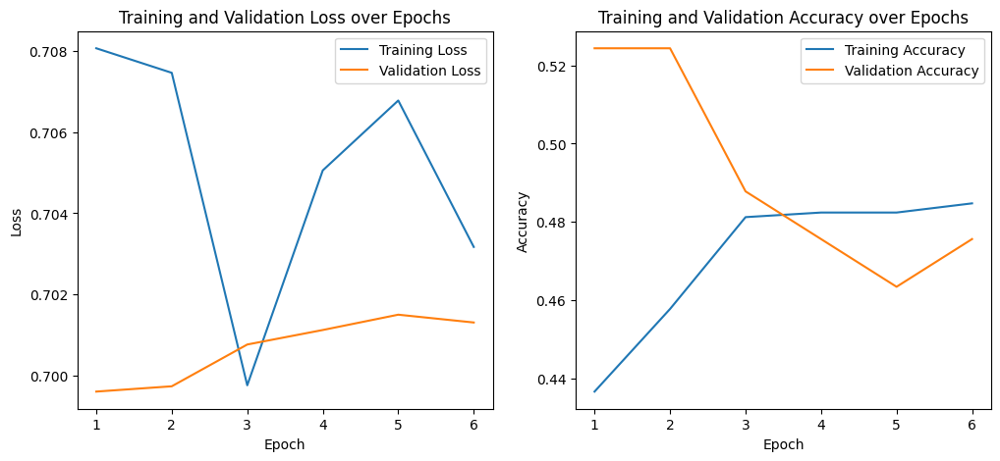

Test Loss: 0.6983, Accuracy: 47.56
Validation Accuracy: 47.56%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7185, Val Loss: 0.6959, Train Acc: 0.4871, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7140, Val Loss: 0.6966, Train Acc: 0.4836, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7159, Val Loss: 0.6954, Train Acc: 0.4695, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7129, Val Loss: 0.6954, Train Acc: 0.4671, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7107, Val Loss: 0.6953, Train Acc: 0.5082, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7143, Val Loss: 0.6948, Train Acc: 0.4695, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7126, Val Loss: 0.6940, Train Acc: 0.4847, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7061, Val Loss: 0.6932, Train Acc: 0.4941, Val Acc: 0.5122
Epoch [9/100], Train Loss: 0.7026, Val Loss: 0.6924, Train Acc: 0.494

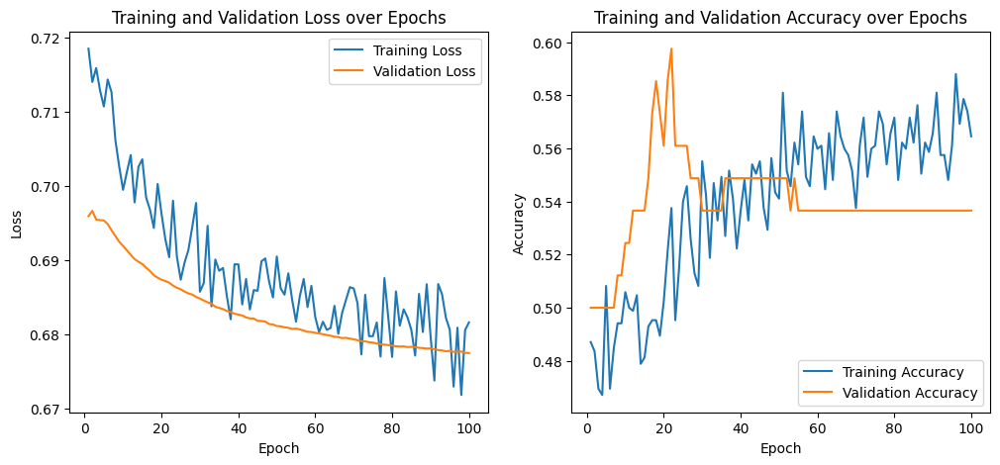

Test Loss: 0.6808, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6887, Val Loss: 0.6936, Train Acc: 0.5434, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.6913, Val Loss: 0.6918, Train Acc: 0.5505, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6877, Val Loss: 0.6897, Train Acc: 0.5387, Val Acc: 0.5610
Epoch [4/100], Train Loss: 0.6927, Val Loss: 0.6884, Train Acc: 0.5411, Val Acc: 0.5732
Epoch [5/100], Train Loss: 0.6890, Val Loss: 0.6881, Train Acc: 0.5399, Val Acc: 0.5732
Epoch [6/100], Train Loss: 0.6883, Val Loss: 0.6877, Train Acc: 0.5446, Val Acc: 0.5732
Epoch [7/100], Train Loss: 0.6928, Val Loss: 0.6873, Train Acc: 0.5387, Val Acc: 0.5854
Epoch [8/100], Train Loss: 0.6913, Val Loss: 0.6872, Train Acc: 0.5493, Val Acc: 0.5854
Epoch [9/100], Train Loss: 0.6869, Val Loss: 0.6869, Train Acc: 

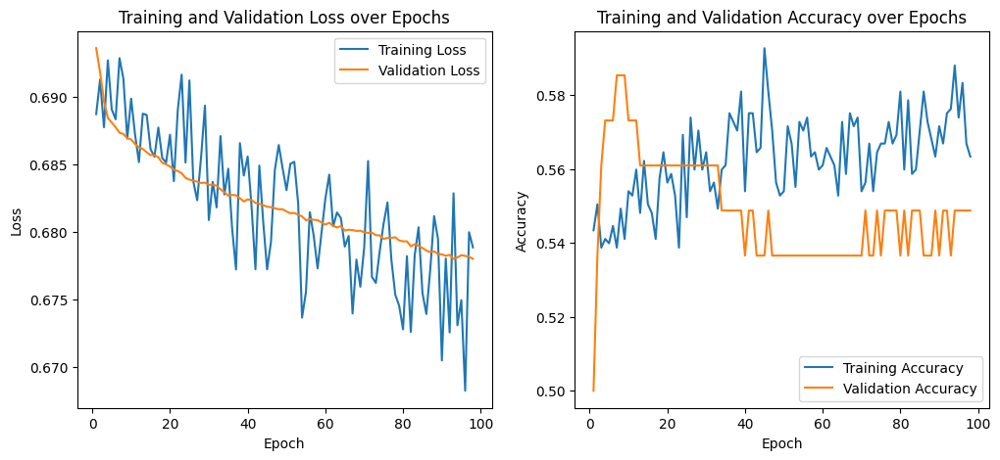

Test Loss: 0.6803, Accuracy: 54.88
Validation Accuracy: 54.88%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7057, Val Loss: 0.6922, Train Acc: 0.4836, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7087, Val Loss: 0.6930, Train Acc: 0.4437, Val Acc: 0.4756
Epoch [3/100], Train Loss: 0.7020, Val Loss: 0.6917, Train Acc: 0.4824, Val Acc: 0.5122
Epoch [4/100], Train Loss: 0.7047, Val Loss: 0.6917, Train Acc: 0.5059, Val Acc: 0.5122
Epoch [5/100], Train Loss: 0.7065, Val Loss: 0.6918, Train Acc: 0.4754, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7064, Val Loss: 0.6917, Train Acc: 0.4601, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7021, Val Loss: 0.6917, Train Acc: 0.4742, Val Acc: 0.5000
Epoch [8/100], Train Loss: 0.7016, Val Loss: 0.6916, Train Acc: 0.4988, Val Acc: 0.5000
Epoch [9/100], Train Loss: 0.7012, Val Loss: 0.6916, Train Acc: 0.4847

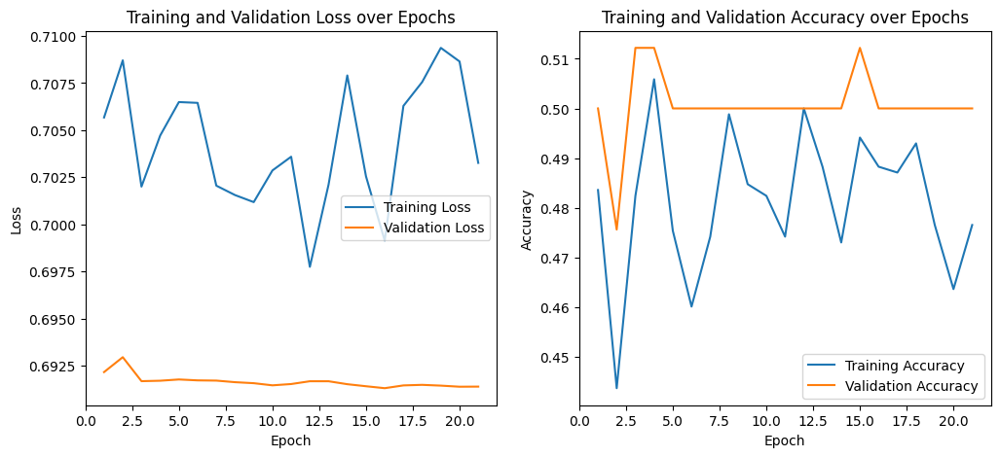

Test Loss: 0.6920, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.6867, Val Loss: 0.6901, Train Acc: 0.5399, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.6968, Val Loss: 0.6881, Train Acc: 0.5364, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6849, Val Loss: 0.6868, Train Acc: 0.5563, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.6929, Val Loss: 0.6866, Train Acc: 0.5516, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6851, Val Loss: 0.6865, Train Acc: 0.5552, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.6923, Val Loss: 0.6865, Train Acc: 0.5399, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6843, Val Loss: 0.6863, Train Acc: 0.5376, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6867, Val Loss: 0.6863, Train Acc: 0.5587, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6860, Val Loss: 0.6864, Train Acc: 0

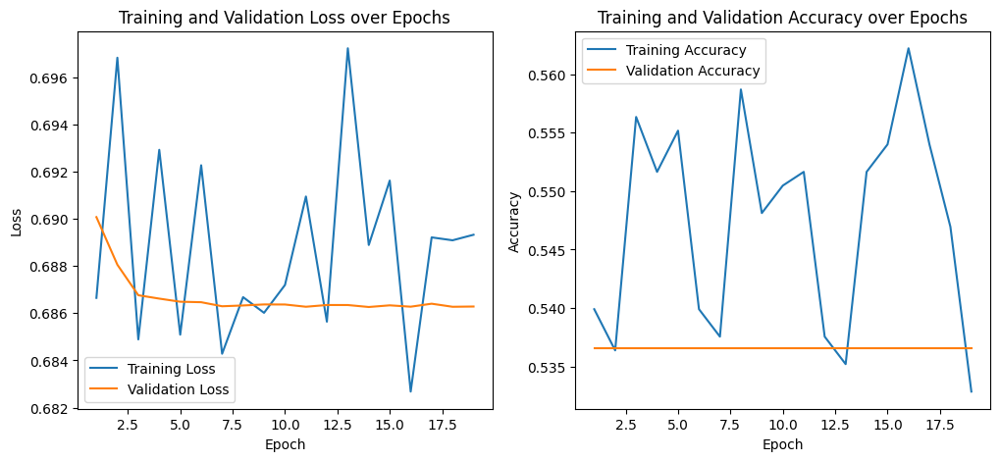

Test Loss: 0.6884, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7235, Val Loss: 0.6950, Train Acc: 0.4953, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7149, Val Loss: 0.6888, Train Acc: 0.5446, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7051, Val Loss: 0.6880, Train Acc: 0.5505, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7012, Val Loss: 0.6892, Train Acc: 0.5293, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7007, Val Loss: 0.6894, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7021, Val Loss: 0.6890, Train Acc: 0.5129, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7090, Val Loss: 0.6880, Train Acc: 0.4953, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7132, Val Loss: 0.6878, Train Acc: 0.5047, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6996, Val Loss: 0.6885, Train Acc: 0.53

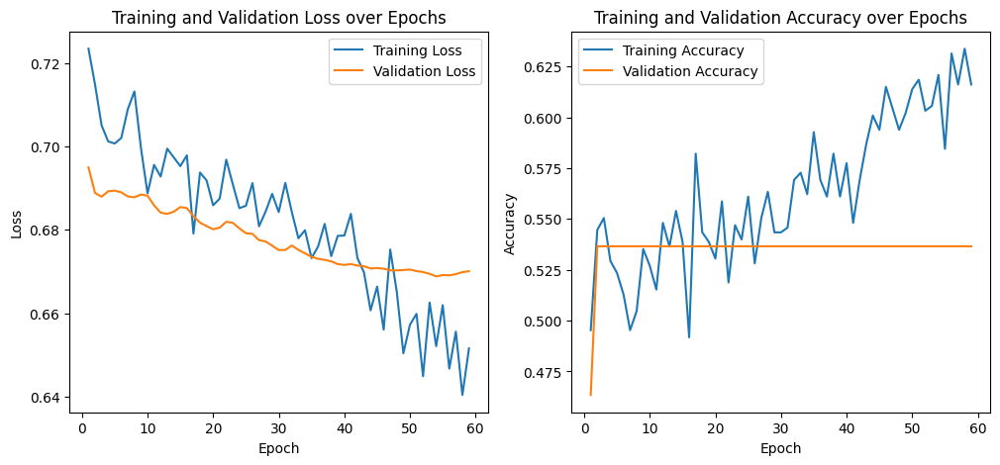

Test Loss: 0.6854, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7226, Val Loss: 0.6952, Train Acc: 0.4824, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.6956, Val Loss: 0.6921, Train Acc: 0.5352, Val Acc: 0.5244
Epoch [3/100], Train Loss: 0.7030, Val Loss: 0.6887, Train Acc: 0.5458, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7047, Val Loss: 0.6878, Train Acc: 0.5458, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7151, Val Loss: 0.6879, Train Acc: 0.5235, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7098, Val Loss: 0.6881, Train Acc: 0.5282, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7068, Val Loss: 0.6877, Train Acc: 0.5070, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7028, Val Loss: 0.6890, Train Acc: 0.5317, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.7034, Val Loss: 0.6891, Train Acc:

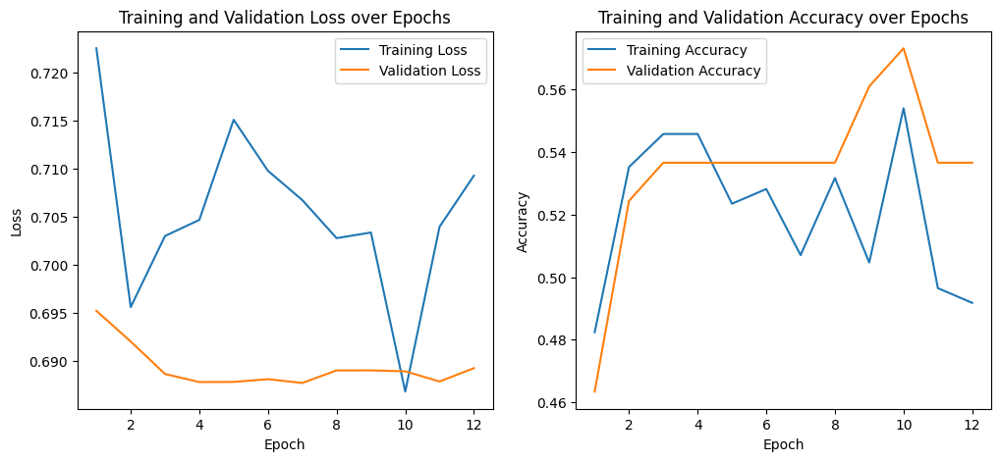

Test Loss: 0.6899, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7171, Val Loss: 0.6889, Train Acc: 0.5035, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7141, Val Loss: 0.6881, Train Acc: 0.5164, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6974, Val Loss: 0.6873, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7141, Val Loss: 0.6870, Train Acc: 0.5282, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7155, Val Loss: 0.6869, Train Acc: 0.5094, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7030, Val Loss: 0.6867, Train Acc: 0.5364, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.7098, Val Loss: 0.6867, Train Acc: 0.5129, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6964, Val Loss: 0.6866, Train Acc: 0.5493, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6964, Val Loss: 0.6865, Train Acc: 0.531

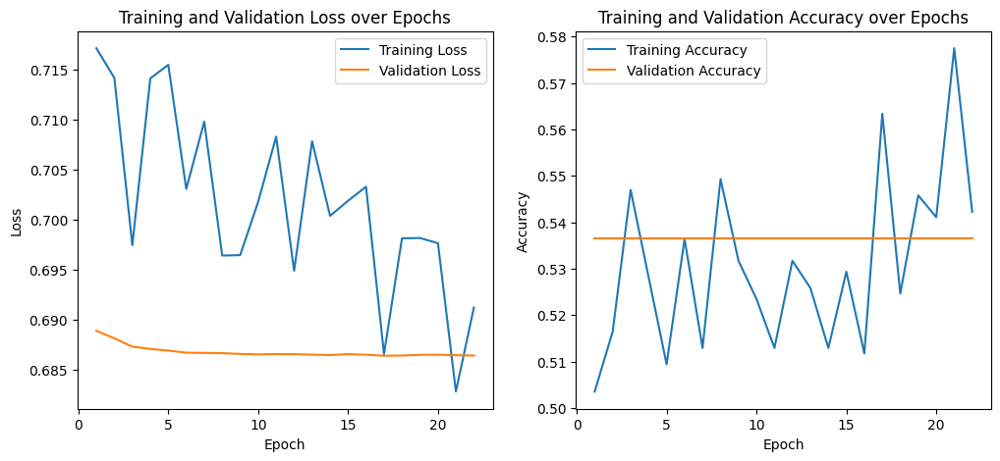

Test Loss: 0.6882, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 0.0001, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7062, Val Loss: 0.6898, Train Acc: 0.5282, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7046, Val Loss: 0.6890, Train Acc: 0.5282, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.6932, Val Loss: 0.6889, Train Acc: 0.5540, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7139, Val Loss: 0.6885, Train Acc: 0.5223, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.6930, Val Loss: 0.6881, Train Acc: 0.5446, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7022, Val Loss: 0.6878, Train Acc: 0.5469, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6909, Val Loss: 0.6876, Train Acc: 0.5516, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.7043, Val Loss: 0.6875, Train Acc: 0.5329, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6931, Val Loss: 0.6874, Train Acc: 

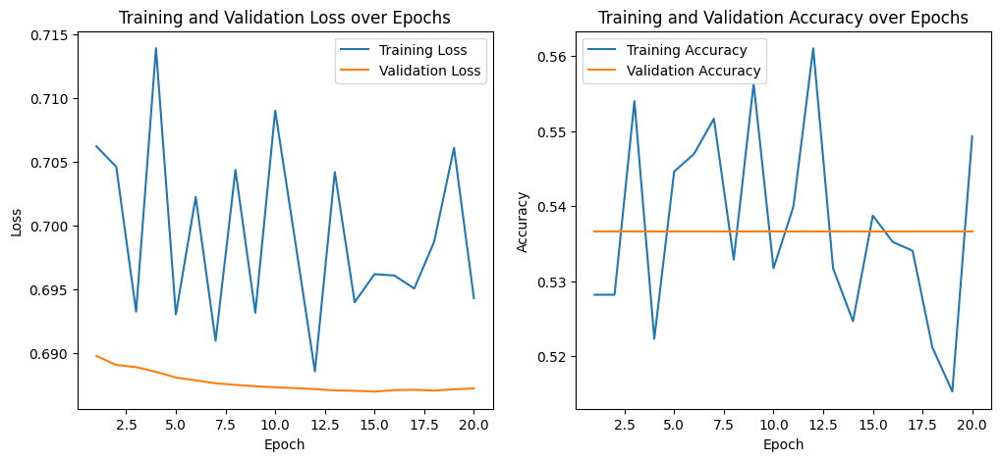

Test Loss: 0.6893, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7203, Val Loss: 0.6963, Train Acc: 0.4836, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7171, Val Loss: 0.6941, Train Acc: 0.5070, Val Acc: 0.4390
Epoch [3/100], Train Loss: 0.7092, Val Loss: 0.6930, Train Acc: 0.5094, Val Acc: 0.4756
Epoch [4/100], Train Loss: 0.7163, Val Loss: 0.6919, Train Acc: 0.4977, Val Acc: 0.4878
Epoch [5/100], Train Loss: 0.7034, Val Loss: 0.6908, Train Acc: 0.5106, Val Acc: 0.5122
Epoch [6/100], Train Loss: 0.7032, Val Loss: 0.6898, Train Acc: 0.4953, Val Acc: 0.5366
Epoch [7/100], Train Loss: 0.6969, Val Loss: 0.6892, Train Acc: 0.5364, Val Acc: 0.5610
Epoch [8/100], Train Loss: 0.6987, Val Loss: 0.6885, Train Acc: 0.5270, Val Acc: 0.5610
Epoch [9/100], Train Loss: 0.7115, Val Loss: 0.6879, Train Acc: 0.501

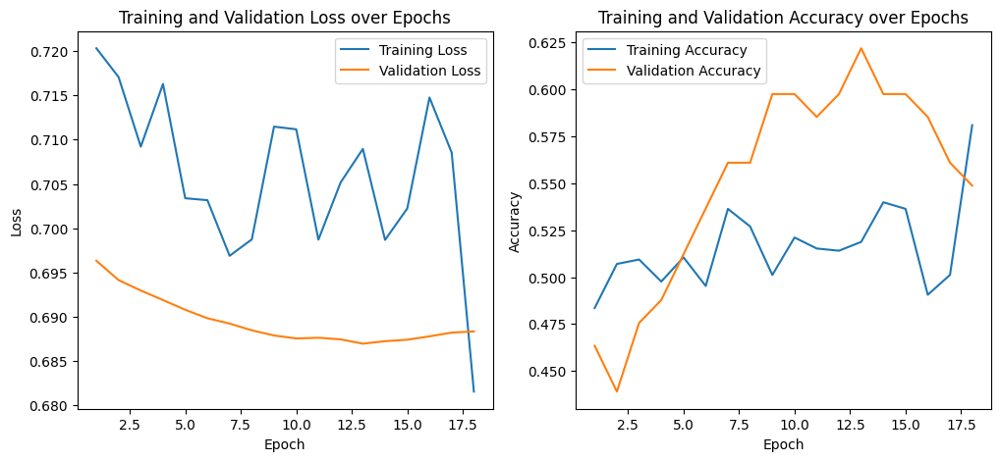

Test Loss: 0.6905, Accuracy: 54.88
Validation Accuracy: 54.88%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7020, Val Loss: 0.6891, Train Acc: 0.5200, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7041, Val Loss: 0.6881, Train Acc: 0.5305, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7088, Val Loss: 0.6873, Train Acc: 0.5293, Val Acc: 0.5732
Epoch [4/100], Train Loss: 0.7194, Val Loss: 0.6868, Train Acc: 0.5223, Val Acc: 0.5976
Epoch [5/100], Train Loss: 0.7098, Val Loss: 0.6867, Train Acc: 0.5329, Val Acc: 0.5854
Epoch [6/100], Train Loss: 0.6958, Val Loss: 0.6866, Train Acc: 0.5376, Val Acc: 0.5732
Epoch [7/100], Train Loss: 0.6958, Val Loss: 0.6865, Train Acc: 0.5317, Val Acc: 0.5854
Epoch [8/100], Train Loss: 0.6893, Val Loss: 0.6865, Train Acc: 0.5481, Val Acc: 0.5488
Epoch [9/100], Train Loss: 0.7118, Val Loss: 0.6865, Train Acc: 

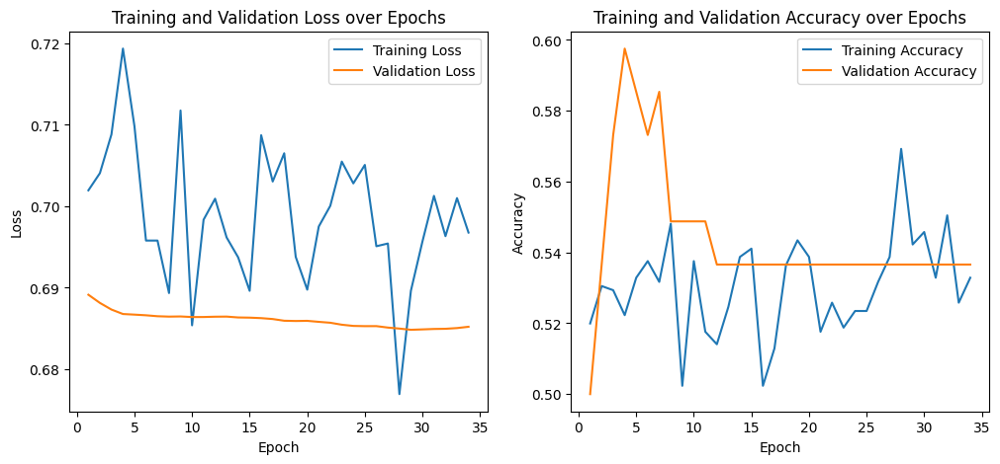

Test Loss: 0.6876, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7503, Val Loss: 0.6976, Train Acc: 0.4390, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7341, Val Loss: 0.6984, Train Acc: 0.5070, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7422, Val Loss: 0.6985, Train Acc: 0.4636, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7361, Val Loss: 0.6982, Train Acc: 0.4707, Val Acc: 0.4878
Epoch [5/100], Train Loss: 0.7550, Val Loss: 0.6981, Train Acc: 0.4472, Val Acc: 0.4878
Epoch [6/100], Train Loss: 0.7351, Val Loss: 0.6979, Train Acc: 0.4765, Val Acc: 0.4878
Early stopping triggered.


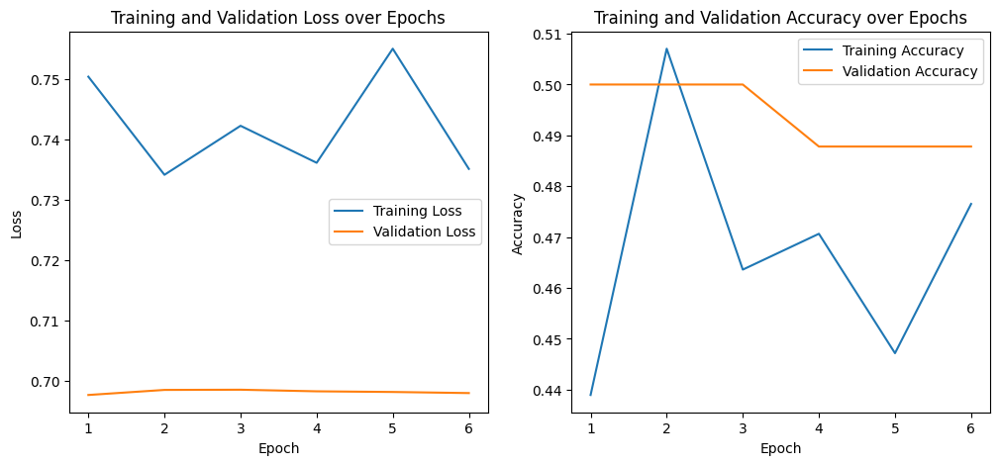

Test Loss: 0.6958, Accuracy: 48.78
Validation Accuracy: 48.78%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-05, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7285, Val Loss: 0.6978, Train Acc: 0.4871, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7280, Val Loss: 0.6981, Train Acc: 0.4824, Val Acc: 0.4634
Epoch [3/100], Train Loss: 0.7192, Val Loss: 0.6985, Train Acc: 0.5235, Val Acc: 0.4634
Epoch [4/100], Train Loss: 0.7374, Val Loss: 0.6984, Train Acc: 0.4730, Val Acc: 0.4634
Epoch [5/100], Train Loss: 0.7160, Val Loss: 0.6982, Train Acc: 0.5070, Val Acc: 0.4756
Epoch [6/100], Train Loss: 0.7263, Val Loss: 0.6980, Train Acc: 0.4789, Val Acc: 0.4756
Early stopping triggered.


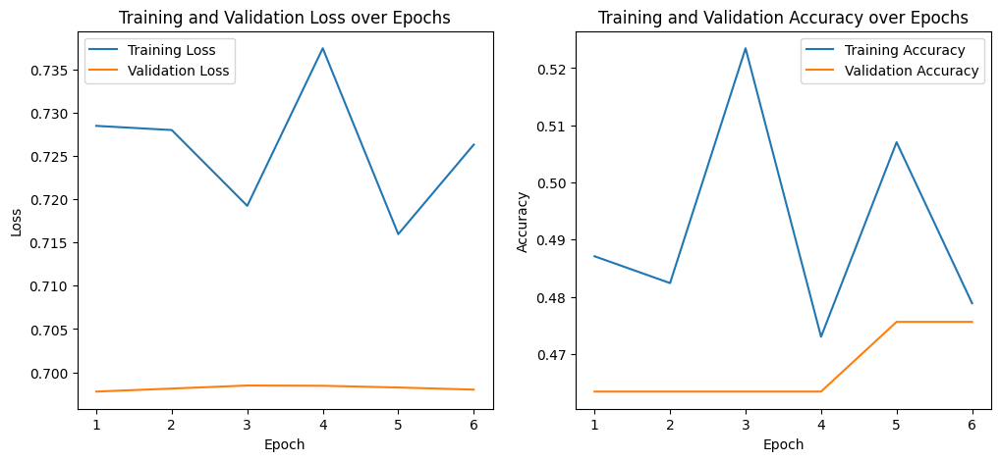

Test Loss: 0.6969, Accuracy: 47.56
Validation Accuracy: 47.56%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7078, Val Loss: 0.6949, Train Acc: 0.5012, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7100, Val Loss: 0.6942, Train Acc: 0.5153, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7179, Val Loss: 0.6943, Train Acc: 0.4953, Val Acc: 0.4878
Epoch [4/100], Train Loss: 0.7033, Val Loss: 0.6946, Train Acc: 0.5352, Val Acc: 0.4756
Epoch [5/100], Train Loss: 0.7017, Val Loss: 0.6945, Train Acc: 0.5106, Val Acc: 0.4756
Epoch [6/100], Train Loss: 0.7123, Val Loss: 0.6944, Train Acc: 0.4977, Val Acc: 0.4634
Epoch [7/100], Train Loss: 0.7006, Val Loss: 0.6944, Train Acc: 0.5364, Val Acc: 0.4634
Early stopping triggered.


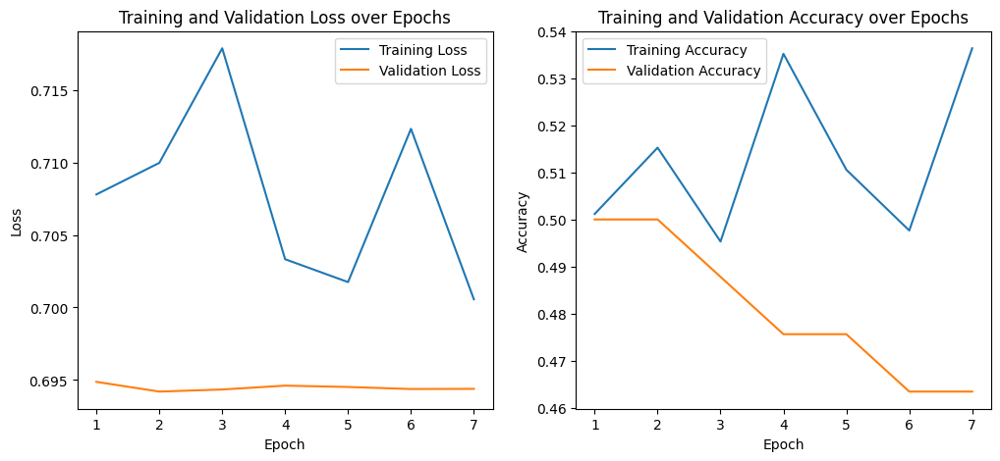

Test Loss: 0.6940, Accuracy: 46.34
Validation Accuracy: 46.34%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'Adam', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7513, Val Loss: 0.6901, Train Acc: 0.4613, Val Acc: 0.5366
Epoch [2/100], Train Loss: 0.7461, Val Loss: 0.6915, Train Acc: 0.4613, Val Acc: 0.5366
Epoch [3/100], Train Loss: 0.7240, Val Loss: 0.6914, Train Acc: 0.5035, Val Acc: 0.5366
Epoch [4/100], Train Loss: 0.7338, Val Loss: 0.6911, Train Acc: 0.4906, Val Acc: 0.5366
Epoch [5/100], Train Loss: 0.7147, Val Loss: 0.6911, Train Acc: 0.5082, Val Acc: 0.5366
Epoch [6/100], Train Loss: 0.7236, Val Loss: 0.6909, Train Acc: 0.4883, Val Acc: 0.5366
Early stopping triggered.


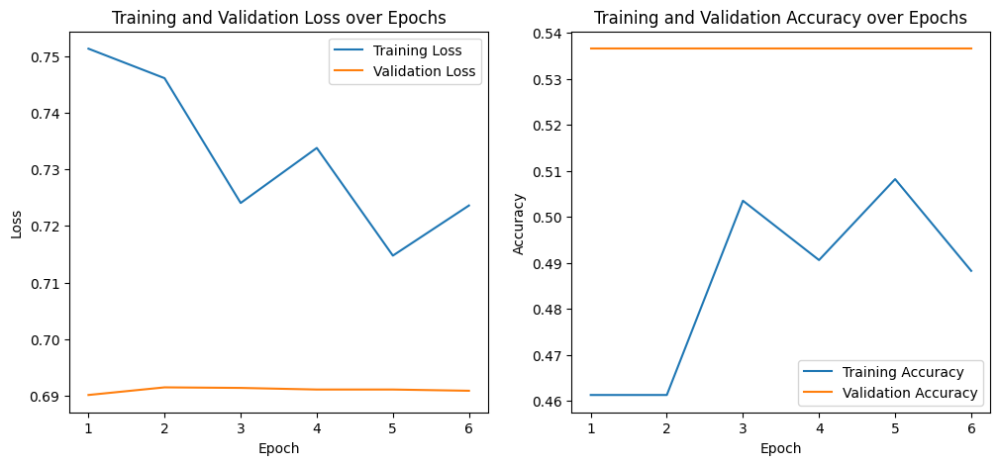

Test Loss: 0.6920, Accuracy: 53.66
Validation Accuracy: 53.66%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0}
Epoch [1/100], Train Loss: 0.7291, Val Loss: 0.6947, Train Acc: 0.5023, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7345, Val Loss: 0.6945, Train Acc: 0.5035, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7453, Val Loss: 0.6958, Train Acc: 0.4812, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7445, Val Loss: 0.6963, Train Acc: 0.4789, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7269, Val Loss: 0.6964, Train Acc: 0.4977, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7357, Val Loss: 0.6965, Train Acc: 0.4977, Val Acc: 0.5000
Epoch [7/100], Train Loss: 0.7215, Val Loss: 0.6965, Train Acc: 0.5012, Val Acc: 0.5000
Early stopping triggered.


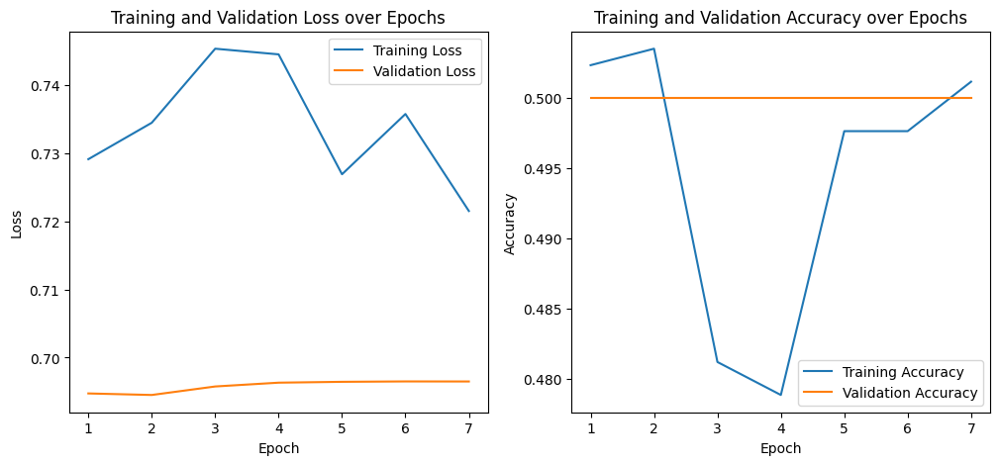

Test Loss: 0.6951, Accuracy: 50.00
Validation Accuracy: 50.00%
Training with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.6, 'learning_rate': 1e-06, 'optimizer': 'SGD', 'weight_decay': 0.0001}
Epoch [1/100], Train Loss: 0.7199, Val Loss: 0.6947, Train Acc: 0.4953, Val Acc: 0.5000
Epoch [2/100], Train Loss: 0.7072, Val Loss: 0.6952, Train Acc: 0.5317, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.7318, Val Loss: 0.6955, Train Acc: 0.4824, Val Acc: 0.5000
Epoch [4/100], Train Loss: 0.7154, Val Loss: 0.6956, Train Acc: 0.5223, Val Acc: 0.5000
Epoch [5/100], Train Loss: 0.7149, Val Loss: 0.6956, Train Acc: 0.5000, Val Acc: 0.5000
Epoch [6/100], Train Loss: 0.7244, Val Loss: 0.6957, Train Acc: 0.4894, Val Acc: 0.5000
Early stopping triggered.


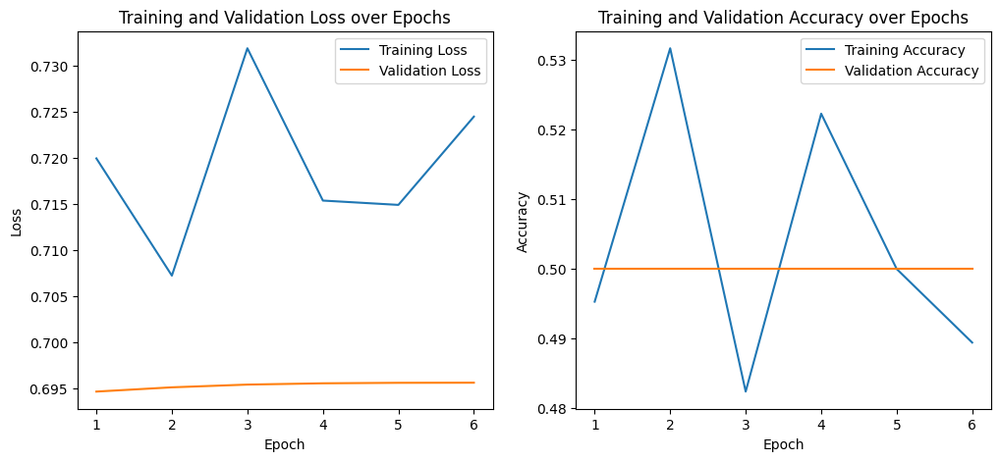

Test Loss: 0.6944, Accuracy: 50.00
Validation Accuracy: 50.00%
Best Validation Accuracy: 84.15% with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}


In [31]:
from sklearn.model_selection import ParameterGrid
import torch.optim as optim

# hyperparameter grid
param_grid = {
    'learning_rate': [1e-4, 1e-5, 1e-6],
    'batch_size': [32, 64, 16],
    'optimizer': ['Adam', 'SGD'],
    'weight_decay': [0, 1e-4],
    'dropout_rate': [0.3, 0.6],
    'criterion' : [nn.CrossEntropyLoss(), nn.BCEWithLogitsLoss()]
}


grid = list(ParameterGrid(param_grid))

def train_model_with_params(params):
    # Unpacking paramss
    learning_rate = params['learning_rate']
    batch_size = params['batch_size']
    optimizer_type = params['optimizer']
    weight_decay = params['weight_decay']
    dropout_rate = params['dropout_rate']
    criterion = params['criterion']

    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Initialize model with the specified dropout rate
    model = SimplifiedCNN(dropout_rate).to(device)
    
    # Choose the optimizer
    if optimizer_type == 'Adam':
        optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    elif optimizer_type == 'SGD':
        optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=weight_decay)

    #criterion = nn.CrossEntropyLoss()
    scheduler = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=learning_rate, steps_per_epoch=len(train_loader), epochs=10)

    train_losses, val_losses, train_accuracies, val_accuracies = train(model,device,criterion,optimizer,num_epochs=100)
    val_accuracy = test_model(model, val_loader, device, criterion)

    return val_accuracy, train_losses, val_losses

# Run Grid Search
best_accuracy = 0
best_params = None

for params in grid:
    print(f"Training with parameters: {params}")
    val_accuracy, train_losses, val_losses = train_model_with_params(params)
    print(f"Validation Accuracy: {val_accuracy:.2f}%")
    
    # Checking g if current combination is better
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = params

print(f"Best Validation Accuracy: {best_accuracy:.2f}% with parameters: {best_params}")


### Trying with best parameters

In [ ]:
#Best Validation Accuracy: 84.15% with parameters: {'batch_size': 16, 'criterion': BCEWithLogitsLoss(), 'dropout_rate': 0.3, 'learning_rate': 0.0001, 'optimizer': 'Adam', 'weight_decay': 0}

In [32]:
train_loader, val_loader, test_loader = create_dataloaders(transform,16)

Epoch [1/100], Train Loss: 1.1144, Val Loss: 0.6924, Train Acc: 0.5106, Val Acc: 0.4634
Epoch [2/100], Train Loss: 0.7133, Val Loss: 0.6868, Train Acc: 0.5270, Val Acc: 0.5000
Epoch [3/100], Train Loss: 0.6879, Val Loss: 0.6848, Train Acc: 0.5387, Val Acc: 0.6098
Epoch [4/100], Train Loss: 0.6672, Val Loss: 0.6832, Train Acc: 0.5704, Val Acc: 0.5610
Epoch [5/100], Train Loss: 0.6727, Val Loss: 0.6800, Train Acc: 0.5669, Val Acc: 0.5854
Epoch [6/100], Train Loss: 0.6569, Val Loss: 0.6732, Train Acc: 0.6103, Val Acc: 0.5610
Epoch [7/100], Train Loss: 0.6593, Val Loss: 0.6722, Train Acc: 0.6092, Val Acc: 0.5366
Epoch [8/100], Train Loss: 0.6440, Val Loss: 0.6710, Train Acc: 0.6338, Val Acc: 0.5366
Epoch [9/100], Train Loss: 0.6138, Val Loss: 0.6152, Train Acc: 0.6585, Val Acc: 0.6829
Epoch [10/100], Train Loss: 0.5794, Val Loss: 0.5880, Train Acc: 0.6784, Val Acc: 0.6707
Epoch [11/100], Train Loss: 0.5828, Val Loss: 0.5403, Train Acc: 0.6901, Val Acc: 0.7317
Epoch [12/100], Train Loss: 0.

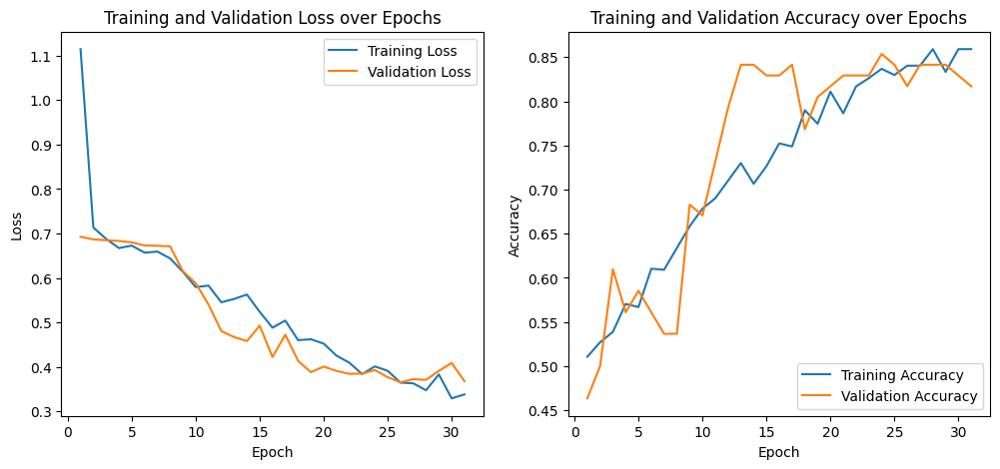

In [38]:
model = SimplifiedCNN().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-1)
train_losses, val_losses, train_accuracies, val_accuracies = train(model,device,criterion,optimizer,num_epochs=100)

In [39]:
accuracy = test_model(model, test_loader, device)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Loss: 0.3259, Accuracy: 87.50
Test Accuracy: 87.50%
